# Load libraries

In [1]:
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import scipy.io as io
from scipy.sparse import csr_matrix
import logging
import os
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import math
import gc
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from imblearn.over_sampling import SMOTE
import random
from sklearn.utils import shuffle
import combat
import patsy
logging.basicConfig(level=logging.INFO)
savepath = 'Lupus_study_adjusted_V3.h5ad'
nonormpath = 'Lupus_study_nonorm.h5ad'

# Read data

In [2]:
%matplotlib inline
##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
adata = sc.read(savepath, cache=True)
print('Processed dataset: {}'.format(adata))
figdir = "./figures."
sc.settings.figdir = "./figures."
MASTERCOLORS = sc.pl.palettes.default_64
MASTERCOLORS.remove("#FEFFE6")
MASTERCOLORS.remove("#FFFF00")


Processed dataset: AnnData object with n_obs × n_vars = 912434 × 1000 
    obs: 'Broad', 'CD127|IL7R|j95-27|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD196|CCR6|j95-17|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD38|CD38|j95-01|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD95|FAS|j95-02|pAbO', 'Female', 'HLA-DR|CD74|j95-18|pAbO', 'Prob(doublet)', 'SOURCE', 'batch', 'batch_cov', 'ct_cov', 'disease_cov', 'ind_cov', 'pop_cov', 'well', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'TTTY15', 'HBA2', 'PC2', 'PC3', 'PC10', 'PC15', 'PC16', 'PC39', 'leiden', 'site', 'disease_pop_site_cov', 'ind_cov_disease_cov', 'SLE status'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dif

In [3]:
adata.obs['ind_cov'][adata.obs['ind_cov']=='1771'] = '1771_1771'
adata.obs['ind_cov'][adata.obs['ind_cov']=='1791'] = '1791_1791'
adata.obs['ind_cov'][adata.obs['ind_cov']=='1240'] = '904425200_904425200'
adata.obs['ind_cov'][adata.obs['ind_cov']=='FLARE003'] = '904194200_904194200'
adata.obs['ind_cov'][adata.obs['ind_cov']=='FLARE008'] = '1763_1763'

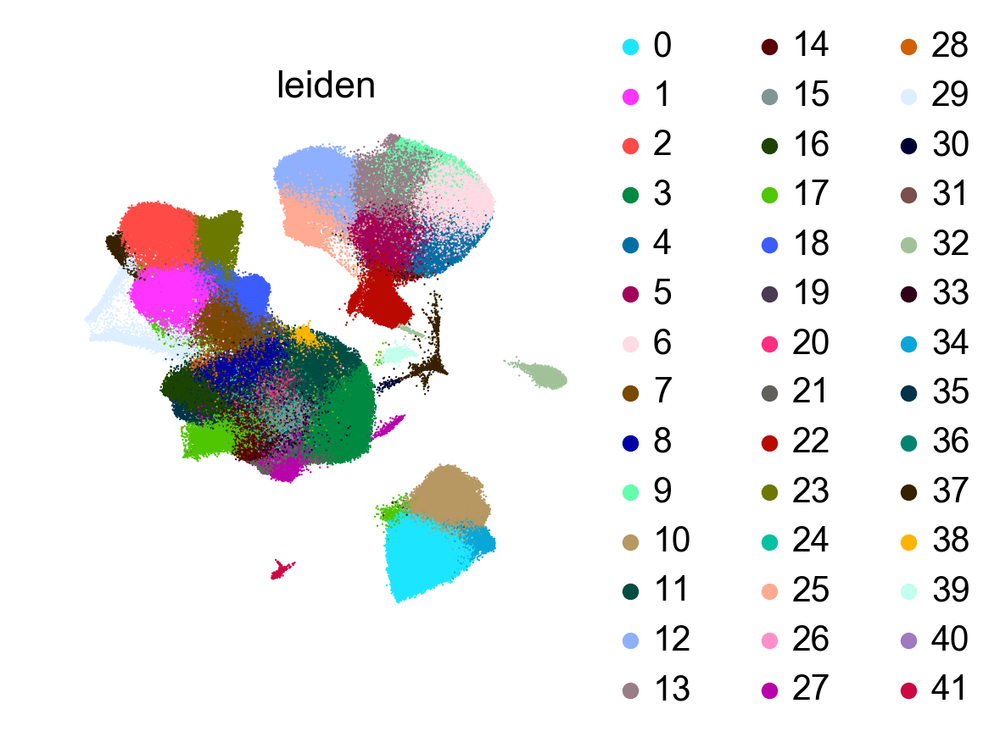

In [4]:
sc.pl.umap(adata, color='leiden', size=3, show=True, edgecolor="none", save='.leiden.png', palette=MASTERCOLORS)

# Most expressed genes per leiden group

In [5]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(adata.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = adata.var_names[np.flipud(np.argsort(np.mean(adata.X[adata.obs['leiden'] == str(ii)], axis=0)))]
GeneRanks.to_csv('Flare_study_top_expression.csv')
GeneRanks.head(10)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12,leiden_13,leiden_14,leiden_15,leiden_16,leiden_17,leiden_18,leiden_19,leiden_20,leiden_21,leiden_22,leiden_23,leiden_24,leiden_25,leiden_26,leiden_27,leiden_28,leiden_29,leiden_30,leiden_31,leiden_32,leiden_33,leiden_34,leiden_35,leiden_36,leiden_37,leiden_38,leiden_39,leiden_40,leiden_41
0,CD79A,GZMH,KLRF1,RP11-291B21.2,S100A12,LGALS2,S100A8,GZMK,TNFRSF4,IL1B,RP5-887A10.1,RPL21,CDKN1C,APOBEC3A,RPL21,RPL21,RTKN2,PF4,KLRB1,HIST1H1D,TSHZ2,RPS4Y1,FCER1A,XCL1,C1orf56,C1QA,MIR4435-1HG,SOX4,LINC00152,KIAA0101,HBA2,S100A9,LILRA4,STMN1,FCRL5,IFIT3,RNU12,HBA2,C1QA,CD9,CD1C,MZB1
1,TCL1A,CCL5,PRF1,CD8B,S100A8,LYZ,S100A9,CCL5,IL32,IL8,MS4A1,CCR7,FCGR3A,IFITM3,HLA-DQA1,CCR7,RP11-1399P15.1,TSC22D1,GZMK,CD69,PRKCQ-AS1,RPL21,CLEC10A,XCL2,CDC42SE1,C1QB,LINC00152,CHI3L2,MIR4435-1HG,STMN1,HBB,LYZ,SERPINF1,KIAA0101,MS4A1,IFIT1,LINC00910,HBA1,C1QB,TPM1,FCER1A,IGJ
2,MS4A1,NKG7,SPON2,S100B,S100A9,CTSS,S100A12,DUSP2,GATA3,G0S2,BANK1,PRKCQ-AS1,MS4A7,TYMP,FCER1A,PRKCQ-AS1,IL2RA,ACRBP,SLC4A10,TRAT1,LINC00861,EIF1AY,CD1C,KLRC1,RP11-138A9.2,FCGR3A,S100A9,ITM2A,IL32,MKI67,HBA1,S100A8,ITM2C,CENPF,CD79A,MX1,TMEM107,HBB,RPL21,GP1BA,CLEC10A,TNFRSF17
3,CD79B,FGFBP2,GZMB,CD8A,VCAN,FTL,VCAN,LYAR,KLRB1,S100A9,CD79A,LINC00861,HES4,ISG15,GPR183,TXK,TIGIT,RPL21,KLRG1,HIST1H1C,CCR7,TTTY15,HLA-DQA1,GNLY,APOBEC3C,MS4A7,S100A8,PRSS57,DUSP4,TYMS,RPL21,CTSS,PLD4,RPL21,HSPB1,ISG15,WDR74,ALAS2,IL32,GMPR,RPL21,DERL3
4,VPREB3,IL32,GNLY,RPL21,LYZ,GPX1,MNDA,CMC1,RORA,S100A8,AL928768.3,TXK,RP11-290F20.3,IFI6,CLEC10A,CD79A,ARID5B,RP11-367G6.3,DUSP2,HIST1H4C,GPR183,JUN,HLA-DPB1,CMC1,RPL21,LST1,LYZ,STMN1,GATA3,TK1,CCR7,CSTA,TPM2,CCR7,FCRL2,IFI6,RPPH1,HBD,CCR7,CLEC1B,CCR7,ITM2C
5,FCER2,CST7,FGFBP2,CCR7,CSTA,AIF1,LYZ,IL32,MAF,LYZ,AC079767.4,LBH,LST1,AIF1,CD1C,MS4A1,IKZF2,PPBP,NCR3,JUN,RPL21,DDX3Y,HLA-DQB1,KLRF1,PIP4K2A,HES4,S100A12,CYTL1,ARID5B,CENPF,PRKCQ-AS1,VCAN,LRRC26,MKI67,CD19,IFIT2,RPL21,CA1,PRKCQ-AS1,C19orf33,PRKCQ-AS1,IGLL5
6,RPL21,GZMA,CLIC3,LBH,MNDA,HLA-DRA,FCN1,PIK3R1,CD69,EREG,RALGPS2,GZMB,AIF1,FTL,HLA-DPA1,LINC00861,BIRC3,GNG11,CCL5,HIST1H1E,TRAT1,PRKCQ-AS1,HLA-DPA1,IL2RB,PRKCQ-AS1,AIF1,VCAN,RPL21,RGS1,NUSAP1,LBH,S100A6,SCT,PRKCQ-AS1,FCRL3,STAT1,RPS4Y1,FGFBP2,C1QC,LGALS12,BIRC3,AL928768.3
7,LINC00926,CD8A,NKG7,PRKCQ-AS1,GPX1,FTH1,CSTA,GZMA,TNFRSF18,S100A12,COBLL1,CD247,IFITM3,FCN1,PLD4,LBH,IL32,HIST1H2AC,LYAR,ZNF331,TXK,RNU12,CPVL,CTSW,CCR7,RP11-290F20.3,CSTA,CCR7,MIAT,BIRC5,STMN1,MNDA,IGJ,NUSAP1,FCRLA,SAMD9,EIF1AY,PRF1,LINC00861,FERMT3,TXK,HRASLS2
8,CD74,GNLY,KLRB1,TXK,CTSS,CPVL,RP11-1143G9.4,CD8B,LMNA,CCL3,CD79B,CD79A,RHOC,CTSS,HLA-DQB1,CD79B,RGS1,RGS18,GZMA,RPL21,TTN,CCR7,HLA-DRB1,SPTSSB,LINC00861,C1QC,GPX1,SPINK2,ALOX5AP,RRM2,TXK,S100A12,PPP1R14B,MS4A1,PPP1R14A,NT5C3A,SNORD3B-2,AHSP,CD8B,ESAM,LBH,CD38
9,RALGPS2,KLRG1,CST7,CTSW,FCN1,HLA-DRB1,CD14,CST7,CRIP1,FCN1,IGJ,PRF1,FCER1G,LGALS2,ITM2C,RALGPS2,CD27,SDPR,IL32,PRKCQ-AS1,ARID5B,WDR74,HLA-DRA,KLRD1,TXK,CDKN1C,CTSS,GATA2,SYNE2,TOP2A,LINC00861,FCN1,UGCG,HSPB1,HLA-DQA1,XAF1,DDX3Y,SPON2,CD69,TPM4,HLA-DOB,FKBP11


# Label cell populations

In [6]:
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('object')
adata.obs['ct_cov'].loc[adata.obs.leiden == "0"] = "B Cells" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "1"] = "Cytotoxic T Cells" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "2"] = "Natural Killer Cells" ## good                                                                                     
adata.obs['ct_cov'].loc[adata.obs.leiden == "3"] = "Naive T Cells" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "4"] = "Classical Monocytes" ## good    Effector Memory T Cells                                                                                 
adata.obs['ct_cov'].loc[adata.obs.leiden == "5"] = "Classical Monocytes" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "6"] = "Classical Monocytes" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "7"] = "Cytotoxic T Cells" ## good        Nonclassical Monocytes                                                                            
adata.obs['ct_cov'].loc[adata.obs.leiden == "8"] = "Effector Memory T Cells" ## good     Classical Dendritic Cells                                                                               
adata.obs['ct_cov'].loc[adata.obs.leiden == "9"] = "Classical Monocytes" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "10"] = "B Cells" ## good     Megakaryocytes                                                                             
adata.obs['ct_cov'].loc[adata.obs.leiden == "11"] = "Naive T Cells" ## good Plasmacytoid Dendritic Cells                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "12"] = "Nonclassical Monocytes" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "13"] = "Classical Monocytes" ## good  Macro    Proliferating T Cells                                                                             
adata.obs['ct_cov'].loc[adata.obs.leiden == "14"] = "Doublets" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "15"] = "Naive T Cells" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "16"] = "T-Reg T Cells" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "17"] = "Doublets" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "18"] = "Cytotoxic T Cells" ## good  
adata.obs['ct_cov'].loc[adata.obs.leiden == "19"] = "Naive T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "20"] = "Naive T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "21"] = "Naive T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "22"] = "Classical Dendritic Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "23"] = "Natural Killer Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "24"] = "Naive T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "25"] = "Nonclassical Monocytes" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "26"] = "Classical Monocytes" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "27"] = "Progenitor Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "28"] = "Effector Memory T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "29"] = "Proliferating T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "30"] = "RBCs" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "31"] = "Classical Monocytes" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "32"] = "Plasmacytoid Dendritic Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "33"] = "Naive T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "34"] = "B Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "35"] = "Naive T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "36"] = "Naive T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "37"] = "RBCs" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "38"] = "Naive T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "39"] = "Megakaryocytes" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "40"] = "Naive T Cells" ## good
adata.obs['ct_cov'].loc[adata.obs.leiden == "41"] = "B Cells" ## good
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


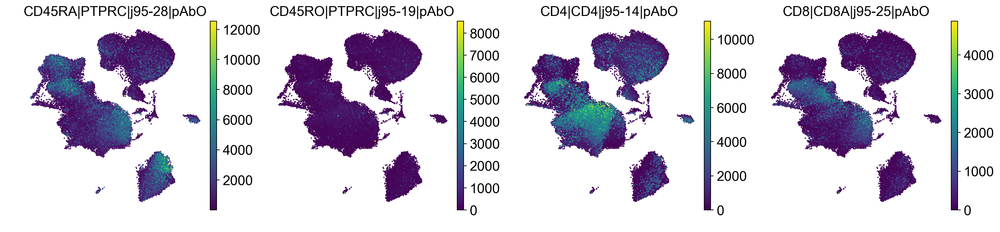

In [7]:
sc.pl.umap(adata, color=['CD45RA|PTPRC|j95-28|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD8|CD8A|j95-25|pAbO'], size=10)

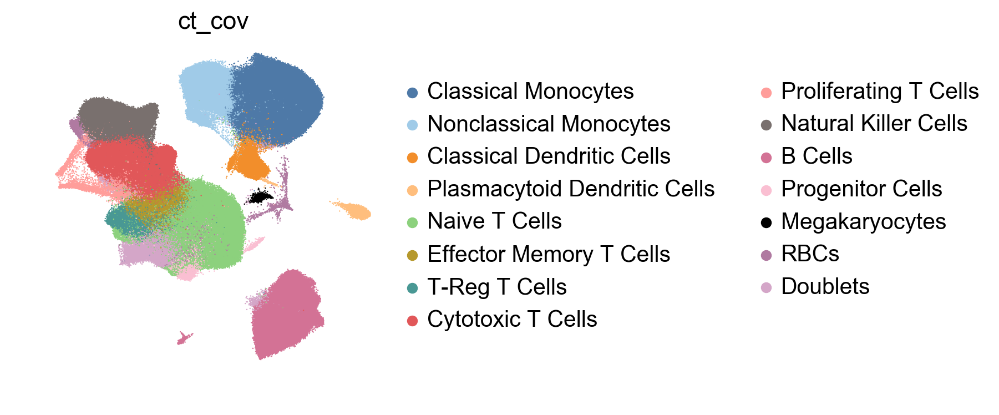

In [8]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
MasterORDER = ['Classical Monocytes','Nonclassical Monocytes', 'Classical Dendritic Cells', 'Plasmacytoid Dendritic Cells', 'Naive T Cells', 'Effector Memory T Cells', 'T-Reg T Cells', 'Cytotoxic T Cells', 'Proliferating T Cells', 'Natural Killer Cells', 'B Cells', 'Progenitor Cells', 'Megakaryocytes', 'RBCs', 'Doublets']
#colorrs = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E",'#BC23FF', '#D790FF']
colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E","#D37295","#FABFD2", '#000000',"#B07AA1","#D4A6C8","#9D7660",
                 "#E58606", "#5D69B1", "#24796C", '#DAA51B', '#000000', '#99C945', '#ED645A']

adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', show=True, size=3, edgecolor="none")

# Remove RBCs and Doublets from further analysis

In [9]:
adata = adata[~adata.obs['ct_cov'].isin(['RBCs', 'Doublets'])]

Trying to set attribute `.obs` of view, copying.


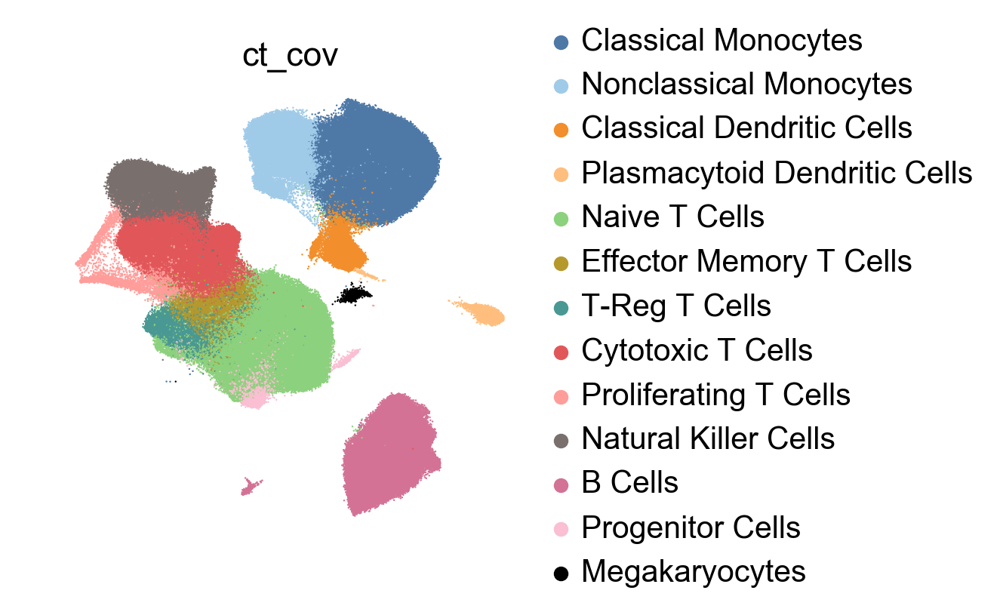

In [10]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
MasterORDER = ['Classical Monocytes','Nonclassical Monocytes', 'Classical Dendritic Cells', 'Plasmacytoid Dendritic Cells', 'Naive T Cells', 'Effector Memory T Cells', 'T-Reg T Cells','Cytotoxic T Cells', 'Proliferating T Cells', 'Natural Killer Cells', 'B Cells', 'Progenitor Cells', 'Megakaryocytes']
#colorrs = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E",'#BC23FF', '#D790FF']
colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E","#D37295","#FABFD2", '#000000',"#B07AA1","#D4A6C8","#9D7660",
                 "#E58606", "#5D69B1", "#24796C", '#DAA51B', '#000000', '#99C945', '#ED645A']

adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', show=True, size=3, edgecolor="none")

# Proportions and Statistics

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


as a proportion of total PBMC: Healthy vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,Beta,Cell,Pval
0,-13.090651452071665,Classical Monocytes,8.410406e-16
1,-1.7577442927520934,Nonclassical Monocytes,2.290530e-05
2,0.14589312724672493,Classical Dendritic Cells,1.988405e-01
3,0.49636133866496834,Plasmacytoid Dendritic Cells,1.406248e-22
4,19.16752782678819,Naive T Cells,1.073560e-33
5,-1.1232457924801609,Effector Memory T Cells,5.880422e-03
6,-0.03182085043534097,T-Reg T Cells,8.682762e-01
7,-4.2492088695629455,Cytotoxic T Cells,1.251671e-03
8,-0.30082943728217193,Proliferating T Cells,7.633383e-05
9,0.7161429579626333,Natural Killer Cells,2.364515e-01


as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-10.839086560257583,Classical Monocytes,0.002815
1,-1.1000220005897372,Nonclassical Monocytes,0.197561
2,1.060187106568526,Classical Dendritic Cells,0.000293
3,0.6877967002840029,Plasmacytoid Dendritic Cells,0.000329
4,13.927728611364017,Naive T Cells,0.000989
5,0.1766422749456844,Effector Memory T Cells,0.870335
6,0.1873414812612883,T-Reg T Cells,0.697601
7,-7.42628586701227,Cytotoxic T Cells,0.021322
8,-0.4931359778273139,Proliferating T Cells,0.000408
9,-5.102001202495991,Natural Killer Cells,0.015359


as a proportion of total PBMC: Healthy vs. Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-6.033506313926168,Classical Monocytes,0.023220
1,0.5968338706846787,Nonclassical Monocytes,0.282385
2,1.0075961476892785,Classical Dendritic Cells,0.000001
3,0.6121593289331984,Plasmacytoid Dendritic Cells,0.000003
4,13.364820725979916,Naive T Cells,0.000003
5,-1.025498429953013,Effector Memory T Cells,0.125117
6,-0.8851773935395859,T-Reg T Cells,0.017283
7,-7.484262267683507,Cytotoxic T Cells,0.000162
8,-0.8645308241503797,Proliferating T Cells,0.000003
9,0.793095209739455,Natural Killer Cells,0.526620


as a proportion of total PBMC: Treated vs. Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,4.80558024633141,Classical Monocytes,0.545410
1,1.6968558712744133,Nonclassical Monocytes,0.128722
2,-0.05259095887924724,Classical Dendritic Cells,0.854974
3,-0.07563737135080481,Plasmacytoid Dendritic Cells,0.360381
4,-0.5629078853841163,Naive T Cells,0.863598
5,-1.2021407048986976,Effector Memory T Cells,0.325211
6,-1.0725188748008754,T-Reg T Cells,0.149044
7,-0.057976400671240214,Cytotoxic T Cells,0.990727
8,-0.3713948463230657,Proliferating T Cells,0.488956
9,5.895096412235446,Natural Killer Cells,0.056984


as a proportion of total PBMC: Treated vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-2.251564891814078,Classical Monocytes,0.680731
1,-0.6577222921623573,Nonclassical Monocytes,0.644890
2,-0.9142939793218006,Classical Dendritic Cells,0.020384
3,-0.19143536161903504,Plasmacytoid Dendritic Cells,0.073833
4,5.239799215424162,Naive T Cells,0.180252
5,-1.2998880674258453,Effector Memory T Cells,0.345059
6,-0.2191623316966299,T-Reg T Cells,0.732388
7,3.1770769974493223,Cytotoxic T Cells,0.498882
8,0.19230654054514207,Proliferating T Cells,0.488350
9,5.818144160458627,Natural Killer Cells,0.005284


as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-13.003519186231983,Classical Monocytes,2.110423e-15
1,-1.7322914027120455,Nonclassical Monocytes,2.188894e-05
2,0.18003476730446188,Classical Dendritic Cells,1.116378e-01
3,0.5038237634616614,Plasmacytoid Dendritic Cells,5.518959e-24
4,18.96475526631489,Naive T Cells,1.804896e-34
5,-1.0729420268349568,Effector Memory T Cells,8.120344e-03
6,-0.023339588972763614,T-Reg T Cells,9.009833e-01
7,-4.372157099277024,Cytotoxic T Cells,9.979434e-04
8,-0.3082714189343148,Proliferating T Cells,5.094474e-05
9,0.4909892946035219,Natural Killer Cells,4.395830e-01


as a proportion of total PBMC: Healthy vs. Treated&Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-10.839086560257583,Classical Monocytes,0.002815
1,-1.1000220005897372,Nonclassical Monocytes,0.197561
2,1.060187106568526,Classical Dendritic Cells,0.000293
3,0.6877967002840029,Plasmacytoid Dendritic Cells,0.000329
4,13.927728611364017,Naive T Cells,0.000989
5,0.1766422749456844,Effector Memory T Cells,0.870335
6,0.1873414812612883,T-Reg T Cells,0.697601
7,-7.42628586701227,Cytotoxic T Cells,0.021322
8,-0.4931359778273139,Proliferating T Cells,0.000408
9,-5.102001202495991,Natural Killer Cells,0.015359


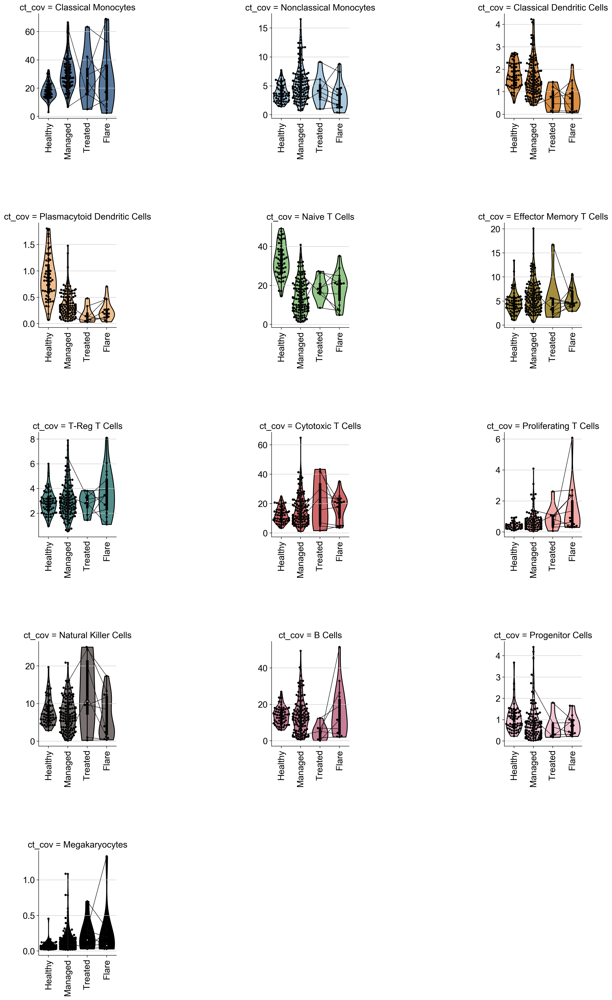

In [11]:
## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov','disease_cov','pop_cov', 'ind_cov'])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_disease_cov==ind_count_sums.ind_cov_disease_cov[ii]] = ind_count_sums.counts[ii]


ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
#ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

perc_plot = sns.catplot(x='disease_cov', y='ct_perc', order=[ "Healthy", "Managed", "Treated", "Flare"], hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=3, cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], order=[ "Healthy", "Managed", "Treated", "Flare"], color="0", size=4, ax=perc_plot.axes[ct_i])
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], order=[ "Healthy", "Managed", "Treated", "Flare"], color="0", scale=0.3, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=2, hspace = 1)
    
perc_plot.savefig(figdir+"/violin.ct_cov_figure6b.png")
perc_plot.savefig(figdir+"/violin.ct_cov_figure6b.pdf")

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Managed'])]
HEALTHYMANAGED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Managed"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYMANAGED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated'])]
HEALTHYTREATED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Treated"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYTREATED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Flare'])]
HEALTHYFLARE_effect = {}
HEALTHYFLARE_FC = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYFLARE_effect[ct] = effect
    HEALTHYFLARE_FC[ct] = math.log2(sum(est.params)/est.params[0])
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Treated', 'Flare'])]
TREATEDFLARE_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Treated"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    TREATEDFLARE_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Treated', 'Managed'])]
TREATEDMANAGED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Managed"] = 0
    disease.values[disease=="Treated"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    TREATEDMANAGED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated', 'Untreated', 'Managed'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="Healthy"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated&Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated', 'Untreated'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="Healthy"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)


# Separate test set from train set

In [38]:
sample_holdout = 0.25
testset = np.random.choice(np.unique(adata.obs['ind_cov'].tolist()), size=int(np.round(len(np.unique(adata.obs['ind_cov'].tolist()))*sample_holdout)), replace=False)
Test = adata[adata.obs['ind_cov'].isin(testset)]
Train = adata[~adata.obs['ind_cov'].isin(testset)]
print('Test dataset n people: {}'.format(len(np.unique(Test.obs['ind_cov'].tolist()))))
print('Test dataset: {}'.format(Test))
print('Train dataset n people: {}'.format(len(np.unique(Train.obs['ind_cov'].tolist()))))
print('Train dataset: {}'.format(Train))


Test dataset n people: 48
Test dataset: View of AnnData object with n_obs × n_vars = 229085 × 1000 
    obs: 'Broad', 'CD127|IL7R|j95-27|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD196|CCR6|j95-17|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD38|CD38|j95-01|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD95|FAS|j95-02|pAbO', 'Female', 'HLA-DR|CD74|j95-18|pAbO', 'Prob(doublet)', 'SOURCE', 'batch', 'batch_cov', 'ct_cov', 'disease_cov', 'ind_cov', 'pop_cov', 'well', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'TTTY15', 'HBA2', 'PC2', 'PC3', 'PC10', 'PC15', 'PC16', 'PC39', 'leiden', 'site', 'disease_pop_site_cov', 'ind_cov_disease_cov', 'SLE status'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'di

# Get differential gene expression for each cell population in psuedobulk

In [39]:
def get_pseudobulk(adata):
    genes = adata.raw.var_names.tolist()
    people = np.unique(adata.obs['ind_cov'].tolist())
    pseudobulk = pd.DataFrame(index=genes, columns=people)
    for ii in range(len(people)):
        fdata = adata[adata.obs['ind_cov']==people[ii]]
        pseudobulk[people[ii]] = np.ravel(np.sum(fdata.raw.X, axis=0)/len(fdata))
    return pseudobulk

def compute_LogFC(pseudobulk, SLE_people, healthy_people):
    logFC = {}; pval  = {}
    genes = pseudobulk.transpose().keys().tolist()
    for ii in range(len(genes)):
        h = pseudobulk[healthy_people].transpose()[genes[ii]].values
        s = pseudobulk[SLE_people].transpose()[genes[ii]].values
        _, p = stats.ranksums(s,h)
        pval[genes[ii]] = p
        s = np.nanmean(s)
        h = np.nanmean(h)
        logFC[genes[ii]] = np.log2(np.divide(s+10**-3,h+10**-3))
    return logFC, pval

def make_volcanoplot(logFC, pval, title):
    num_std = 6 # Number of standard deviations above/below mean for gene log2 FC cutoff.
    pval_cutoff = 9 # 10^-n (0.001/~39000) allows for 1/1000 false alarm rate corrected for # genes
    s = np.std(np.asarray(list(logFC.values())))
    upper = np.mean(np.asarray(list(logFC.values()))) + (np.std(np.asarray(list(logFC.values())))*num_std)
    lower = np.mean(np.asarray(list(logFC.values()))) - (np.std(np.asarray(list(logFC.values())))*num_std)
    genes = np.asarray(list(logFC.keys()))
    x = np.asarray(list(logFC.values()))
    y = np.log10(list(pval.values()))*-1
    sc.settings.set_figure_params(dpi=150, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=12)
    # Plot non-significant values
    sns.scatterplot(x[(x<=upper) & (x>=lower) & (y<=pval_cutoff)], y[(x<=upper) & (x>=lower) & (y<=pval_cutoff)], color=[0.5, 0.5, 0.5], alpha=0.2)
    sns.scatterplot(x[(x<upper) & (y>pval_cutoff)], y[(x<upper) & (y>pval_cutoff)], color=[0.5, 0.5, 0.5], alpha=0.2)
    sns.scatterplot(x[(x>lower) & (y>pval_cutoff)], y[(x>lower) & (y>pval_cutoff)], color=[0.5, 0.5, 0.5], alpha=0.2)
    # Plot significant values
    sns.scatterplot(x[(x>upper) & (y>pval_cutoff)], y[(x>upper) & (y>pval_cutoff)], color='#a1caf1')
    sns.scatterplot(x[(x<lower) & (y>pval_cutoff)], y[(x<lower) & (y>pval_cutoff)], color='#a1caf1')
    plt.xlabel('Log2 Fold Change')
    plt.ylabel('-log10 p-value')
    plt.title('Volcano plot: {}'.format(title))
    for ii in range(len(genes[(x>upper) & (y>pval_cutoff)])):
        plt.text(x[(x>upper) & (y>pval_cutoff)][ii], y[(x>upper) & (y>pval_cutoff)][ii], s=genes[(x>upper) & (y>pval_cutoff)][ii], fontsize=5)

    for ii in range(len(genes[(x<lower) & (y>pval_cutoff)])):
        plt.text(x[(x<lower) & (y>pval_cutoff)][ii], y[(x<lower) & (y>pval_cutoff)][ii], s=genes[(x<lower) & (y>pval_cutoff)][ii], fontsize=5)
    
    URG = genes[(x>upper) & (y>pval_cutoff)]
    DRG = genes[(x<lower) & (y>pval_cutoff)]
    return URG, DRG
    

## Log2 FC for Total PBMC psuedobulk

In [41]:
def get_totalPBMC_log2FC(adata):
    healthy_people = np.unique(adata.obs['ind_cov'][adata.obs['SLE status']=='Healthy'].tolist())
    SLE_people = np.unique(adata.obs['ind_cov'][adata.obs['SLE status']=='SLE'].tolist())
    pseudobulk_totalPBMC = get_pseudobulk(adata)
    logFC_totalPBMC, pval_totalPBMC = compute_LogFC(pseudobulk_totalPBMC, SLE_people, healthy_people)
    data = pd.DataFrame(list(logFC_totalPBMC.values()), index=list(logFC_totalPBMC.keys()), columns=['Log2FC'])
    data2 = pd.DataFrame(list(pval_totalPBMC.values()), index=list(pval_totalPBMC.keys()), columns=['p-value'])
    data = pd.concat([data, data2], axis=1)
    data = data.transpose()
    data.to_csv('Log2FC-SLEvsHealthy-totalPBMC-TRAIN-holdout.csv')
    return logFC_totalPBMC, pval_totalPBMC

#logFC_totalPBMC, pval_totalPBMC = get_totalPBMC_log2FC(Train)

tmp = pd.read_csv('Log2FC-SLEvsHealthy-totalPBMC-TRAIN-holdout.csv', index_col=0)
logFC_totalPBMC = tmp.transpose()['Log2FC'].to_dict()
pval_totalPBMC = tmp.transpose()['p-value'].to_dict()

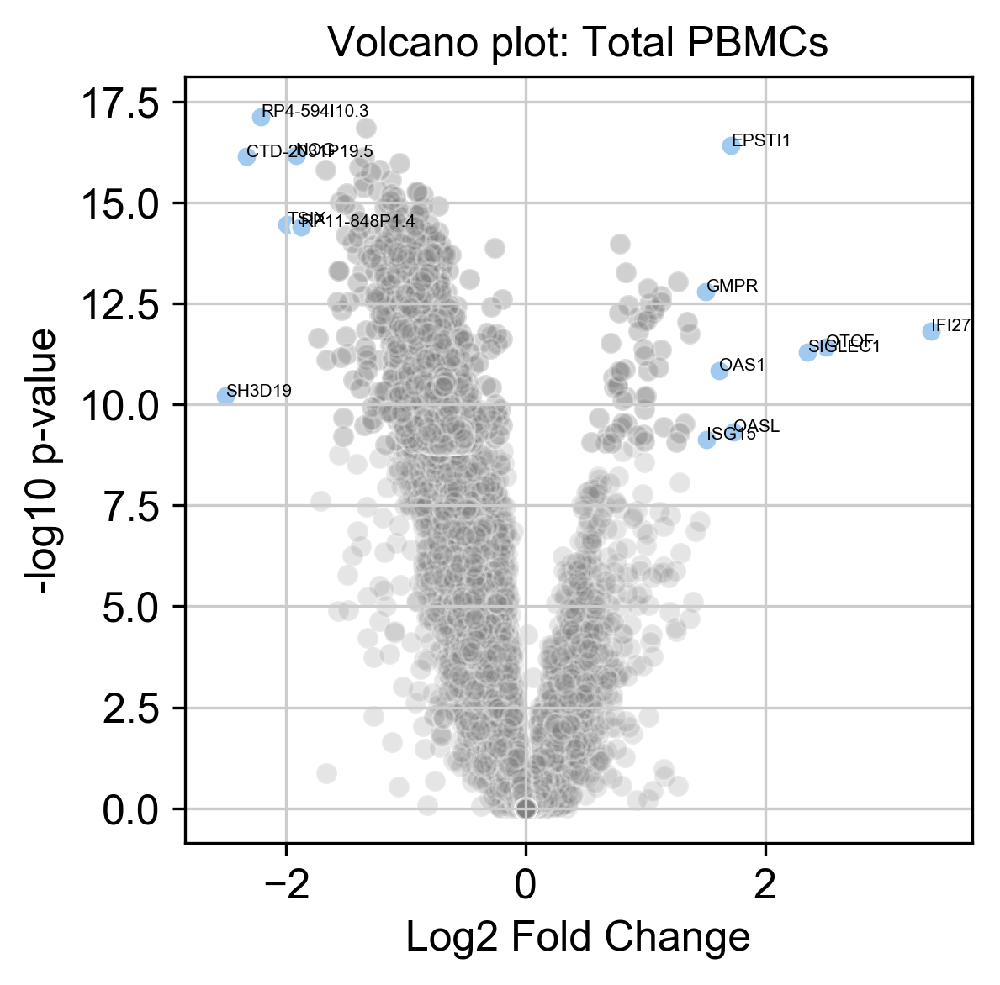

In [42]:
URG_total, DRG_total = make_volcanoplot(logFC_totalPBMC, pval_totalPBMC, title='Total PBMCs')

## Log2 FC for each subpopulation

In [43]:
def run_subpop_log2FC(adata):
    ct_groups = np.unique(adata.obs['ct_cov'].tolist())
    logFC_groups = {}; pval_groups = {};
    for ii in range(len(ct_groups)):
        print('Cell type: {}'.format(ct_groups[ii]))
        fdata = adata[adata.obs['ct_cov']==ct_groups[ii]]
        healthy_people = np.unique(fdata.obs['ind_cov'][fdata.obs['SLE status']=='Healthy'].tolist())
        SLE_people = np.unique(fdata.obs['ind_cov'][fdata.obs['SLE status']=='SLE'].tolist())
        pseudobulk = get_pseudobulk(fdata)
        logFC, pval = compute_LogFC(pseudobulk, SLE_people, healthy_people)
        logFC_groups[ct_groups[ii]] = logFC
        pval_groups[ct_groups[ii]] = pval
        data = pd.DataFrame(list(logFC_groups[ct_groups[ii]].values()), index=list(logFC_groups[ct_groups[ii]].keys()), columns=['Log2FC'])
        data2 = pd.DataFrame(list(pval_groups[ct_groups[ii]].values()), index=list(pval_groups[ct_groups[ii]].keys()), columns=['p-value'])
        data = pd.concat([data, data2], axis=1)
        data = data.transpose()
        data.to_csv('Log2FC-SLEvsHealthy-TRAIN-holdout-{}.csv'.format(ct_groups[ii]))
        
def load_subpop_log2FC(adata):
    ct_groups = np.unique(adata.obs['ct_cov'].tolist())
    logFC_groups = {}; pval_groups = {};
    for ii in range(len(ct_groups)):
        tmp = pd.read_csv('Log2FC-SLEvsHealthy-TRAIN-holdout-{}.csv'.format(ct_groups[ii]), index_col=0)
        logFC_groups[ct_groups[ii]] = tmp.transpose()['Log2FC'].to_dict()
        pval_groups[ct_groups[ii]] = tmp.transpose()['p-value'].to_dict()
    return logFC_groups, pval_groups
    
run_subpop_log2FC(Train)

logFC_groups, pval_groups = load_subpop_log2FC(Train)


Cell type: B Cells
Cell type: Classical Dendritic Cells
Cell type: Classical Monocytes
Cell type: Cytotoxic T Cells
Cell type: Effector Memory T Cells
Cell type: Megakaryocytes
Cell type: Naive T Cells
Cell type: Natural Killer Cells
Cell type: Nonclassical Monocytes
Cell type: Plasmacytoid Dendritic Cells
Cell type: Progenitor Cells
Cell type: Proliferating T Cells
Cell type: T-Reg T Cells


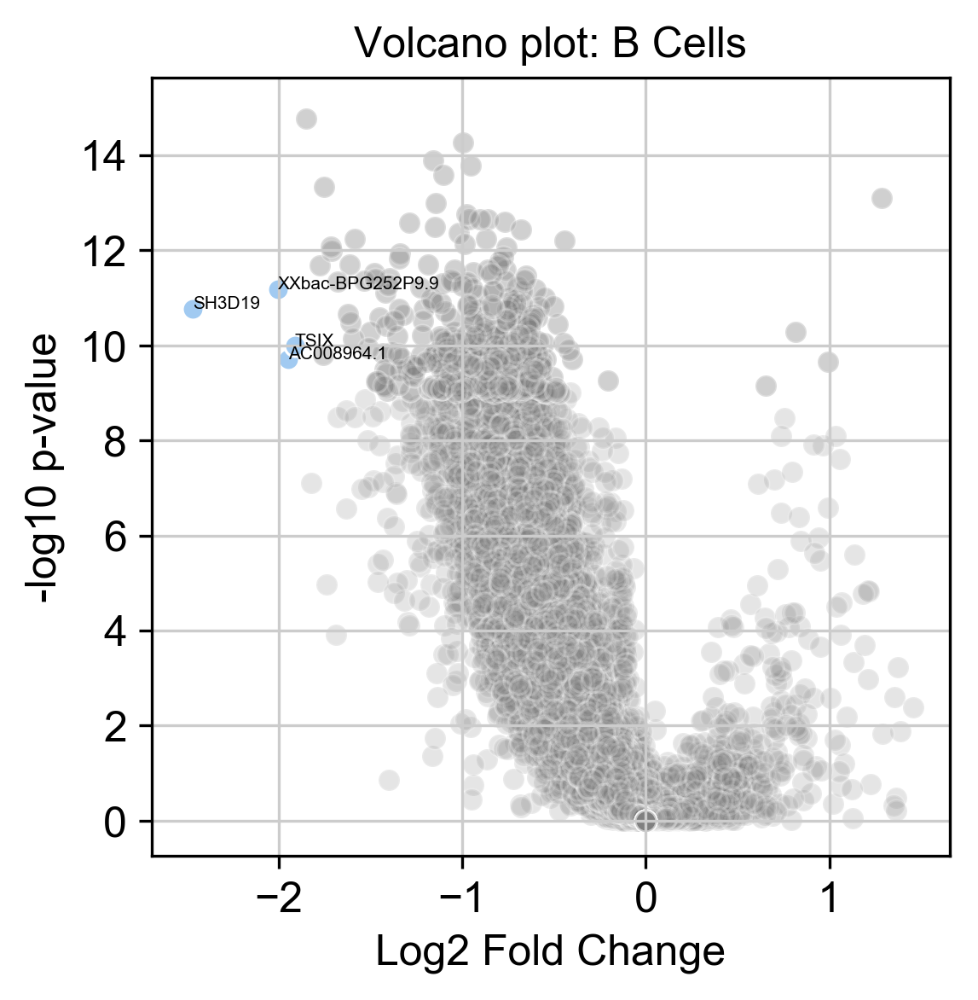

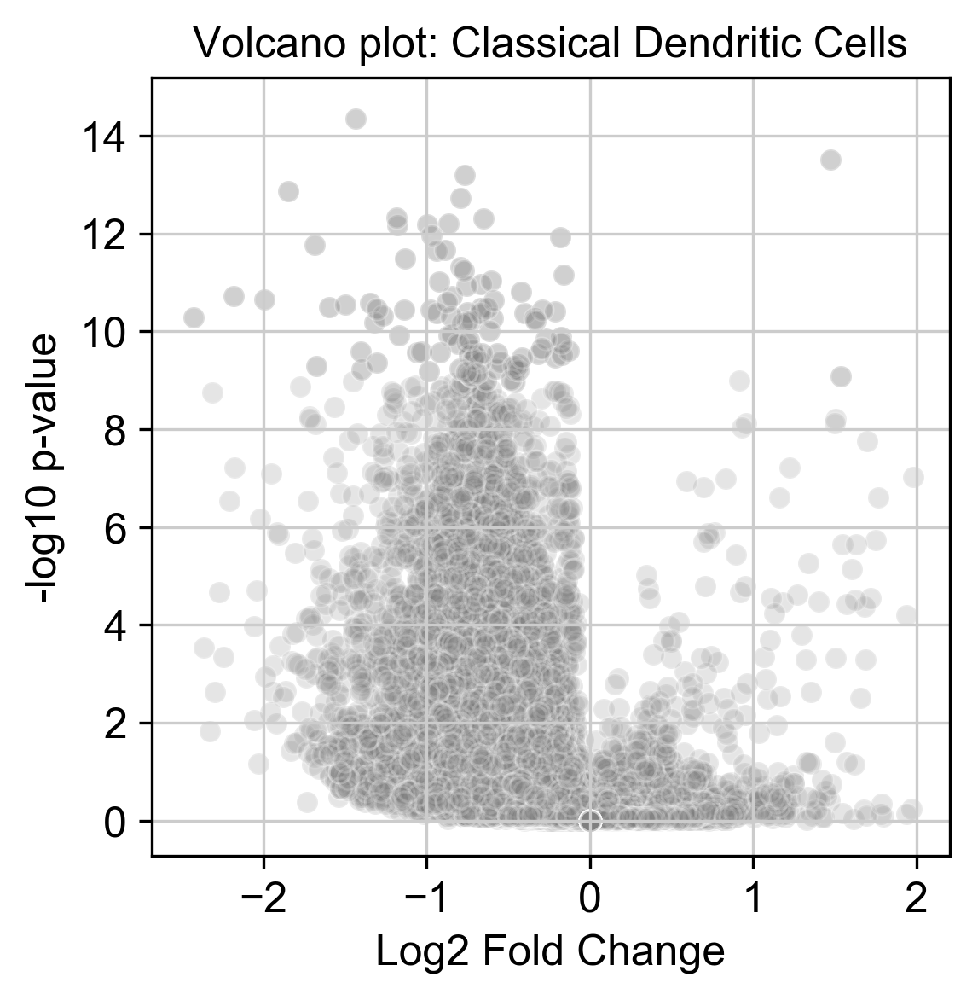

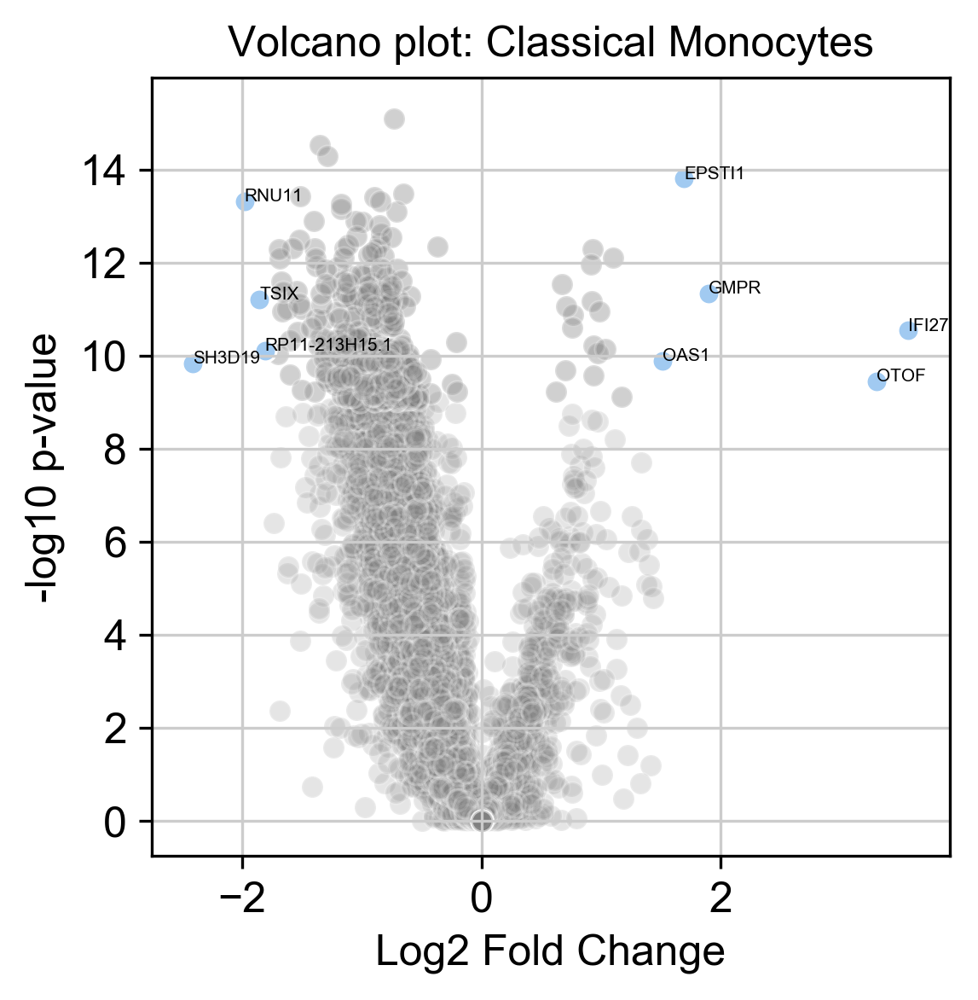

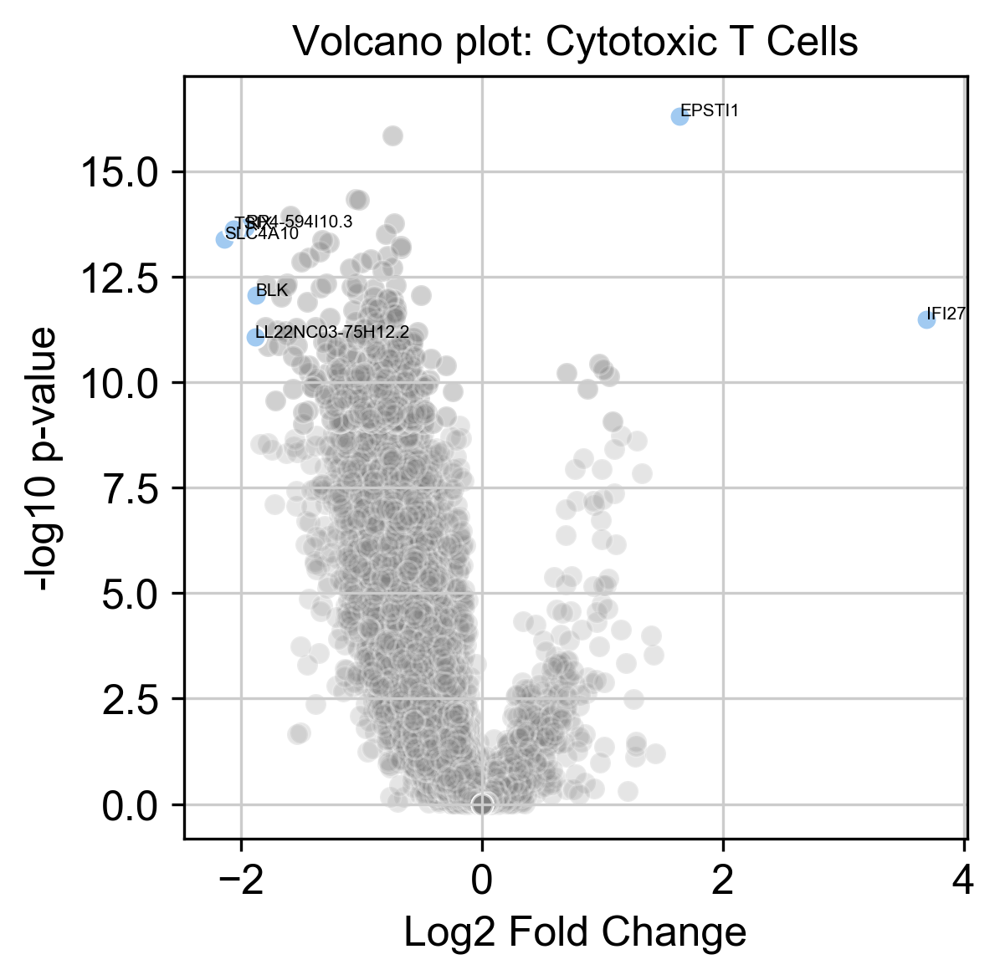

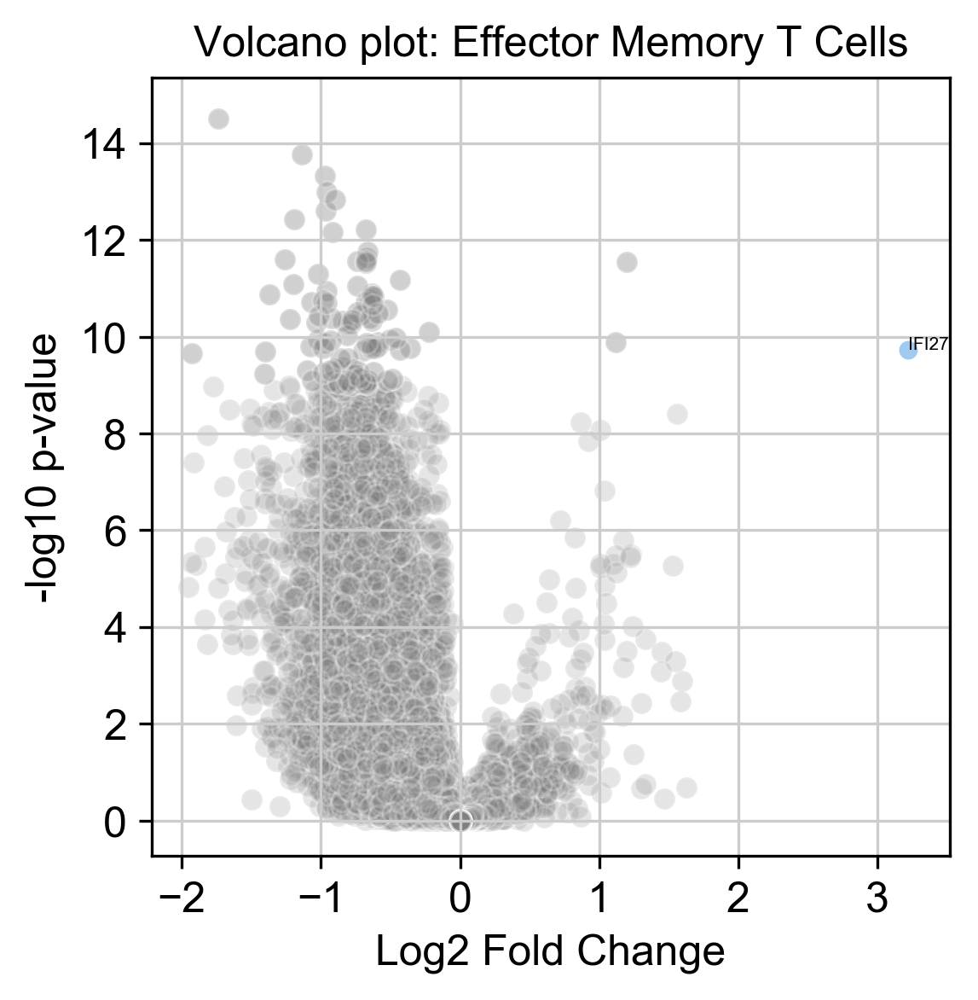

...

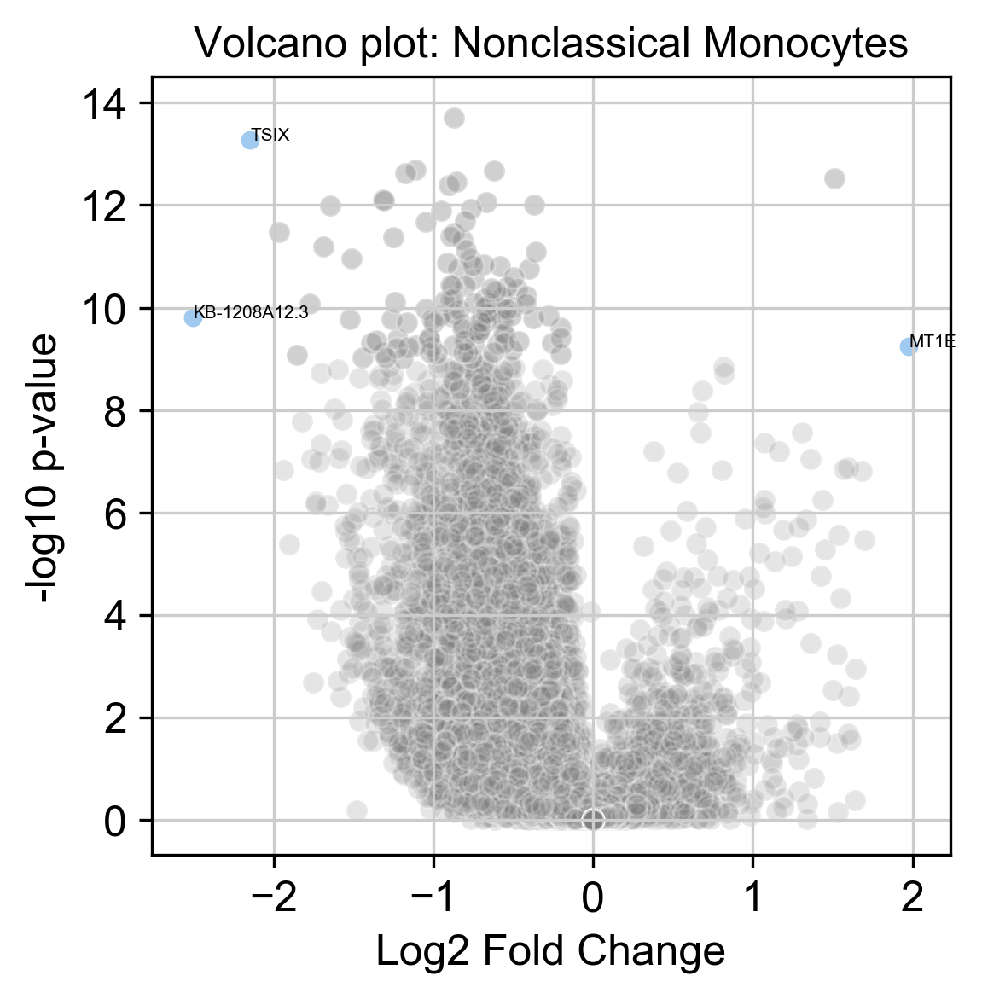

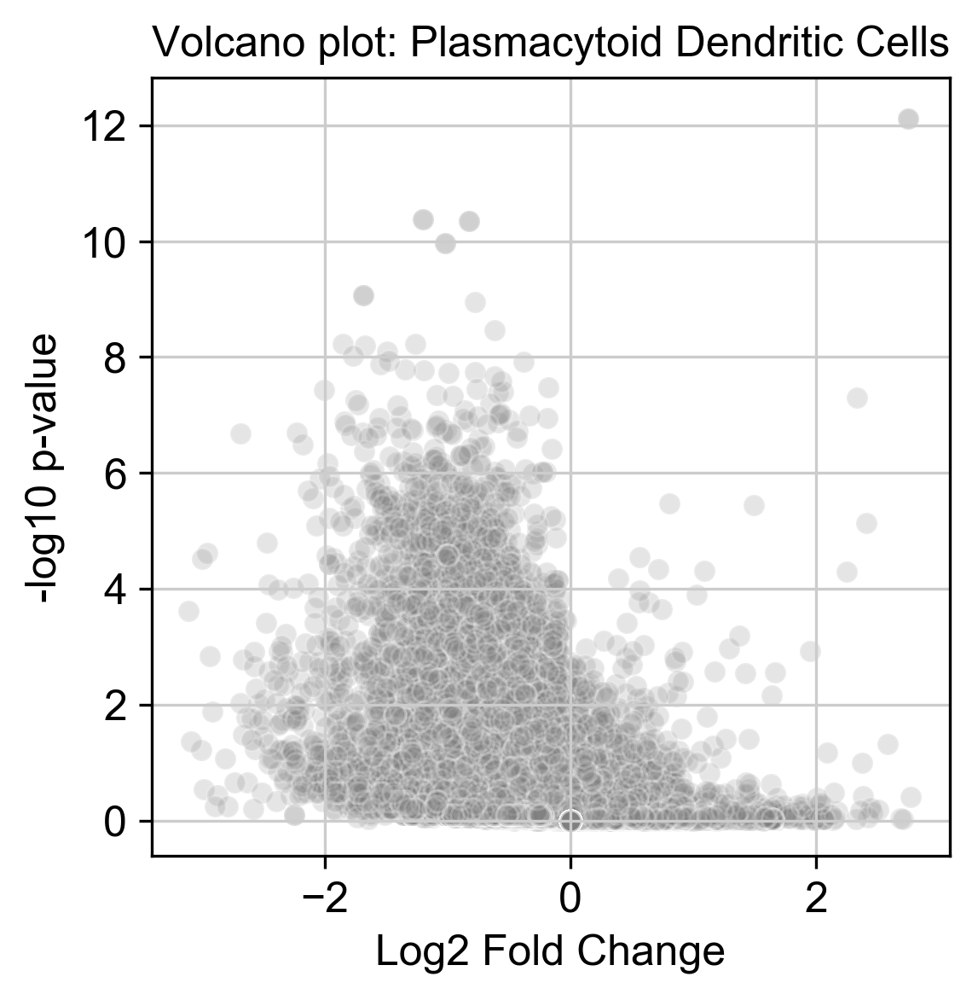

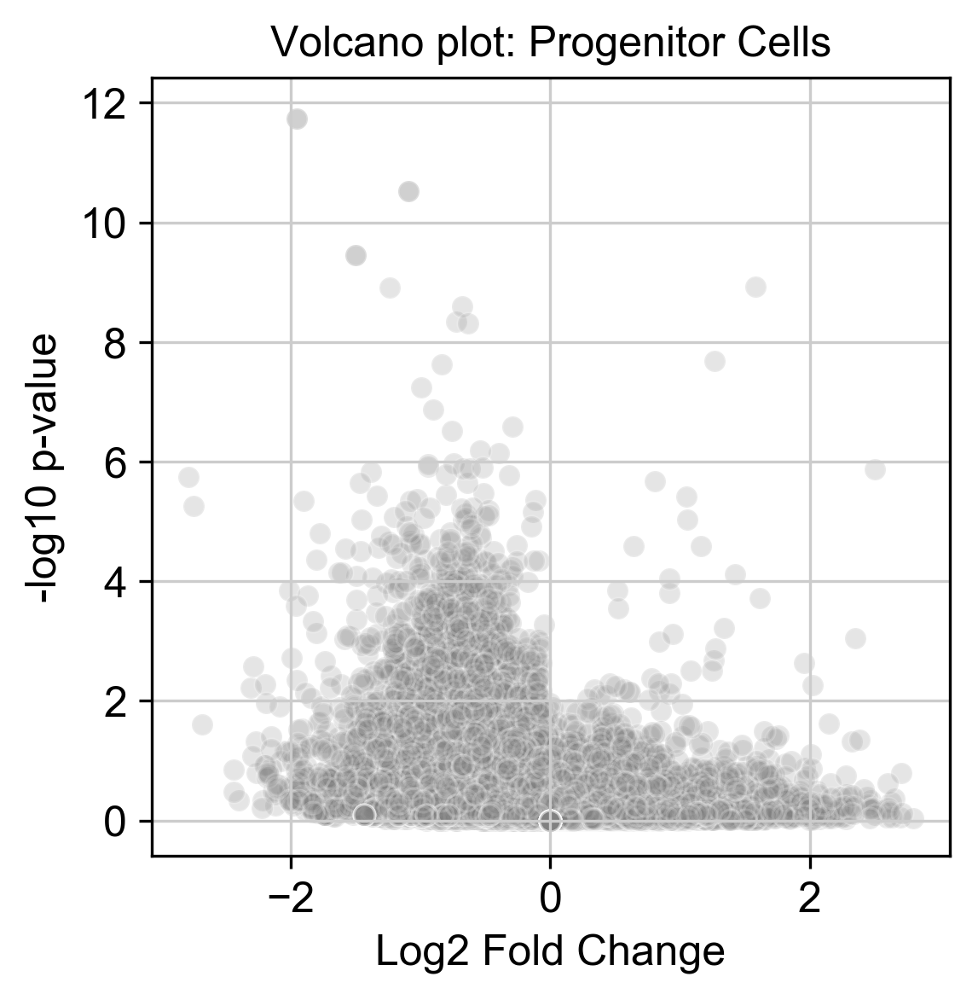

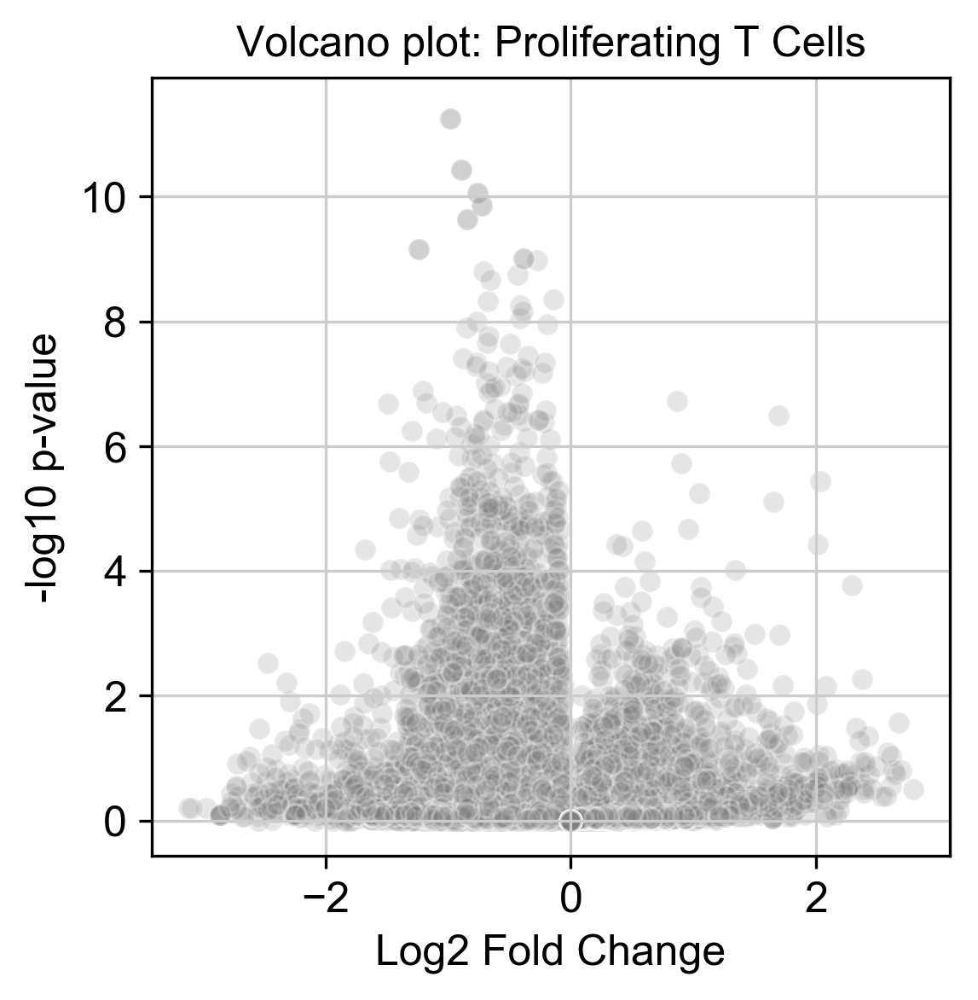

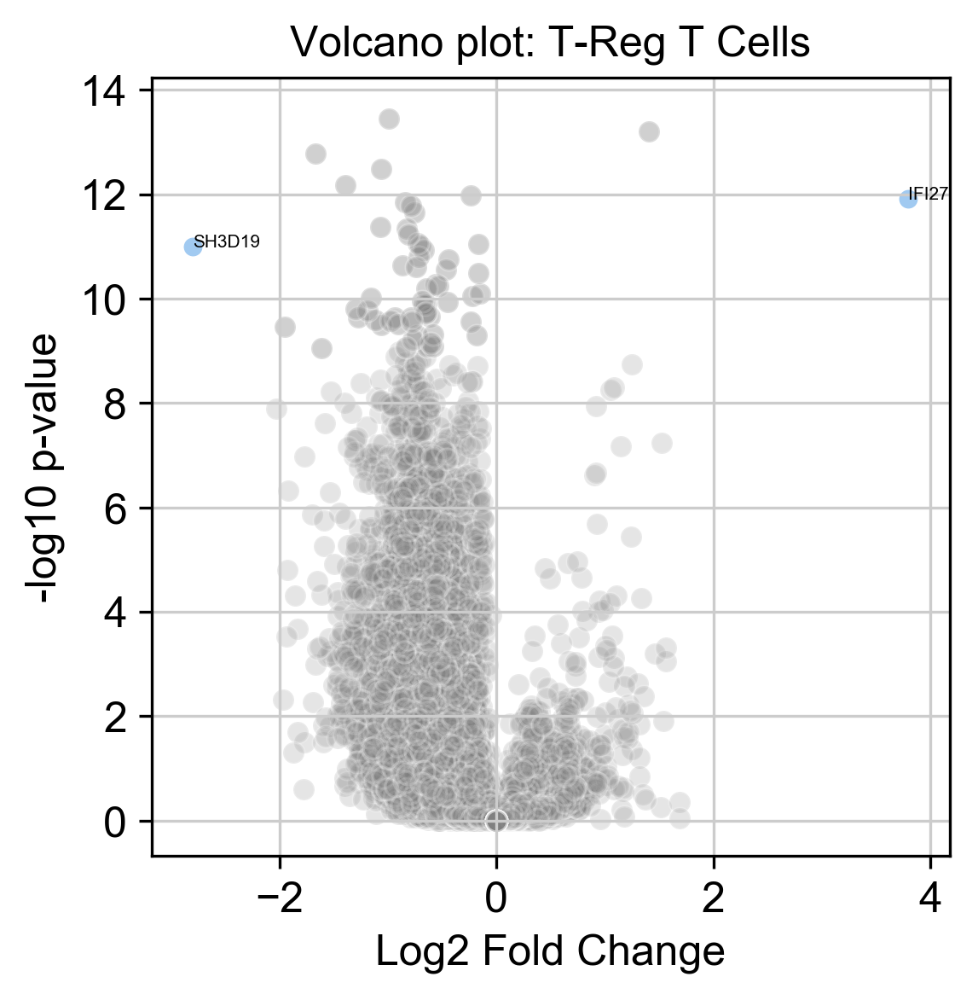

In [44]:
URG = {}; DRG = {}; # Up and Down Regulated Genes for each population
ct_groups = np.unique(adata.obs['ct_cov'].tolist())
for ii in range(len(ct_groups)):
    plt.figure()
    URG[ct_groups[ii]], DRG[ct_groups[ii]] = make_volcanoplot(logFC_groups[ct_groups[ii]], pval_groups[ct_groups[ii]], ct_groups[ii])
    

# Compute Gene-Cell-Type specific expression per individual

In [50]:
pseudobulk = get_pseudobulk(adata)
corr_matrix_holdout = pd.DataFrame(index=list(pseudobulk.columns))
for ii in range(len(URG_total)):
    corr_matrix_holdout['{}-URG-totalPBMC'.format(URG_total[ii])] = pseudobulk.transpose()[URG_total[ii]].values
for ii in range(len(DRG_total)):
    corr_matrix_holdout['{}-DRG-totalPBMC'.format(DRG_total[ii])] = pseudobulk.transpose()[DRG_total[ii]].values
    
ct_groups = np.unique(adata.obs['ct_cov'].tolist())
for ii in range(len(ct_groups)):
    try:
        print('Cell type: {}'.format(ct_groups[ii]))
        fdata = adata[adata.obs['ct_cov']==ct_groups[ii]]
        pseudobulk = get_pseudobulk(fdata)
        for gg in range(len(URG[ct_groups[ii]])):   
            corr_matrix_holdout['{0}-URG-{1}'.format(URG[ct_groups[ii]][gg], ct_groups[ii])] = pseudobulk.transpose()[URG[ct_groups[ii]][gg]].values
        for gg in range(len(DRG[ct_groups[ii]])):   
            corr_matrix_holdout['{0}-DRG-{1}'.format(DRG[ct_groups[ii]][gg], ct_groups[ii])] = pseudobulk.transpose()[DRG[ct_groups[ii]][gg]].values
    except:
        continue
corr_matrix_holdout.to_csv('Expression-Composition-corrmatrix-holdout.csv')


Cell type: B Cells
Cell type: Classical Dendritic Cells
Cell type: Classical Monocytes
Cell type: Cytotoxic T Cells
Cell type: Effector Memory T Cells
Cell type: Megakaryocytes
Cell type: Naive T Cells
Cell type: Natural Killer Cells
Cell type: Nonclassical Monocytes
Cell type: Plasmacytoid Dendritic Cells
Cell type: Progenitor Cells
Cell type: Proliferating T Cells
Cell type: T-Reg T Cells


In [51]:
corr_matrix_holdout = pd.read_csv('Expression-Composition-corrmatrix-holdout.csv', index_col=0)
corr_matrix_all = pd.read_csv('Expression-Composition-corrmatrix.csv', index_col=0)

# Compute composition of each cell type per person

In [52]:
## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov', 'ct_cov','SLE status'])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")


In [53]:
# Add composition changes
people = corr_matrix_holdout.index.tolist()
ct_groups = np.unique(adata.obs['ct_cov'].tolist())
for jj in range(len(ct_groups)):
    tmp = ind_perc[ind_perc['ct_cov']==ct_groups[jj]]
    tmplist = np.empty((len(people),))
    tmplist[:] = np.nan
    for ii in range(len(people)):
        try:
            tmplist[ii] = tmp[tmp['ind_cov']==people[ii]]['ct_perc'].values[0]
        except:
            continue
    corr_matrix_holdout['Proportion-{}'.format(ct_groups[jj])] = tmplist
    
# Remove empty categories    
labels = list(corr_matrix_holdout.columns)
for lbl in labels:
    if np.sum(np.isnan(corr_matrix_holdout[lbl]))==len(corr_matrix_holdout):
        print('Removing category: {} due to lack of data.'.format(lbl))
        corr_matrix_holdout = corr_matrix_holdout.drop(lbl, axis='columns')
        
# Add composition changes
people = corr_matrix_all.index.tolist()
ct_groups = np.unique(adata.obs['ct_cov'].tolist())
for jj in range(len(ct_groups)):
    tmp = ind_perc[ind_perc['ct_cov']==ct_groups[jj]]
    tmplist = np.empty((len(people),))
    tmplist[:] = np.nan
    for ii in range(len(people)):
        try:
            tmplist[ii] = tmp[tmp['ind_cov']==people[ii]]['ct_perc'].values[0]
        except:
            continue
    corr_matrix_all['Proportion-{}'.format(ct_groups[jj])] = tmplist
    
# Remove empty categories    
labels = list(corr_matrix_all.columns)
for lbl in labels:
    if np.sum(np.isnan(corr_matrix_all[lbl]))==len(corr_matrix_all):
        print('Removing category: {} due to lack of data.'.format(lbl))
        corr_matrix_all = corr_matrix_all.drop(lbl, axis='columns')

In [55]:
pd.set_option('display.max_columns', None)
display(corr_matrix_holdout)

,ISG15-URG-totalPBMC,OTOF-URG-totalPBMC,GMPR-URG-totalPBMC,OAS1-URG-totalPBMC,OASL-URG-totalPBMC,EPSTI1-URG-totalPBMC,IFI27-URG-totalPBMC,SIGLEC1-URG-totalPBMC,RP4-594I10.3-DRG-totalPBMC,SH3D19-DRG-totalPBMC,CTD-2031P19.5-DRG-totalPBMC,TSIX-DRG-totalPBMC,RP11-848P1.4-DRG-totalPBMC,NOG-DRG-totalPBMC,OTOF-URG-Classical Monocytes,GMPR-URG-Classical Monocytes,OAS1-URG-Classical Monocytes,EPSTI1-URG-Classical Monocytes,IFI27-URG-Classical Monocytes,RNU11-DRG-Classical Monocytes,SH3D19-DRG-Classical Monocytes,RP11-213H15.1-DRG-Classical Monocytes,TSIX-DRG-Classical Monocytes,EPSTI1-URG-Cytotoxic T Cells,IFI27-URG-Cytotoxic T Cells,RP4-594I10.3-DRG-Cytotoxic T Cells,SLC4A10-DRG-Cytotoxic T Cells,TSIX-DRG-Cytotoxic T Cells,BLK-DRG-Cytotoxic T Cells,LL22NC03-75H12.2-DRG-Cytotoxic T Cells,IFI27-URG-Effector Memory T Cells,EPSTI1-URG-Naive T Cells,IFI27-URG-Naive T Cells,RP4-594I10.3-DRG-Naive T Cells,SH3D19-DRG-Naive T Cells,CTD-2031P19.5-DRG-Naive T Cells,XXbac-BPG252P9.9-DRG-Naive T Cells,TSIX-DRG-Naive T Cells,RP11-848P1.4-DRG-Naive T Cells,EPSTI1-URG-Natural Killer Cells,GOLGA8M-DRG-Natural Killer Cells,MT1E-URG-Nonclassical Monocytes,TSIX-DRG-Nonclassical Monocytes,KB-1208A12.3-DRG-Nonclassical Monocytes,IFI27-URG-T-Reg T Cells,SH3D19-DRG-T-Reg T Cells,Proportion-B Cells,Proportion-Classical Dendritic Cells,Proportion-Classical Monocytes,Proportion-Cytotoxic T Cells,Proportion-Effector Memory T Cells,Proportion-Megakaryocytes,Proportion-Naive T Cells,Proportion-Natural Killer Cells,Proportion-Nonclassical Monocytes,Proportion-Plasmacytoid Dendritic Cells,Proportion-Progenitor Cells,Proportion-Proliferating T Cells,Proportion-T-Reg T Cells
1004_1004,0.500723,0.001022,0.005086,0.048274,0.021698,0.135644,0.056550,0.013690,0.019292,0.008942,0.002555,0.004854,0.000511,0.002555,0.003306,0.009918,0.083023,0.231276,0.058380,0.000000,0.004408,0.003306,0.003306,0.090435,0.078229,0.002107,0.004214,0.002107,0.004214,0.002107,0.081790,0.062255,0.020944,0.037689,0.008032,0.005622,0.004486,0.008032,0.000803,0.106921,0.000000,0.025672,0.000000,0.008557,0.044944,0.000000,1.879838,1.326944,23.184666,12.126797,12.532252,0.110579,31.809805,4.201990,2.985625,0.258017,0.847770,4.091412,4.644305
1014_1014,0.764628,0.005201,0.017466,0.113995,0.047646,0.214343,0.168526,0.043703,0.011710,0.009428,0.001347,0.006061,0.000224,0.001571,0.008569,0.032400,0.130526,0.333137,0.101986,0.002043,0.010894,0.001362,0.003404,0.090541,0.170946,0.002454,0.011609,0.006747,0.009399,0.001227,0.304696,0.111666,0.095305,0.060592,0.008479,0.006359,0.000000,0.010599,0.000000,0.043322,0.000000,0.046448,0.010719,0.003573,0.209288,0.000000,2.914508,1.683938,32.966321,36.593264,4.145078,0.161917,10.589378,0.518135,6.282383,0.323834,0.809585,0.744819,2.266839
1019_1019,0.216272,0.000379,0.002764,0.028030,0.008069,0.085657,0.014022,0.005685,0.017955,0.009853,0.000947,0.004548,0.000189,0.004659,0.002091,0.002091,0.052017,0.121276,0.021955,0.002091,0.004182,0.001045,0.003136,0.076499,0.003165,0.009495,0.075186,0.003165,0.009495,0.015825,0.021262,0.060869,0.010037,0.033164,0.009447,0.002362,0.002362,0.005314,0.000000,0.073540,0.006665,0.035852,0.000000,0.000000,0.017888,0.017888,11.071624,1.394204,18.124658,5.986878,8.911974,0.136687,32.094040,14.215418,3.171132,0.082012,0.410060,0.164024,4.237288
1045_1045,1.381404,0.025368,0.026975,0.172132,0.085233,0.344029,0.500236,0.060320,0.009159,0.006630,0.001406,0.004420,0.000201,0.000402,0.044174,0.052712,0.205616,0.495969,0.561388,0.002710,0.004336,0.001084,0.002168,0.188902,0.566103,0.007640,0.005268,0.005556,0.004167,0.001389,0.814501,0.224583,0.444217,0.027163,0.005924,0.000000,0.000000,0.000000,0.000000,0.202446,0.002841,0.060463,0.005332,0.005332,0.746606,0.010046,11.188406,0.637681,37.072464,28.927536,4.144928,NaN,3.391304,7.072464,3.768116,0.260870,0.376812,1.159420,2.000000
1051_1051,0.625348,0.003034,0.008851,0.066079,0.029058,0.186056,0.122089,0.026452,0.018050,0.009802,0.000934,0.003267,0.000467,0.001537,0.002430,0.012505,0.097314,0.

# Clinical covariate analysis

In [56]:
clincal = pd.read_csv('lupus.sledai.txt', sep='\t')
# Add study disease status
disease_status = {}
for ii in range(len(clincal['genotypeid'])):
    try:
        disease_status[clincal['genotypeid'][ii]] = 1 #np.unique(adata.obs['SLE status'][adata.obs['ind_cov']==clincal['genotypeid'][ii]])[0]
    except:
        disease_status[clincal['genotypeid'][ii]] = 1 #'SLE' # This person by definition of being in sheet has SLE
        #print('Individual: {} not in study data'.format(clincal['genotypeid'][ii]))

clincal['Disease_status'] = disease_status.values()
display(clincal)

,genotypeid,X,subjectid,slesxdx,sleflare,flareseverity,sleactivity,kidney,SLAQ score,SLIC score,sledaiseizures,sledaipsychosis,sledaiobrainsyn,sledaivisdisturb,sledaicranialnd,sledaisleheadache,sledaicva,sledaivasculitis,sledaiarthritis,sledaimyositis,sledairash,sledaialopecia,sledaimucosalulcers,sledaipleurisy,sledaipericarditis,sledaifever,sledaiurinarycasts,sledaihematuria,sledaiproteinuria,sledaipyuria,sledailowcomp,sledaiantidsdna,sledaithrombocytopenia,sledaileukopenia,sledaiscore,sledainone,acrconfirmall,acrmalar,acrdiscoid,acrphotosensitiv,acrmuculcers,acrarthritisc,acrserositisc,acrimmunologicc,acrantidsdna,acrantismith,acrapla,acrfpsyphilis,acrrenalc,acrlupneph,acresrddialy,acrneurologc,acrseizure,acrpsychosis,acrhematolgicc,acrhemoanemia,acrleukopenia,acrlymphopenia,acrthrombocyto,acranac,acrcsum,acrmiss,Disease_status
0,904405200_904405200,64,1119,3,0.0,NaN,2,0.0,7.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,5,0,1
1,902692200_902692200,53,1101,2,0.0,NaN,1,1.0,8.545455,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,4,0,1,0,0,0,1,0,0,1,1,1,0,0,1,1,1,0,0,0,1,0,0,1,1,1,5,0,1
2,904236200_904236200,82,1193,2,0.0,NaN,0,1.0,2.000000,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,1,1,0,0,0,1,1,0,0,0,0,1,0,0,1,0,1,6,0,1
3,904194200_904194200,70,1130,2,0.0,NaN,0,0.0,2.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,4,0,1,0,0,0,1,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,5,0,1
4,904344200_904344200,244,1588,4,0.0,NaN,8,0.0,10.000000,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,1,1,1,1,1,0,1,1,1,0,0,0,1,0,1,1,0,1,7,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,1958_1958,343,1958,4,0.0,NaN,2,0.0,6.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,1,1,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,6,0,1
116,1961_1961,344,1961,3,1.0,2.0,7,1.0,15.000000,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,1,1,0,0,16,0,1,1,0,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,1,0,1,0,0,1,8,0,1
117,1221_1221,93,1221,2,1.0,2.0,6,0.0,12.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,5,0,1
118,1251_1251,108,1251,3,0.0,NaN,0,1.0,3.000000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,6,0,1


In [57]:
def build_covar(corr_matrix_mod, keys):
    clincal = pd.read_csv('lupus.sledai.txt', sep='\t')
    inds = list(corr_matrix_mod.transpose().columns)
    # Add study disease status
    disease_status = {}
    for ii in range(len(clincal['genotypeid'])):
        try:
            disease_status[clincal['genotypeid'][ii]] = 1 #np.unique(adata.obs['SLE status'][adata.obs['ind_cov']==clincal['genotypeid'][ii]])[0]
        except:
            disease_status[clincal['genotypeid'][ii]] = 1 #'SLE' # This person by definition of being in sheet has SLE
            #print('Individual: {} not in study data'.format(clincal['genotypeid'][ii]))

    clincal['Disease_status'] = disease_status.values()
    for key in keys:
        covar = {}
        for ii in range(len(inds)):
            if np.sum(clincal['genotypeid'].isin([inds[ii]]).values):
                covar[inds[ii]] = clincal[clincal['genotypeid'].isin([inds[ii]]).values][key].values[0]
            else:
                covar[inds[ii]] = 0
        corr_matrix_mod[key] = list(covar.values())
    return corr_matrix_mod

# Logistic regression on clinical variables

In [81]:
Test_people = np.unique(Test.obs['ind_cov'].tolist())

In [117]:
def logistic_regression(corr_matrix, Test_people, clincal_var, n_boot):
    # Remove people with no clinical variables
    corr_matrix = corr_matrix[~corr_matrix.transpose().columns.isin(['FLARE002', 'FLARE004', 'FLARE005', 'FLARE006', 
                                                                         'FLARE007', 'FLARE009', 'FLARE011', 'FLARE013', 
                                                                         'FLARE014', 'FLARE015', 'FLARE016', 'FLARE017', 
                                                                         'FLARE018', 'FLARE019', 'FLARE020'])]
    
    X_test = corr_matrix[corr_matrix.transpose().columns.isin(Test_people)]
    X_train = corr_matrix[~corr_matrix.transpose().columns.isin(Test_people)]
    
    def setup_data(corr_matrix, clincal_var):
        # Add clinical outcome
        corr_matrix = build_covar(corr_matrix, keys = [clincal_var])
        # Drop NaN from dataframe
        corr_matrix = corr_matrix.dropna()
        # Dependent variable
        Y = corr_matrix[clincal_var].values.ravel()
        # Remove dependent variable from variables
        corr_matrix = corr_matrix.drop(clincal_var, axis=1)
        return corr_matrix, Y
    
    X_train, y_train = setup_data(X_train, clincal_var)
    X_test, y_test = setup_data(X_test, clincal_var)
    
    # Variables of interest
    VOIs = {}; ROC_AUC = {}; FPR = {}; TPR = {}
    for ii in range(n_boot):

        # Over sample cases and undersample controls to improve classification
        os = SMOTE(random_state=0)
        os_data_X, os_data_y = os.fit_sample(X_train, y_train)

        # Setup logistic regression
        logreg = LogisticRegression(max_iter=1000, random_state=0)
        # Find optimal parameters
        rfe = RFE(logreg, 3)
        rfe = rfe.fit(os_data_X, os_data_y)
        ind_var = np.asarray(list(X_train.columns))
        
        # Preserve optimate features only from train and test set
        os_data_X = os_data_X.transpose()[X_train.columns.isin(ind_var[rfe.ranking_==1])].transpose()
        X_test = X_test.transpose()[X_test.columns.isin(ind_var[rfe.ranking_==1])].transpose()

        # Fit Logistic regression
        logreg = LogisticRegression(max_iter=1000, random_state=0)
        logreg.fit(os_data_X, os_data_y)
        VOIs[ii] = list(ind_var[rfe.ranking_==1])
        # Perform prediction
        y_pred = logreg.predict(X_test)

        # ROC curve
        logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
        ROC_AUC[ii] = logit_roc_auc 
        # Collect True and False Positive rates
        fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
        FPR[ii] = fpr
        TPR[ii] = tpr
    return VOIs, ROC_AUC, FPR, TPR

In [151]:
def plot_ROC(ROC_AUC, FPR, TPR):
    sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=12)
    plt.figure()
    for ii in range(len(ROC_AUC)):
        plt.plot(np.asarray(list(FPR.values()))[ii], np.asarray(list(TPR.values()))[ii], 'k-', alpha=1, linewidth=2)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC AUC average: {0}, median:{1}'.format(round(np.mean(list(ROC_AUC.values())),3), round(np.median(list(ROC_AUC.values())),3)))
    plt.show()
    
def show_VOI(VOIs):
    sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=12)
    from palettable.colorbrewer.qualitative import Pastel1_7
    unique_VOIs = np.unique(np.ravel(list(VOIs.values())))
    VOI_count = {}
    for ii in range(len(unique_VOIs)):
        VOI_count[unique_VOIs[ii]] = np.sum(np.ravel(list(VOIs.values())) == unique_VOIs[ii])
    def my_autopct(pct):
        return ('%1.1f%%' % pct) if pct > 5 else ''
    labels = np.asarray(list(VOI_count.keys()))
    labels[list(VOI_count.values()) < (np.sum(list(VOI_count.values()))*0.05)] = ''
    my_circle=plt.Circle( (0,0), 0.7, color='white')
    plt.pie(list(VOI_count.values()), labels=labels, colors=Pastel1_7.hex_colors, textprops={'fontsize': 7}, autopct=my_autopct)
    p=plt.gcf()
    p.gca().add_artist(my_circle)
    plt.show()
    
    

In [224]:
# Preallocate dictionary
ROC_compare = {}

# Kidney involvment


In [225]:
#%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='kidney', n_boot=1)
ROC_compare['kidney_holdout'] = ROC_AUC[0]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


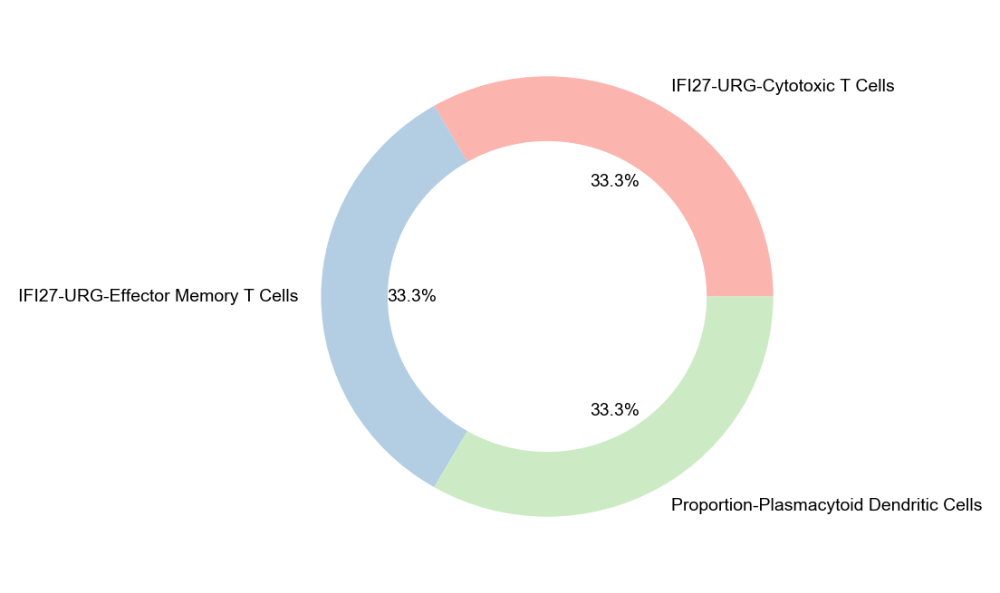

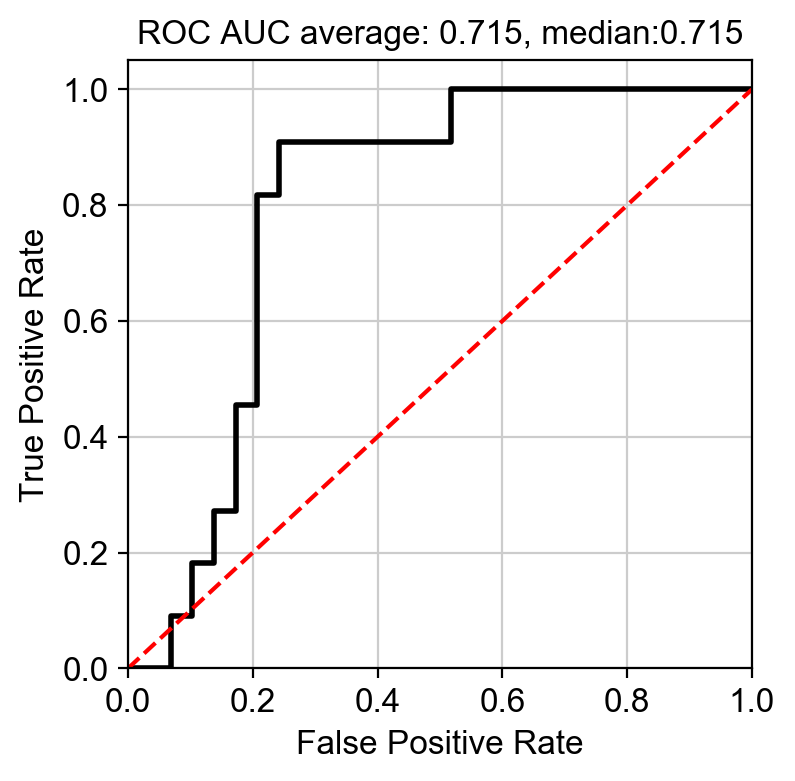

In [226]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [227]:
#%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='kidney', n_boot=1)
ROC_compare['kidney_all'] = ROC_AUC[0]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


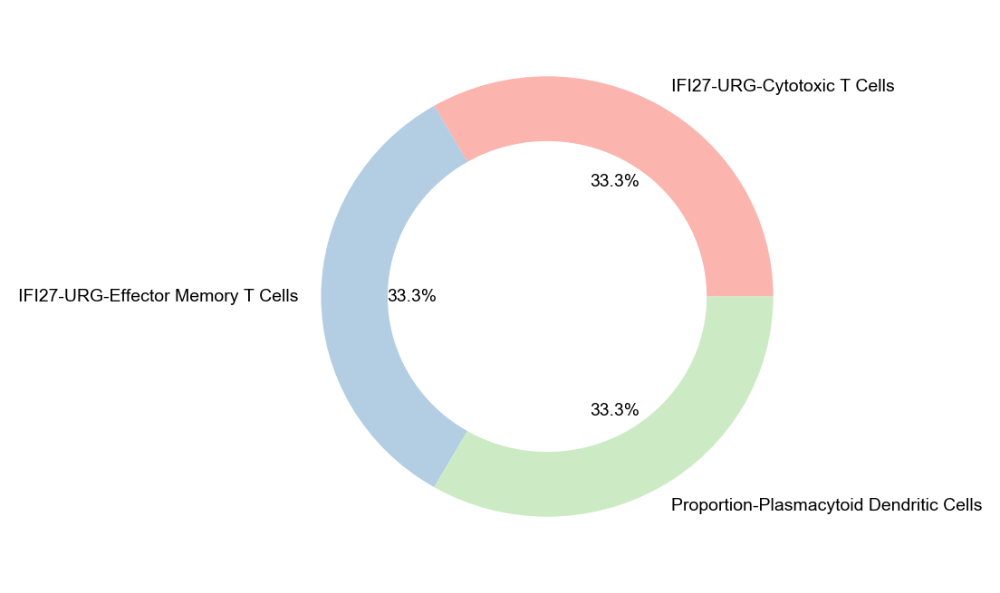

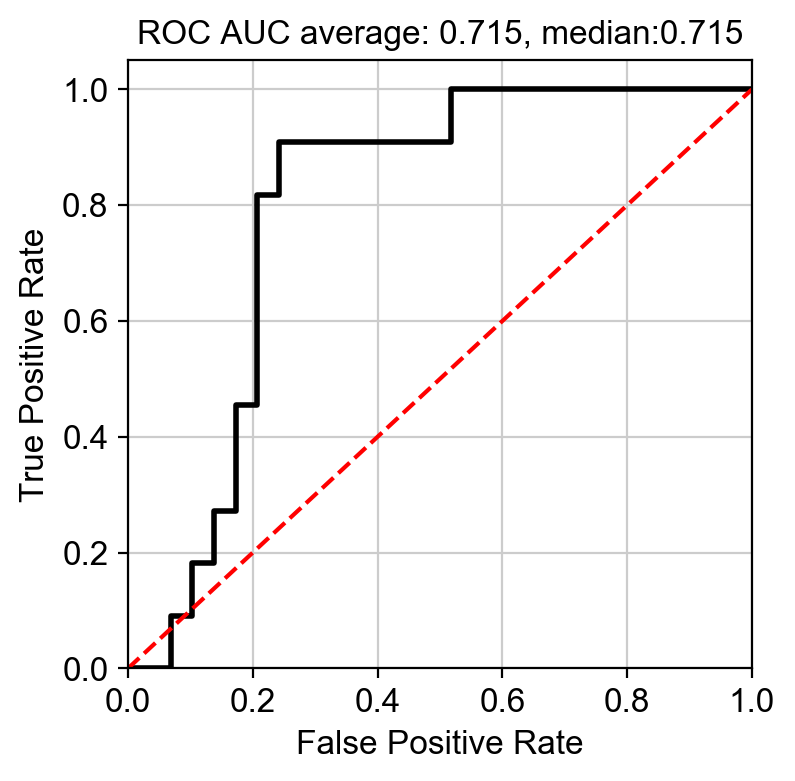

In [228]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Malar rash

In [229]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrmalar', n_boot=1)
ROC_compare['malar_holdout'] = ROC_AUC[0]

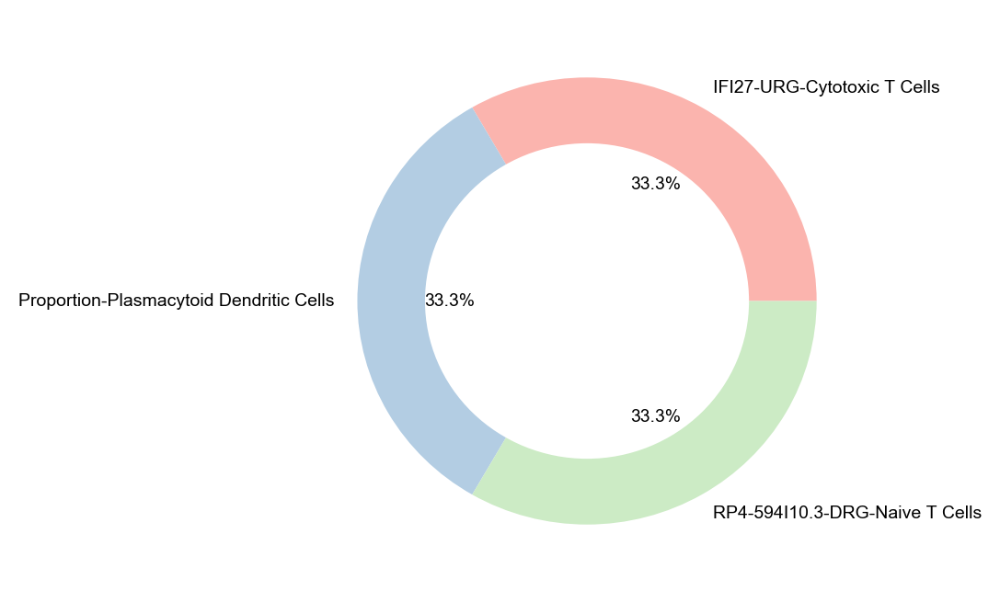

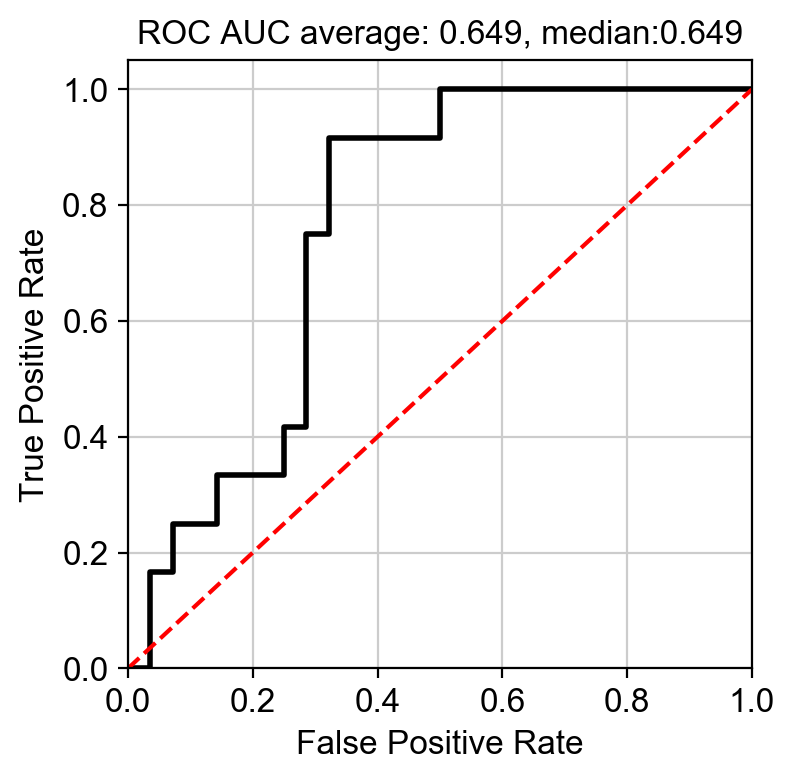

In [230]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [231]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrmalar', n_boot=1)
ROC_compare['malar_all'] = ROC_AUC[0]

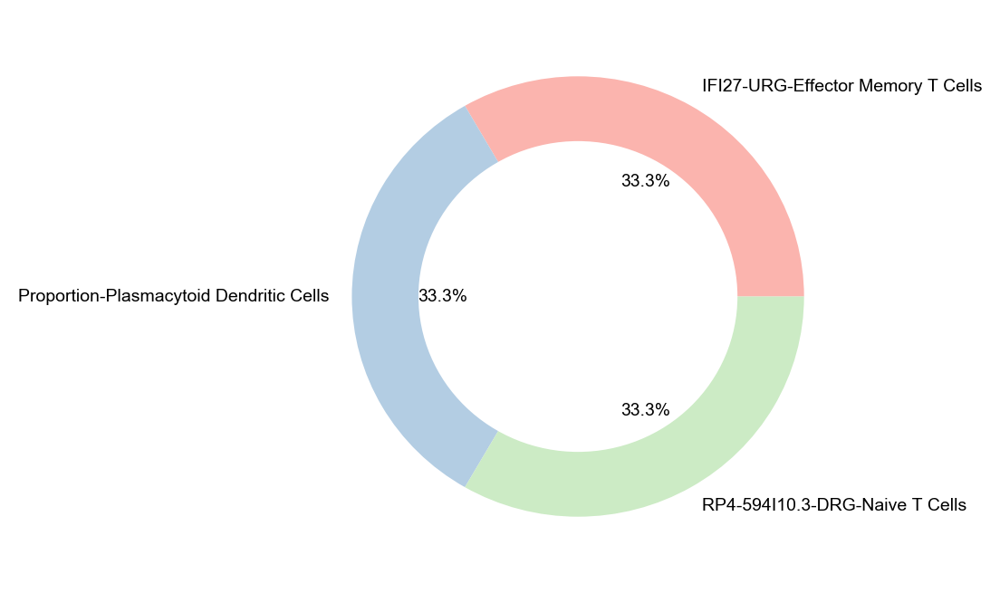

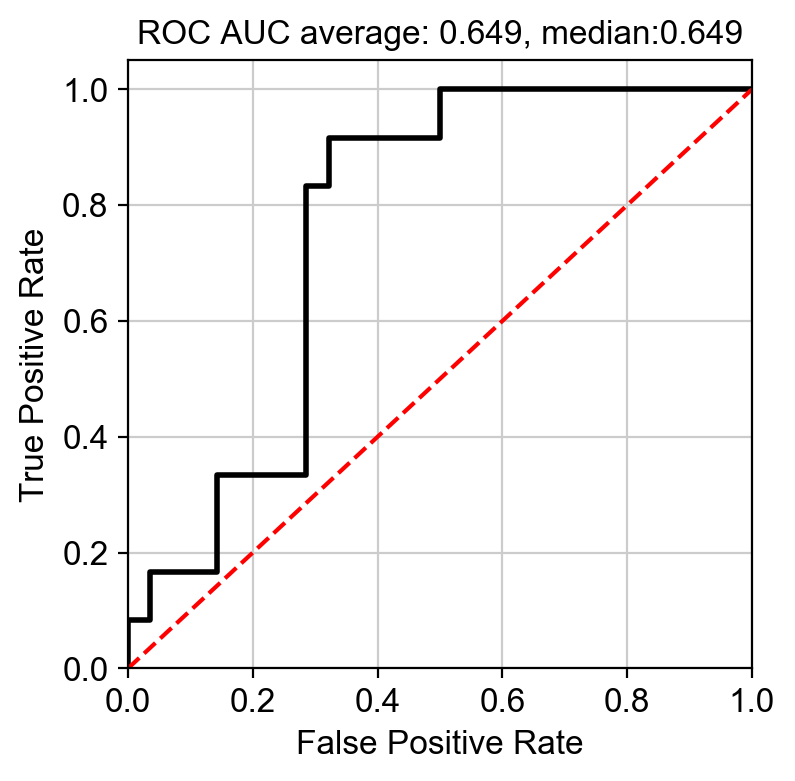

In [232]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Discoid rash

In [233]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrdiscoid', n_boot=1)
ROC_compare['discoid_holdout'] = ROC_AUC[0]

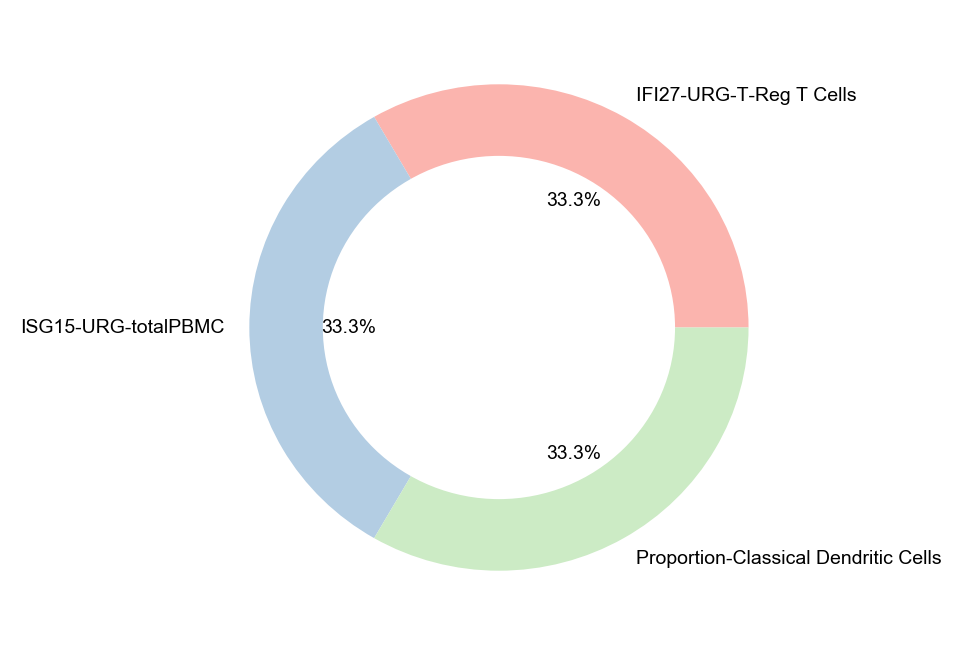

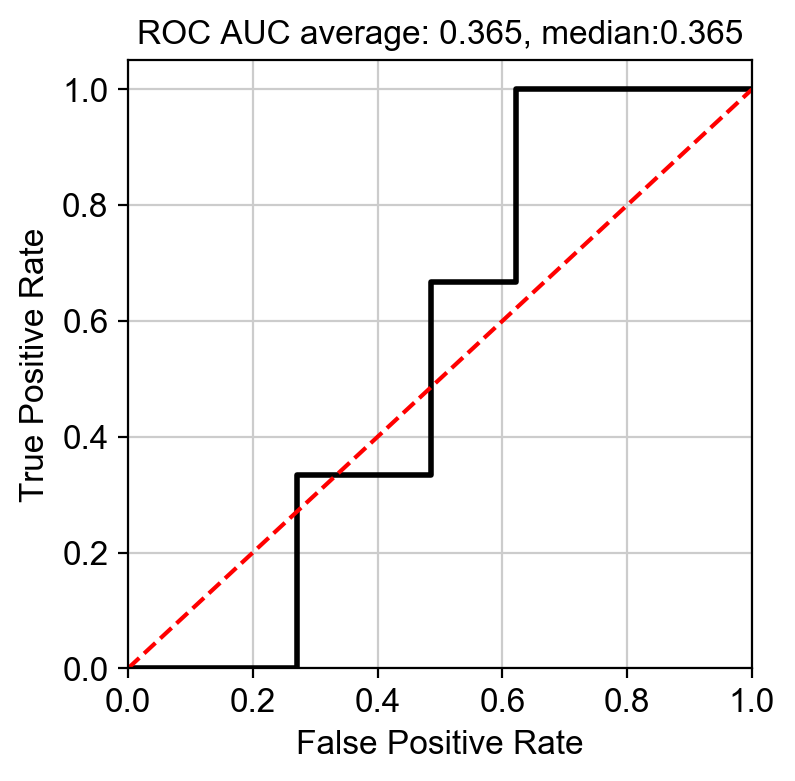

In [234]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [235]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrdiscoid', n_boot=1)
ROC_compare['discoid_all'] = ROC_AUC[0]

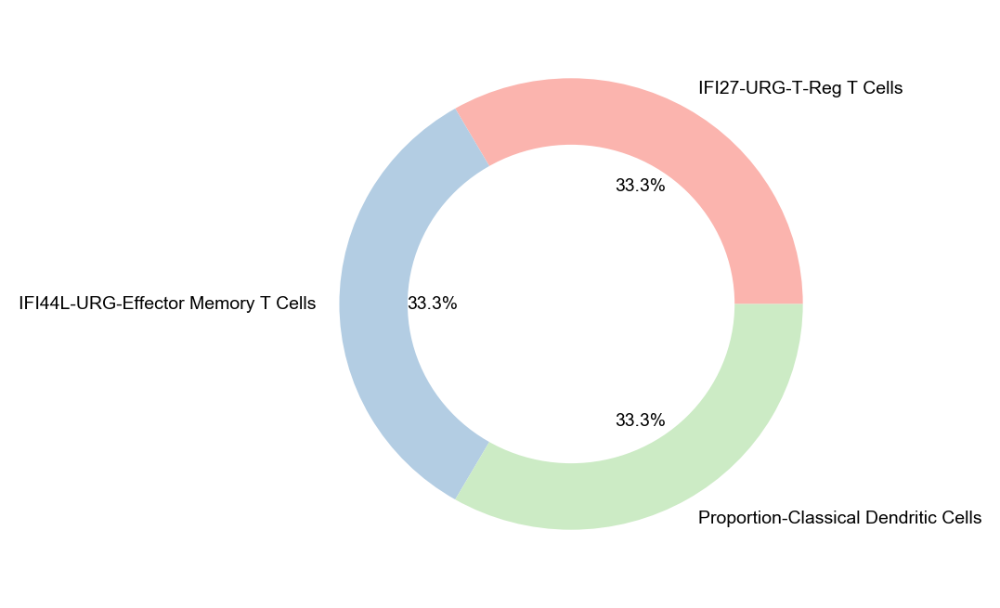

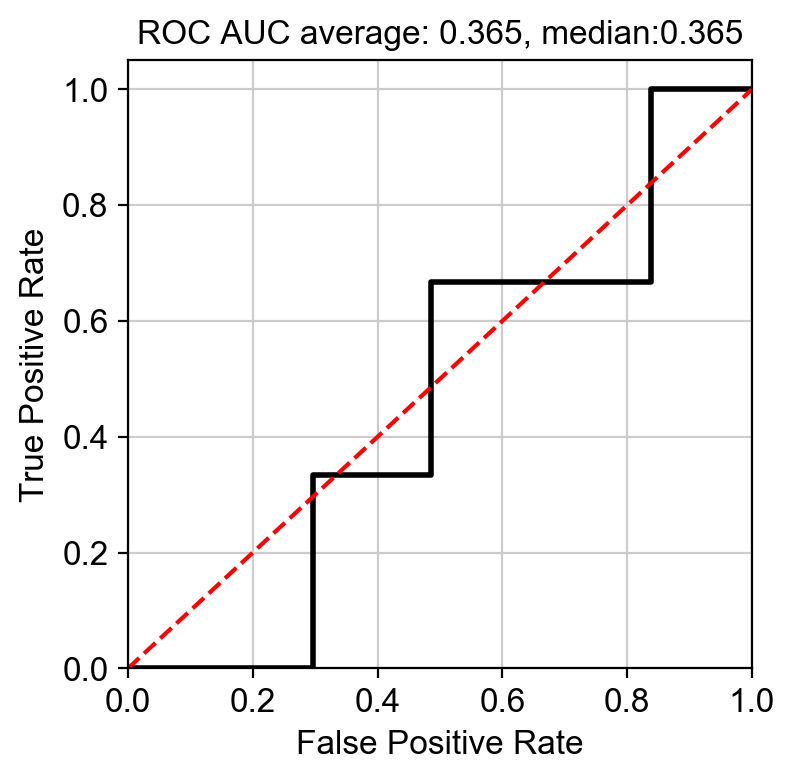

In [236]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Photosensitivity

In [237]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrphotosensitiv', n_boot=1)
ROC_compare['photosensitivity_holdout'] = ROC_AUC[0]


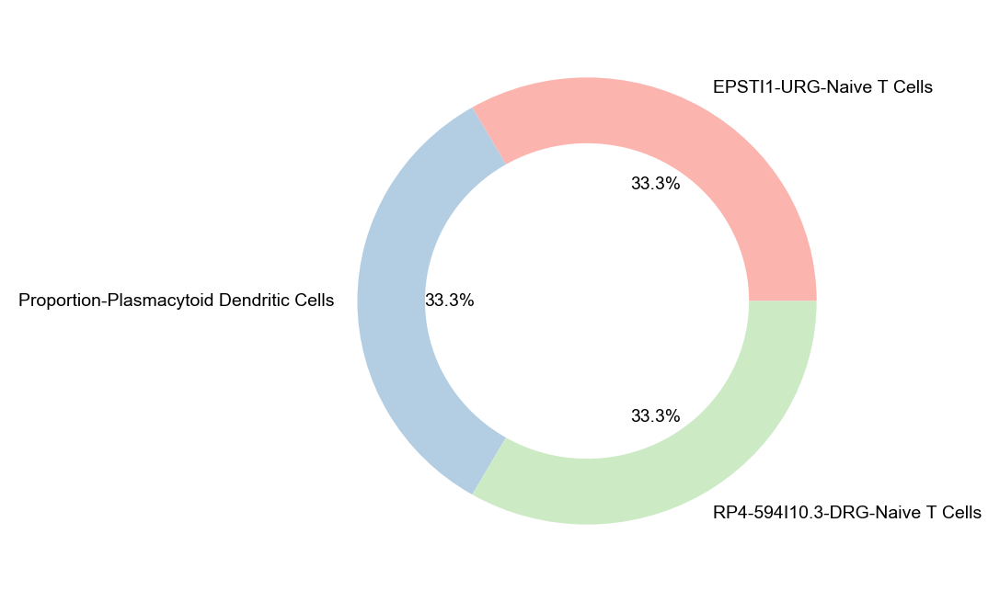

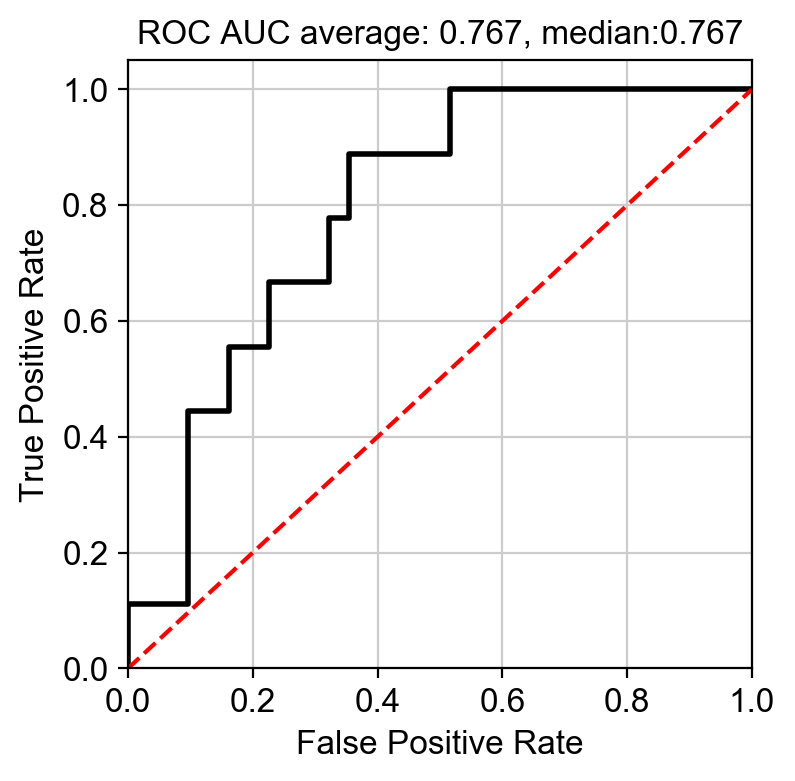

In [238]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [239]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrphotosensitiv', n_boot=1)
ROC_compare['photosensitivity_all'] = ROC_AUC[0]


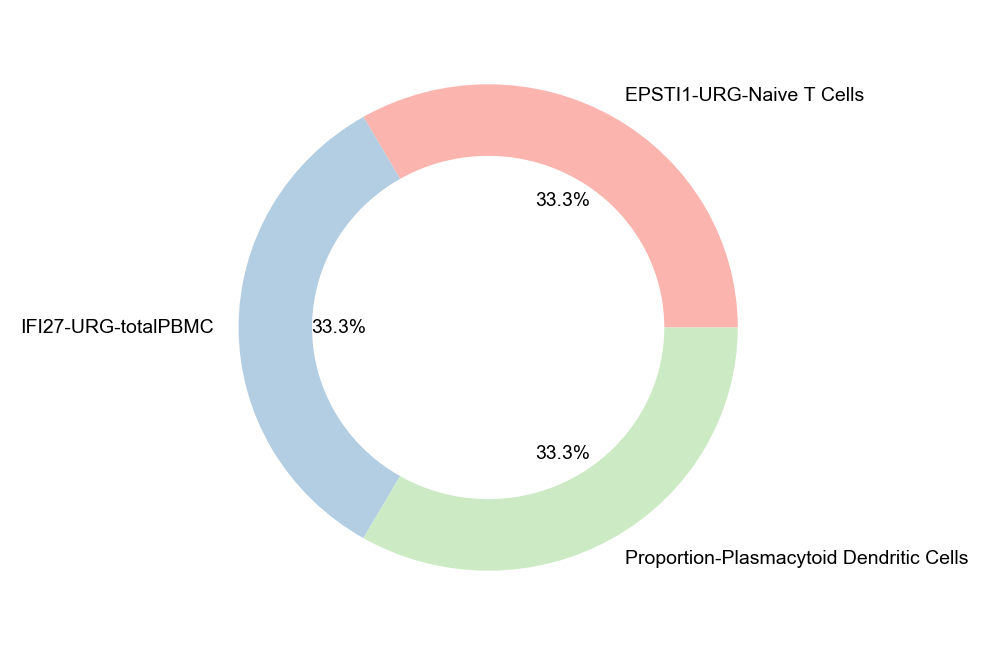

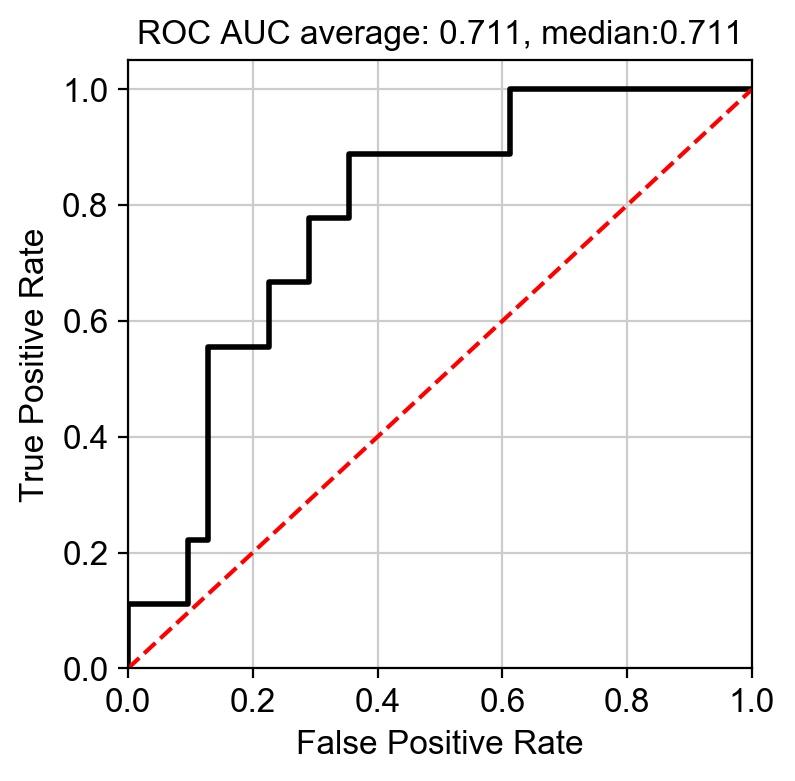

In [240]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Mucosal ulcers

In [241]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrmuculcers', n_boot=1)
ROC_compare['mucosalulcers_holdout'] = ROC_AUC[0]

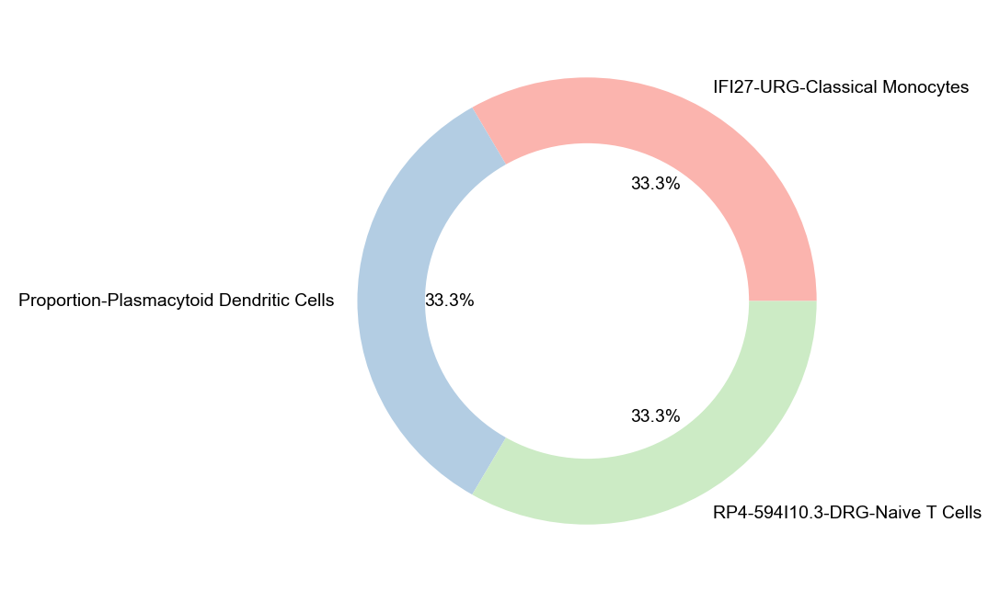

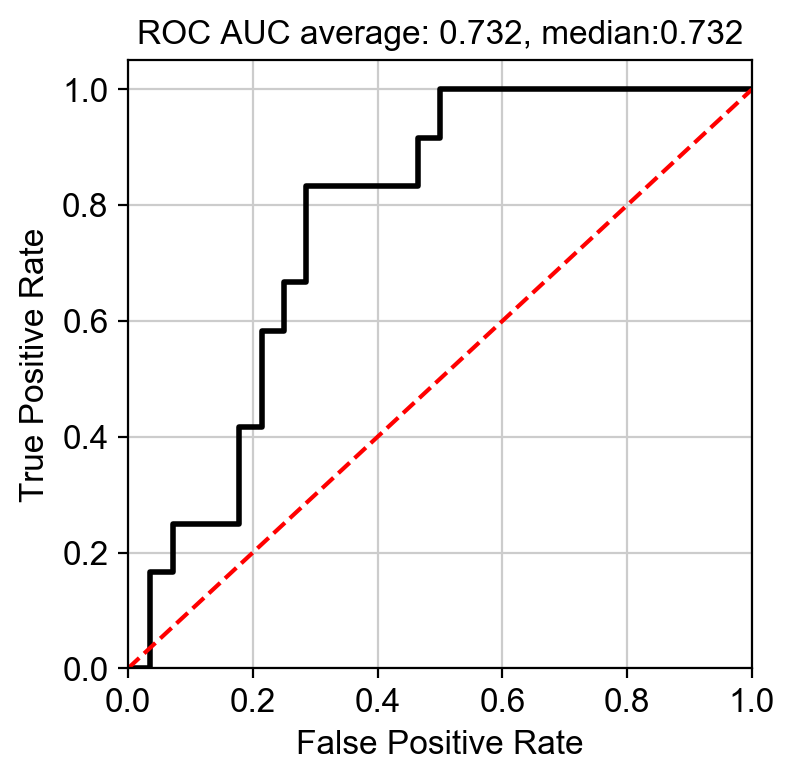

In [242]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [243]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrmuculcers', n_boot=1)
ROC_compare['mucosalulcers_all'] = ROC_AUC[0]

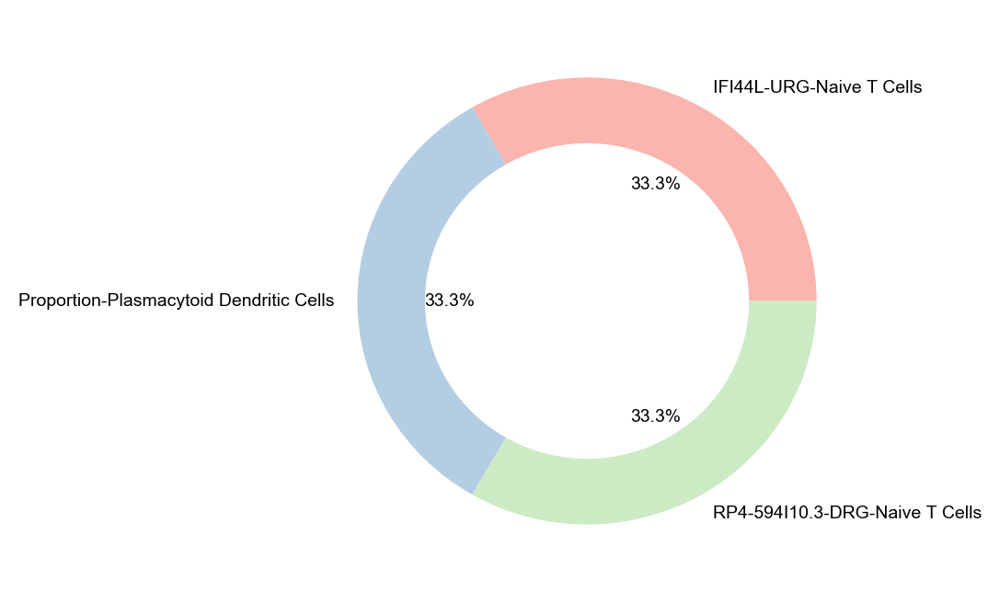

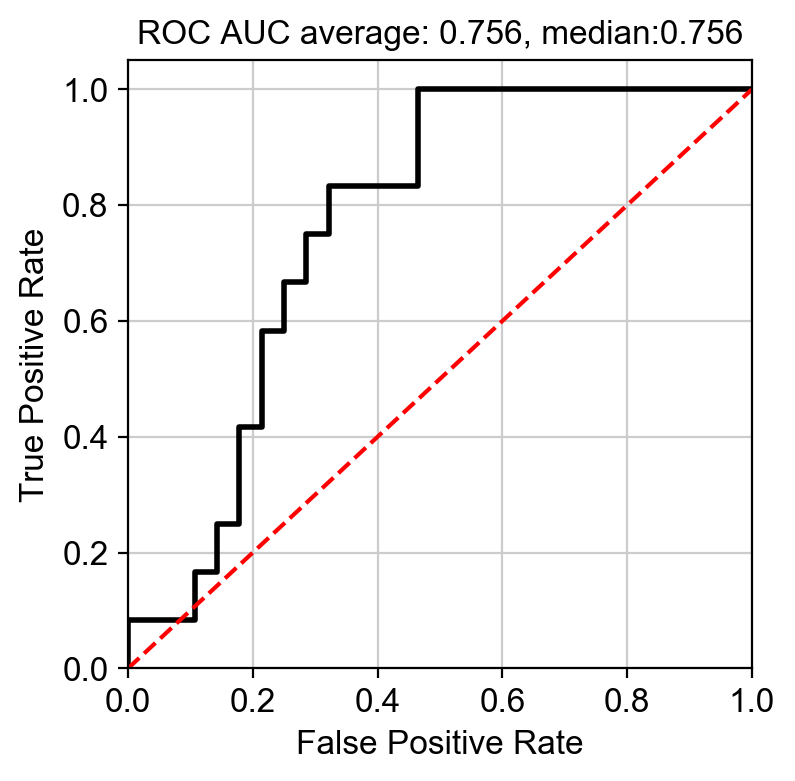

In [244]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Arthritis

In [245]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrarthritisc', n_boot=1)
ROC_compare['arthritis_holdout'] = ROC_AUC[0]

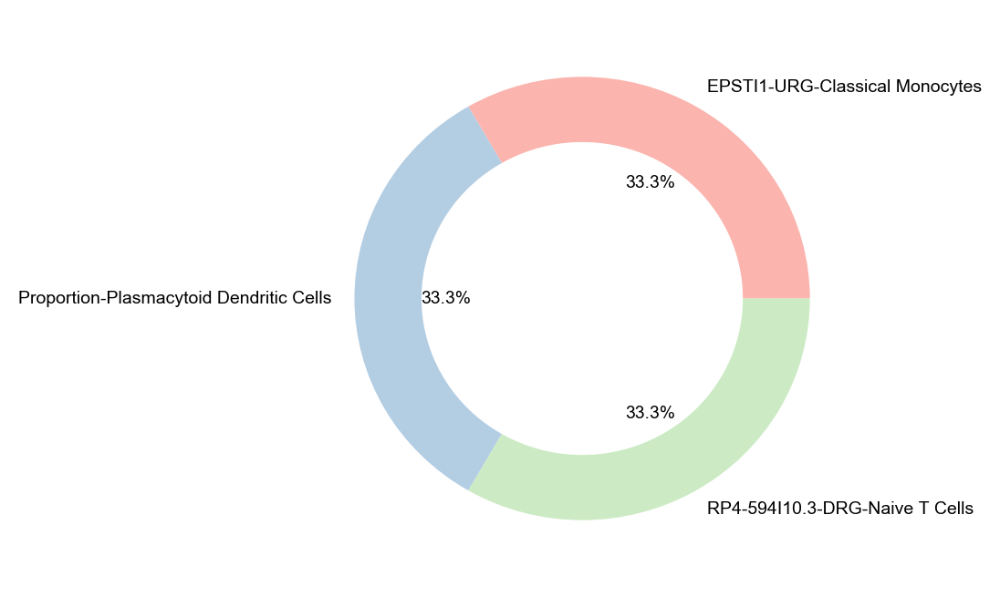

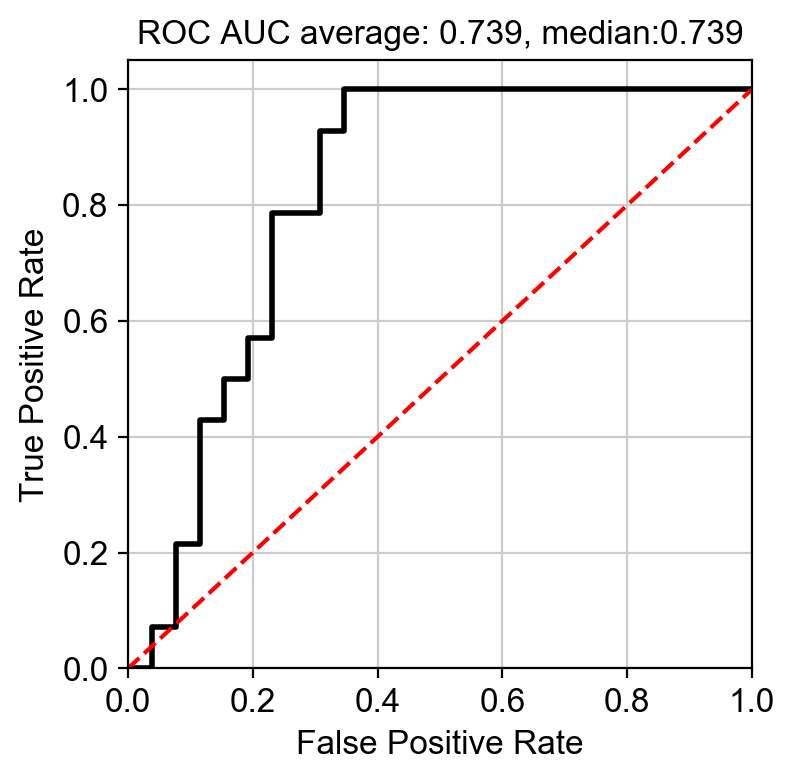

In [246]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [247]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrarthritisc', n_boot=1)
ROC_compare['arthritis_all'] = ROC_AUC[0]

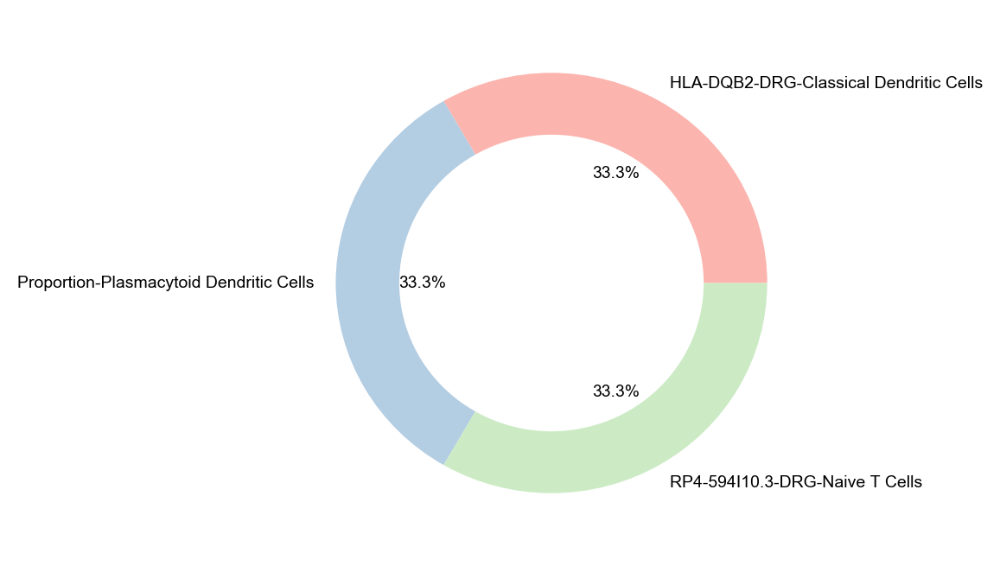

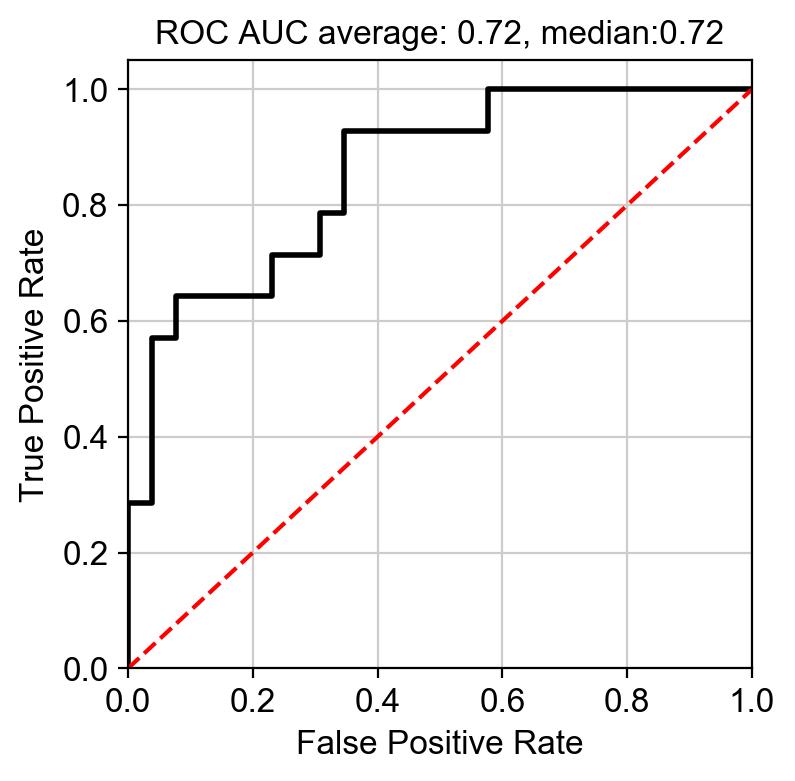

In [248]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Serositis

In [249]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrarthritisc', n_boot=1)
ROC_compare['serositis_holdout'] = ROC_AUC[0]

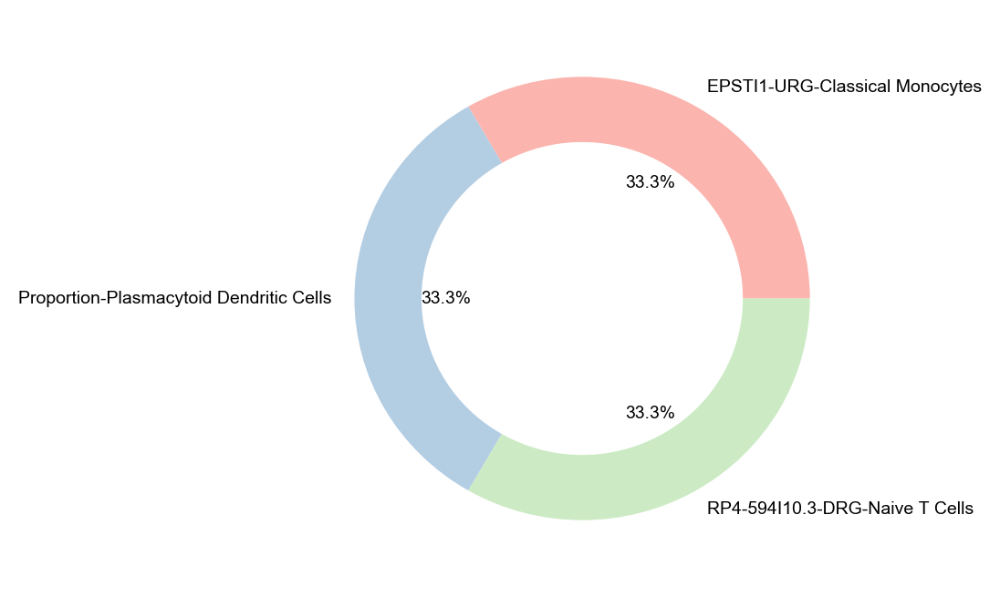

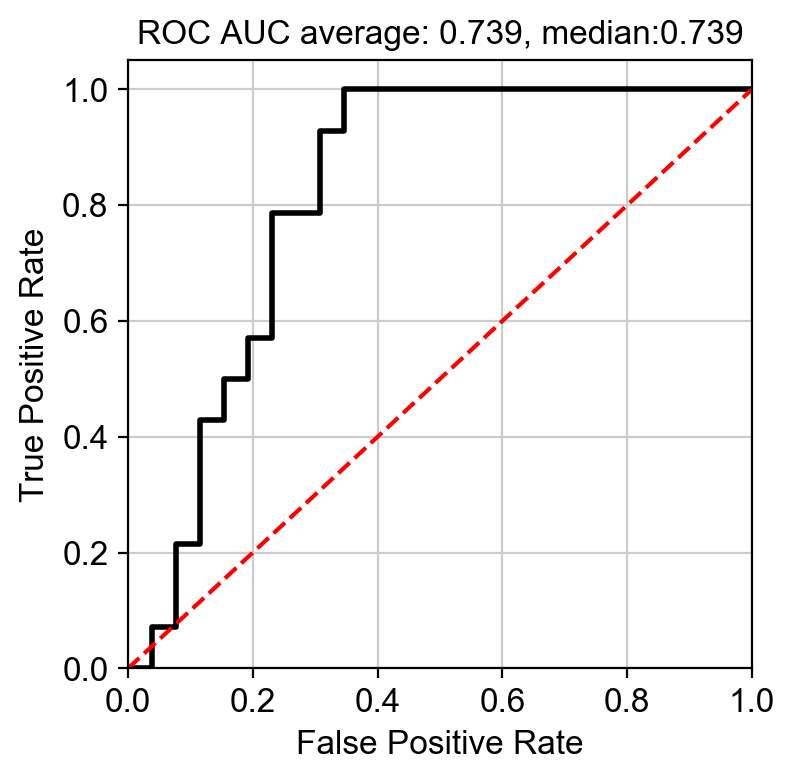

In [250]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [251]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrarthritisc', n_boot=1)
ROC_compare['serositis_all'] = ROC_AUC[0]

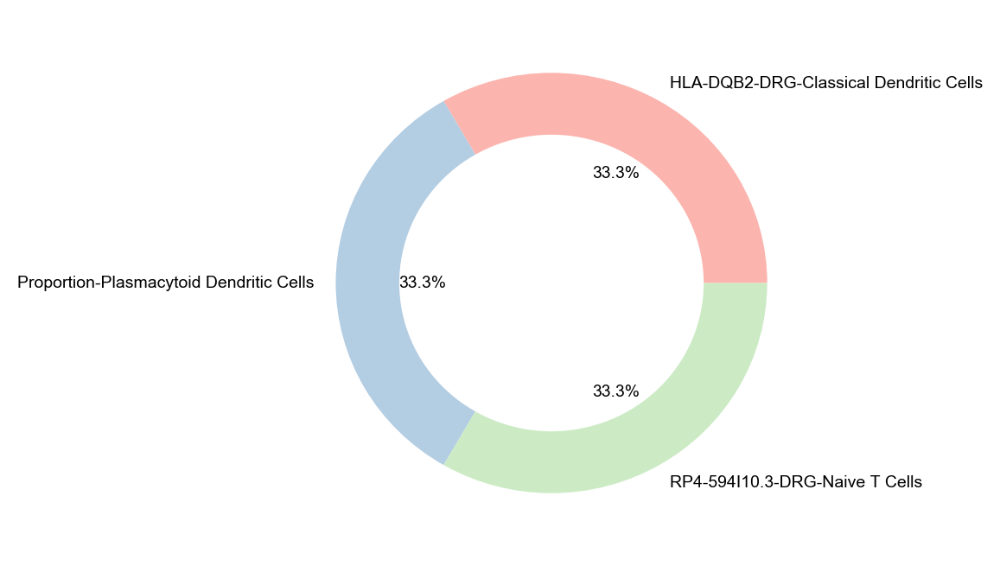

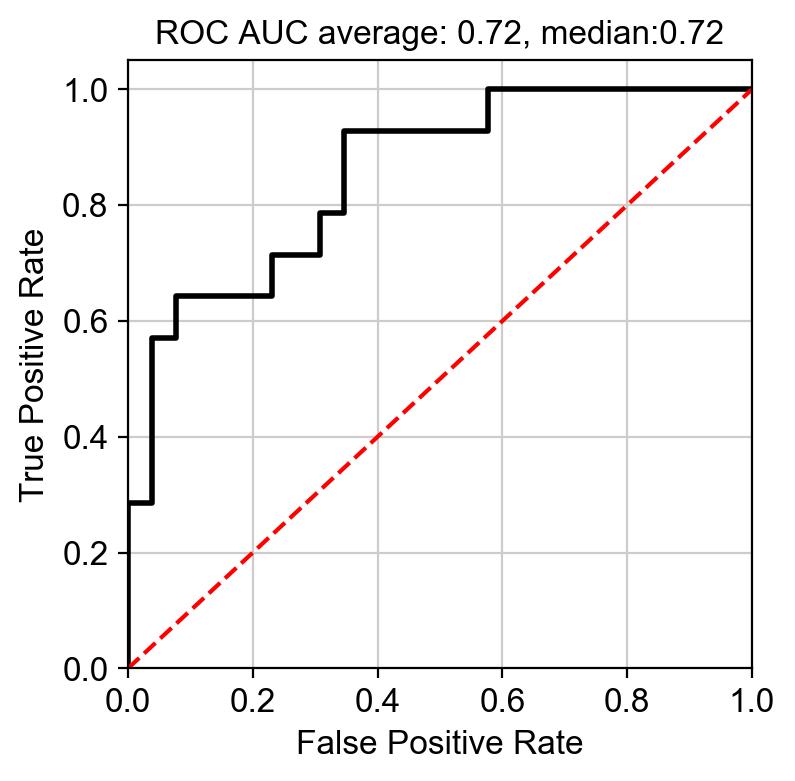

In [252]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Lupus Nephritis

In [253]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrlupneph', n_boot=1)
ROC_compare['Lupusnephritis_holdout'] = ROC_AUC[0]

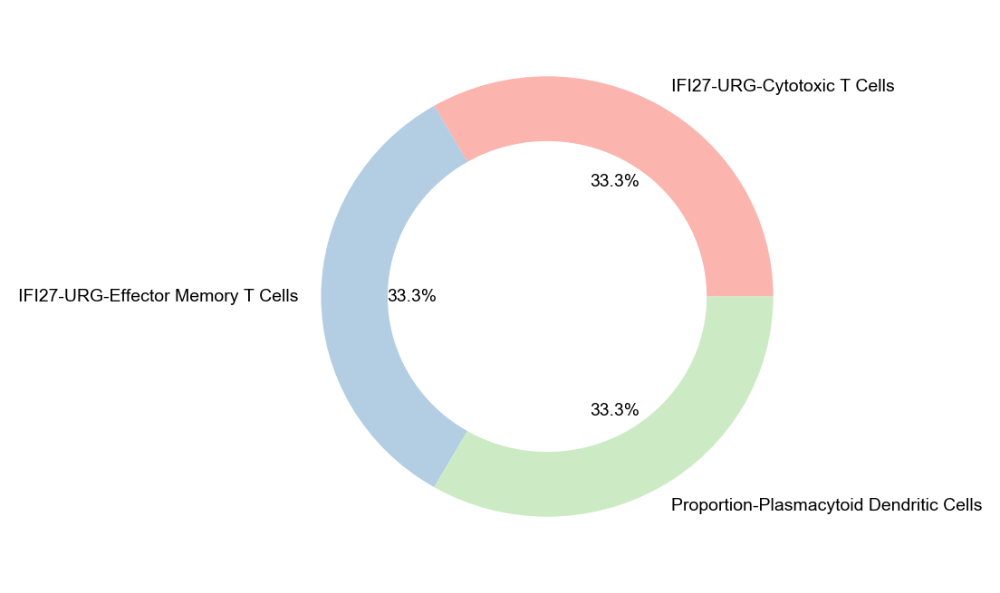

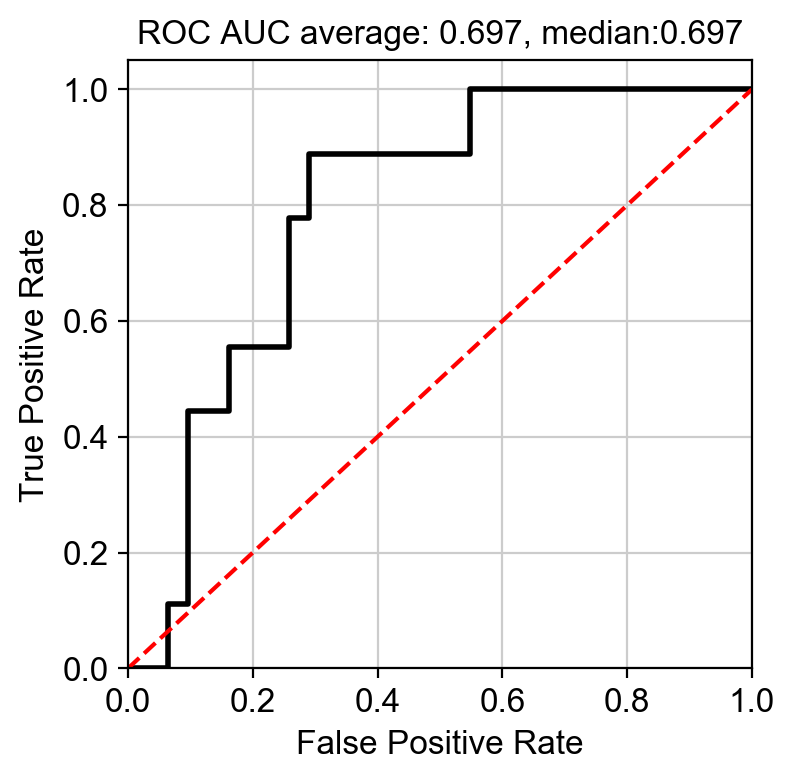

In [254]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [255]:
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrlupneph', n_boot=1)
ROC_compare['Lupusnephritis_all'] = ROC_AUC[0]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


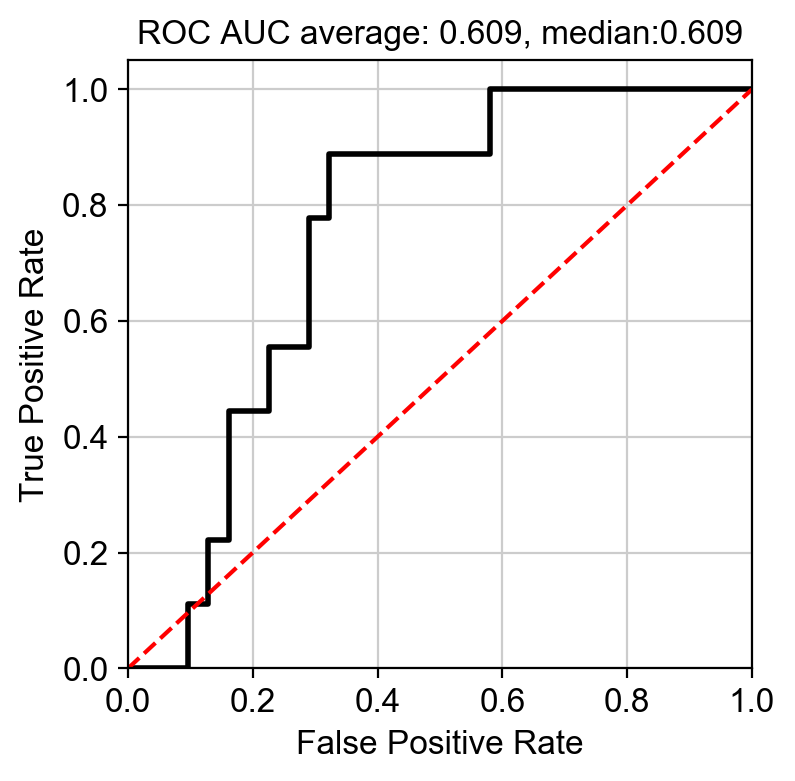

In [256]:
plot_ROC(ROC_AUC, FPR, TPR)

# Renal involvement

In [257]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrrenalc', n_boot=1)
ROC_compare['Renal_holdout'] = ROC_AUC[0]

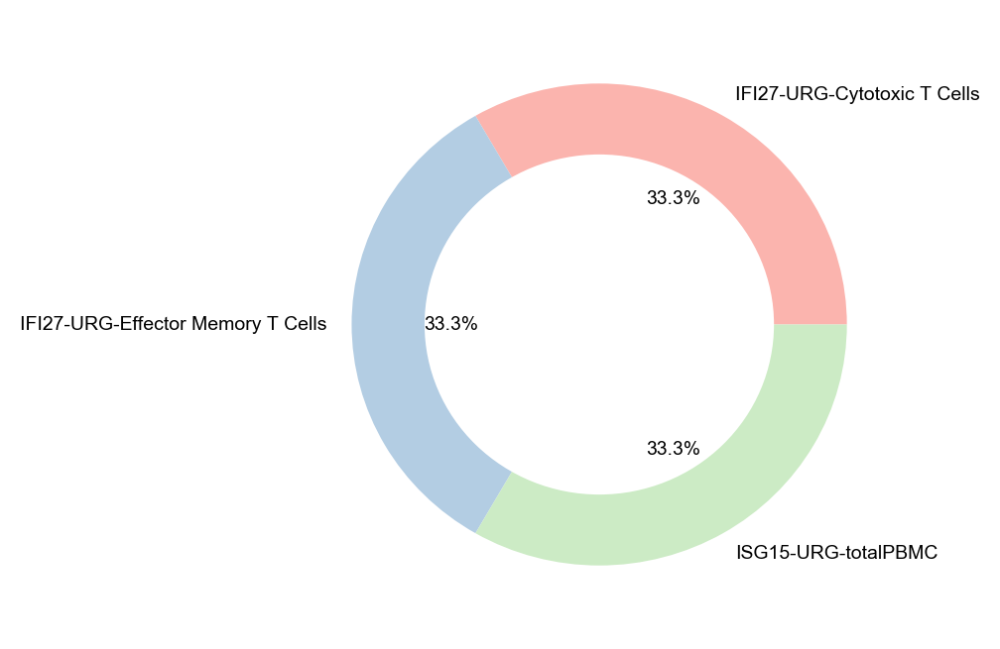

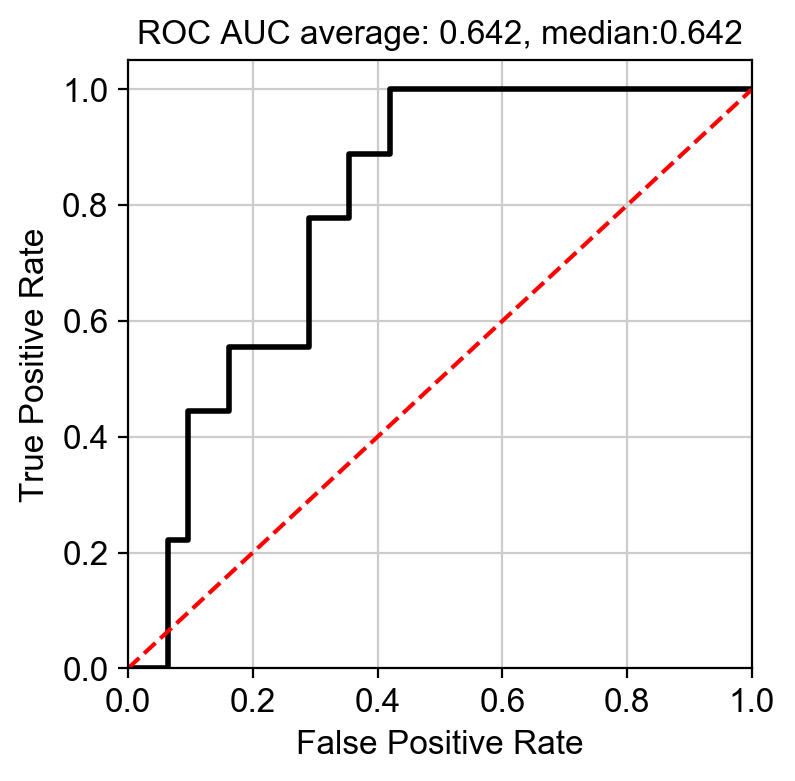

In [258]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [259]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrrenalc', n_boot=1)
ROC_compare['Renal_all'] = ROC_AUC[0]

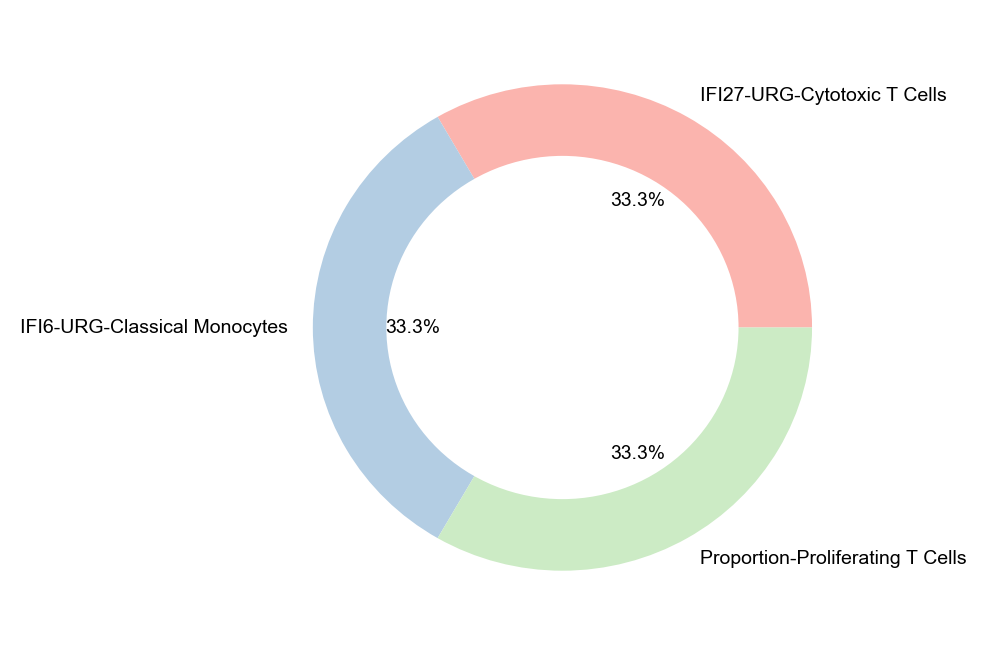

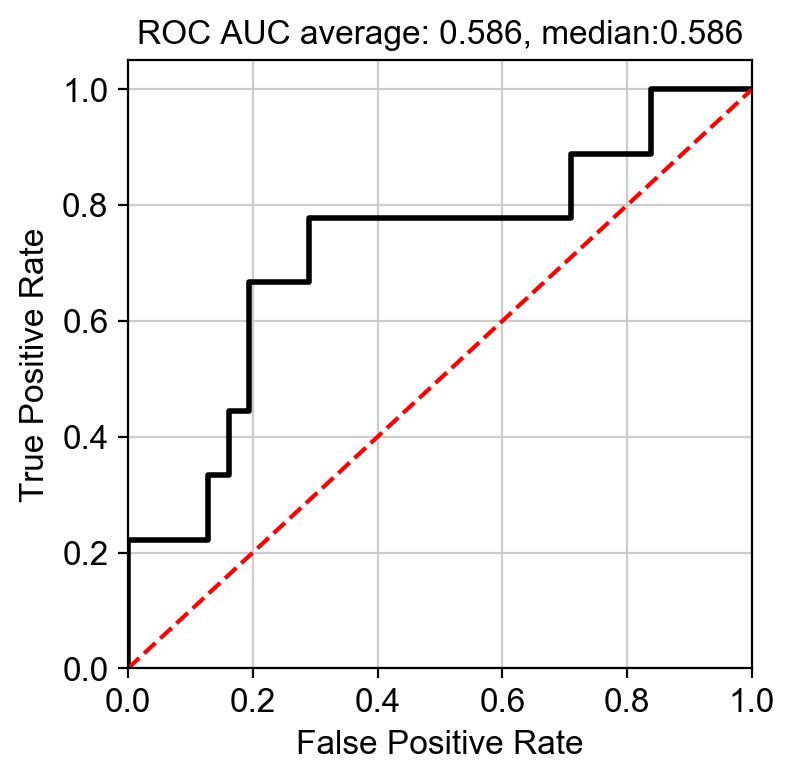

In [260]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# anti-ANA

In [261]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acranac', n_boot=1)
ROC_compare['ANA_holdout'] = ROC_AUC[0]

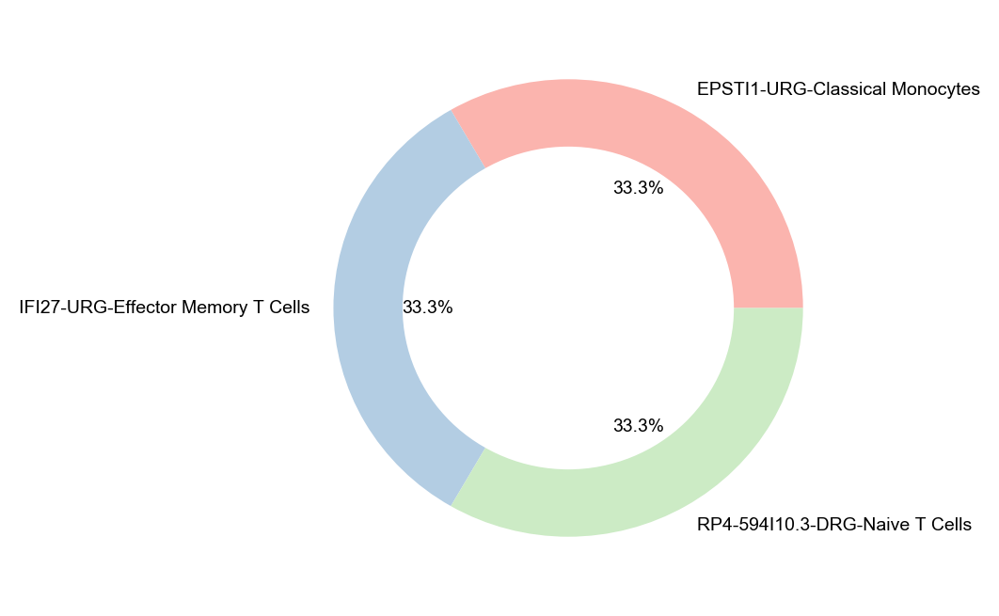

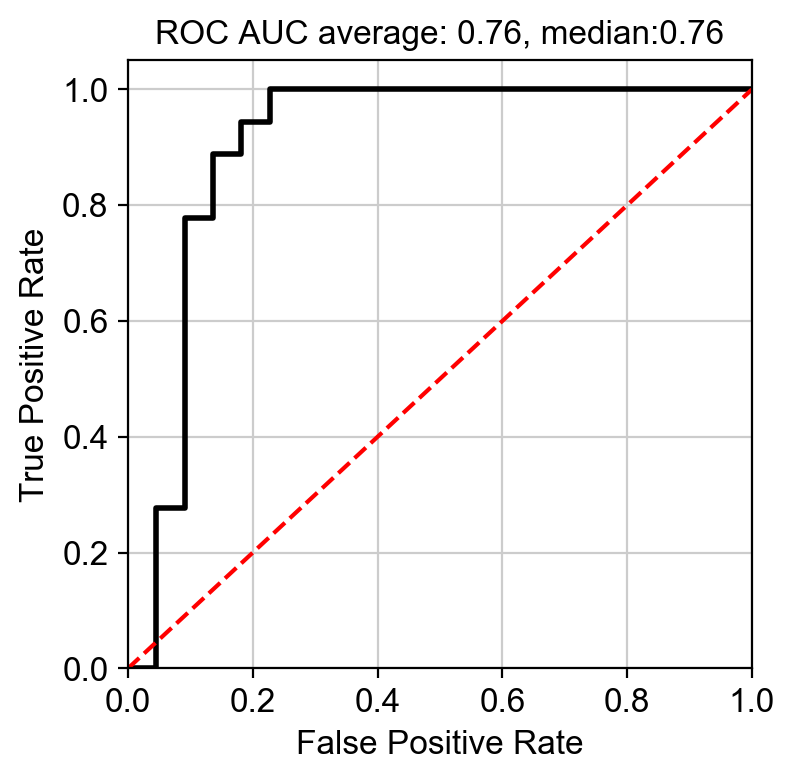

In [262]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [263]:
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acranac', n_boot=1)
ROC_compare['ANA_all'] = ROC_AUC[0]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


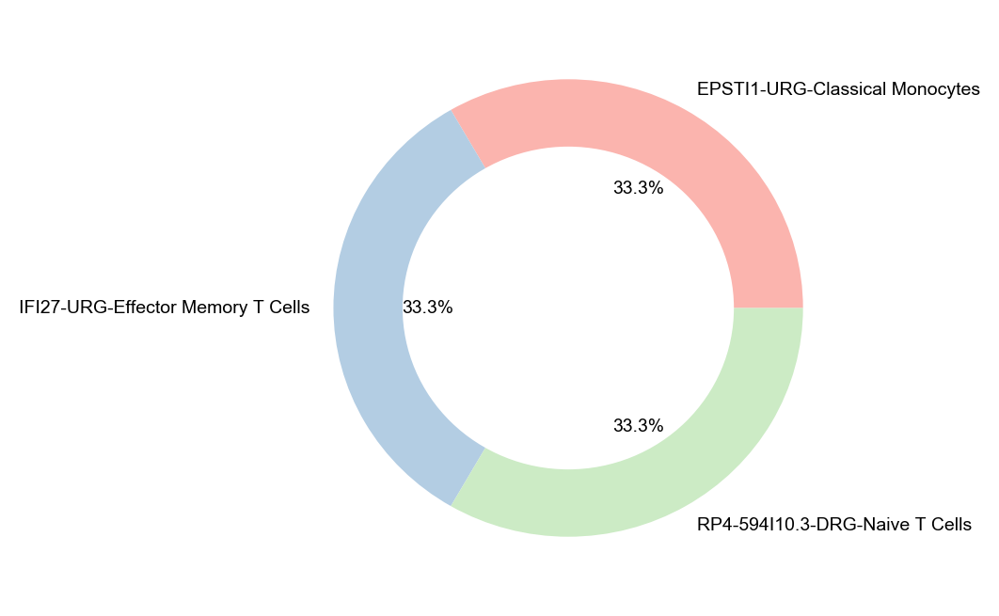

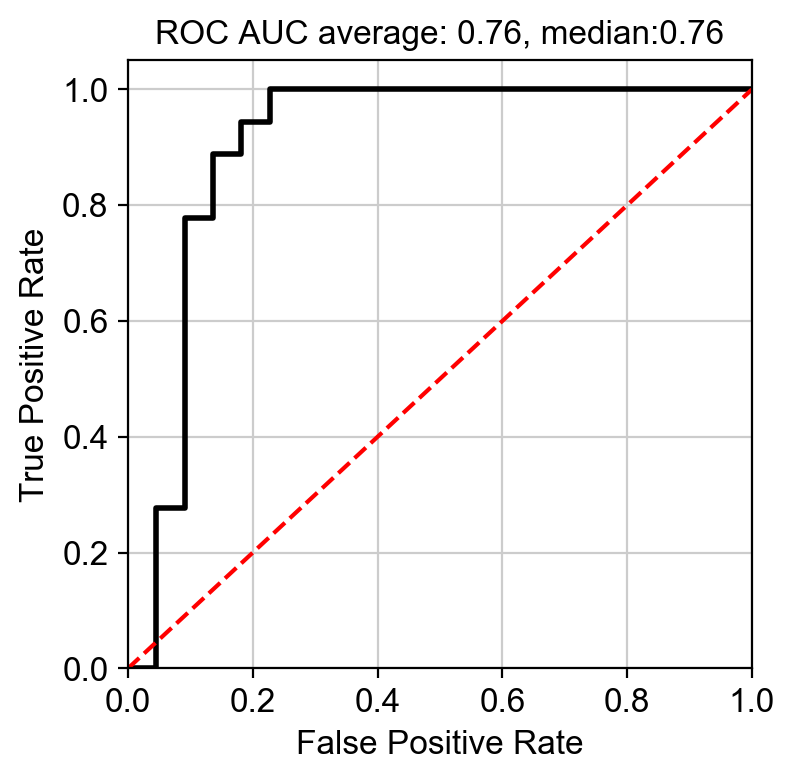

In [264]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# anti-Smith

In [265]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrantismith', n_boot=1)
ROC_compare['anti-Smith_holdout'] = ROC_AUC[0]

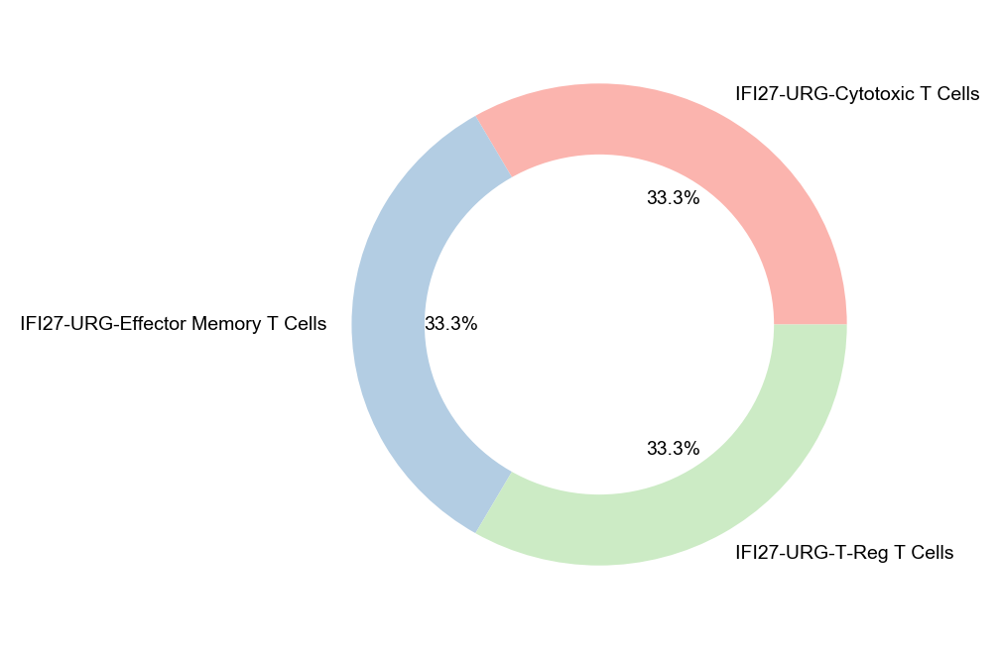

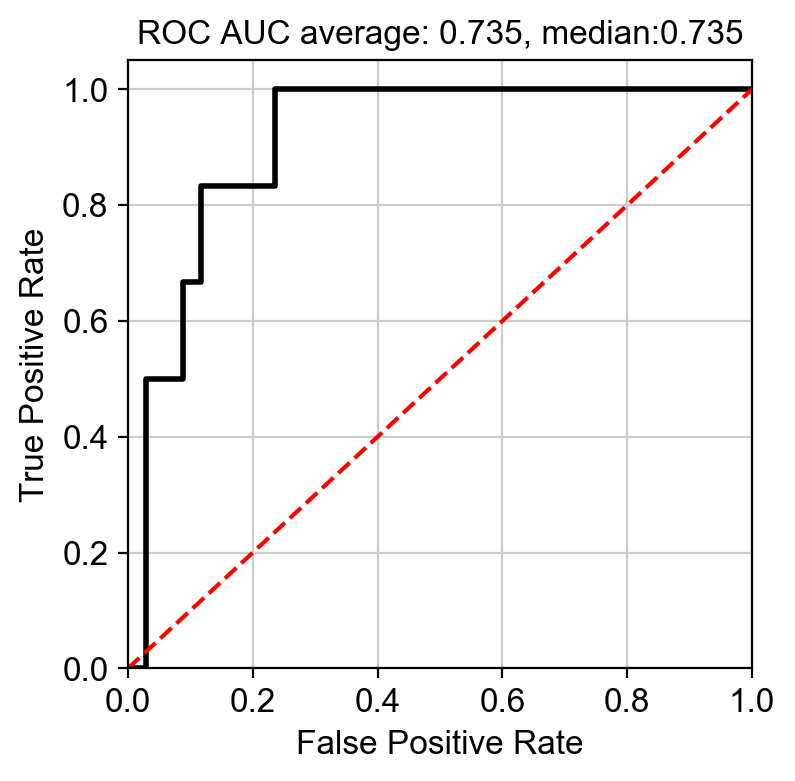

In [266]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [267]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrantismith', n_boot=1)
ROC_compare['anti-Smith_all'] = ROC_AUC[0]

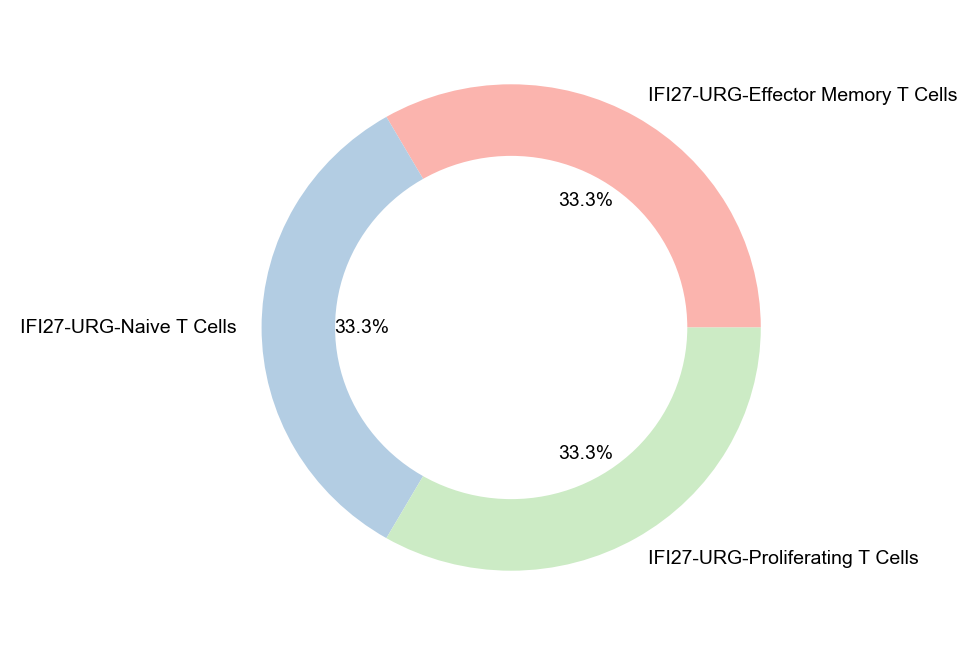

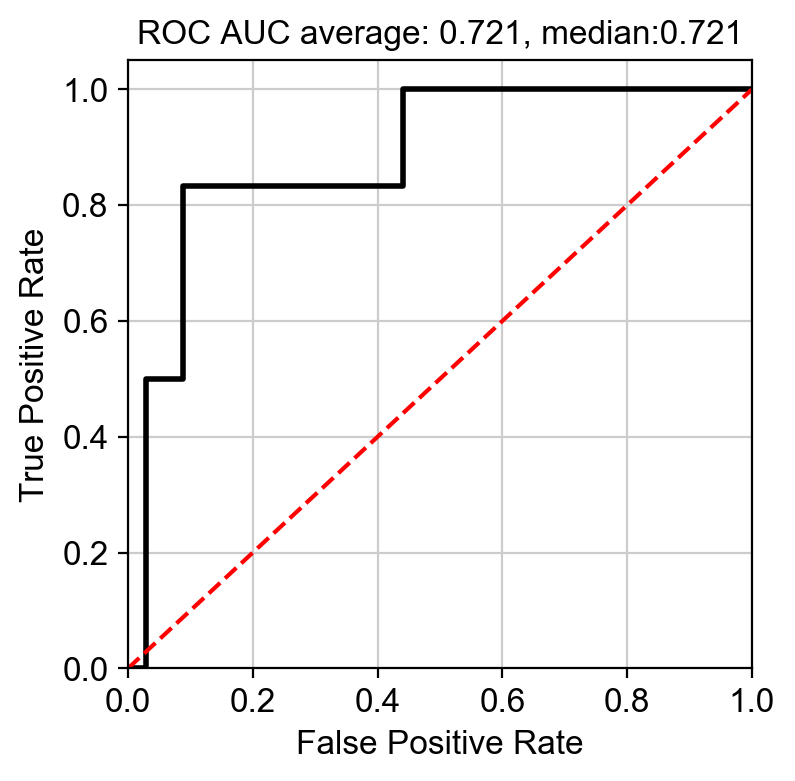

In [268]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# anti-dsDNA

In [269]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrantidsdna', n_boot=1)
ROC_compare['anti-dsDNA_holdout'] = ROC_AUC[0]

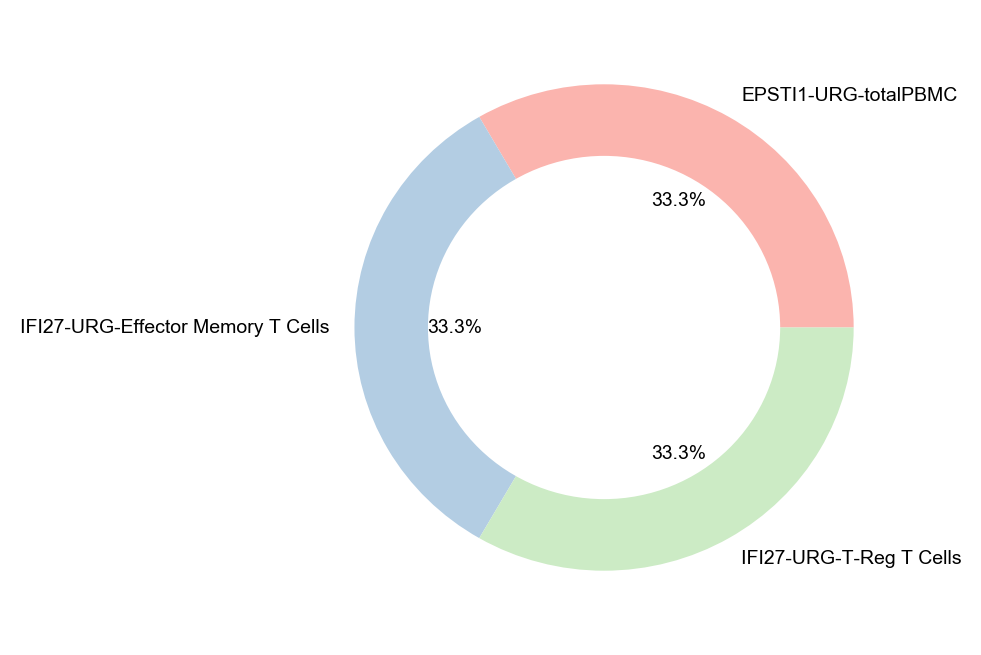

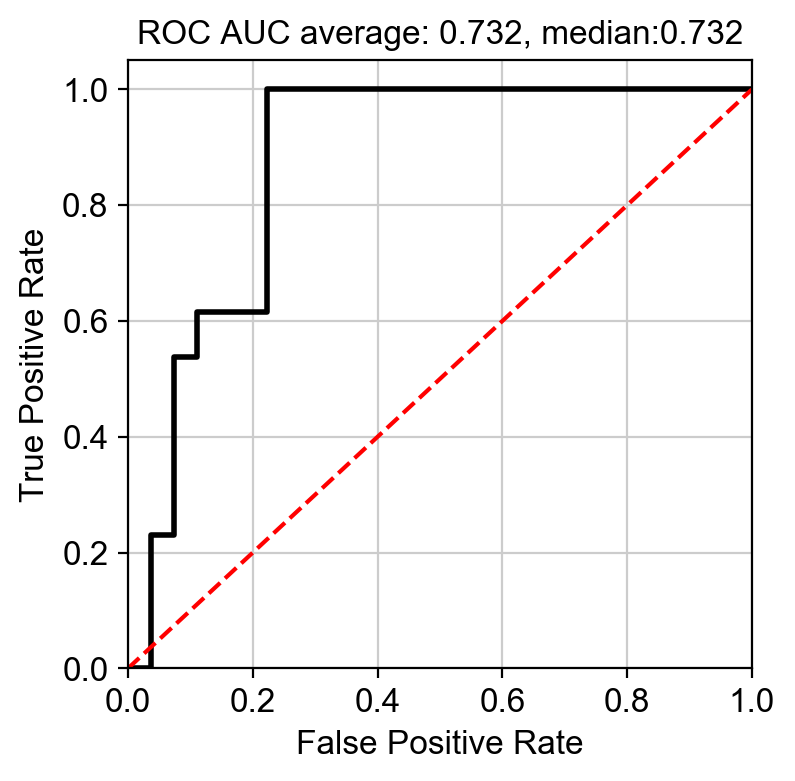

In [270]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [271]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrantidsdna', n_boot=1)
ROC_compare['anti-dsDNA_all'] = ROC_AUC[0]

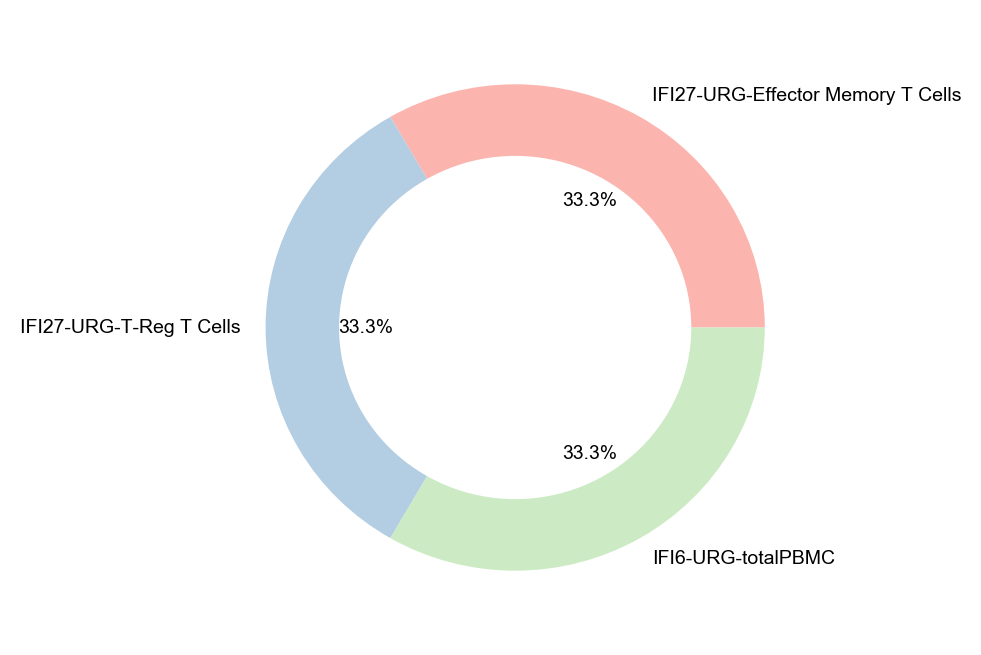

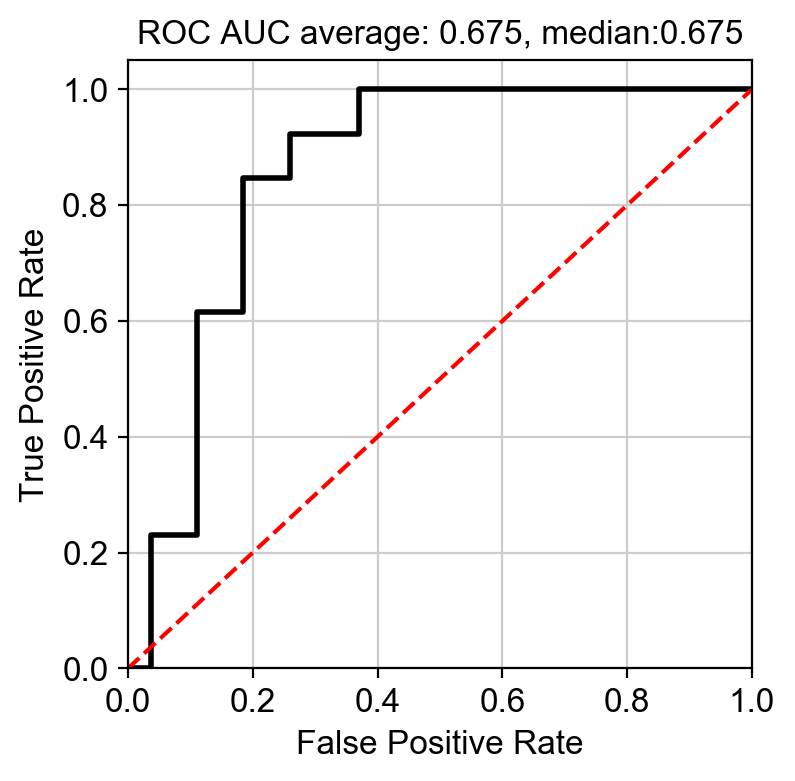

In [272]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# anti-phospholipid antigen

In [273]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrapla', n_boot=1)
ROC_compare['anti-phospholipid_holdout'] = ROC_AUC[0]

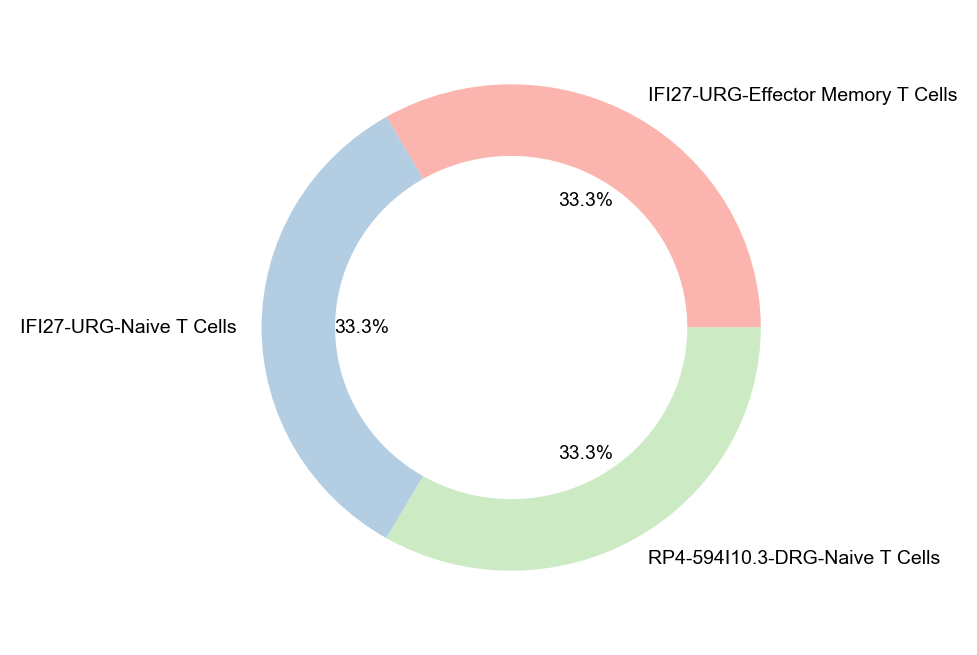

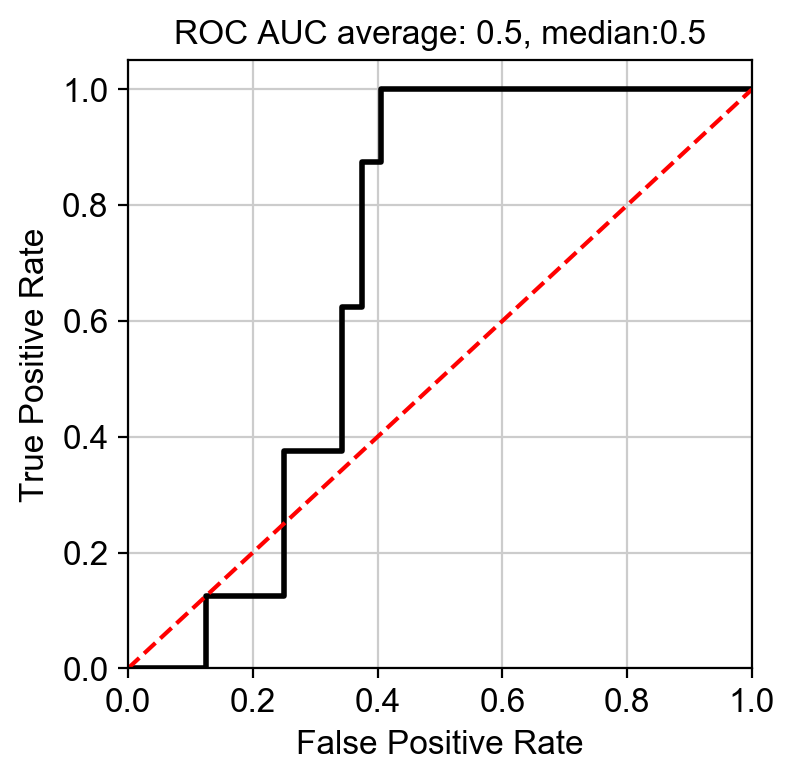

In [274]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [275]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrapla', n_boot=1)
ROC_compare['anti-phospholipid_all'] = ROC_AUC[0]

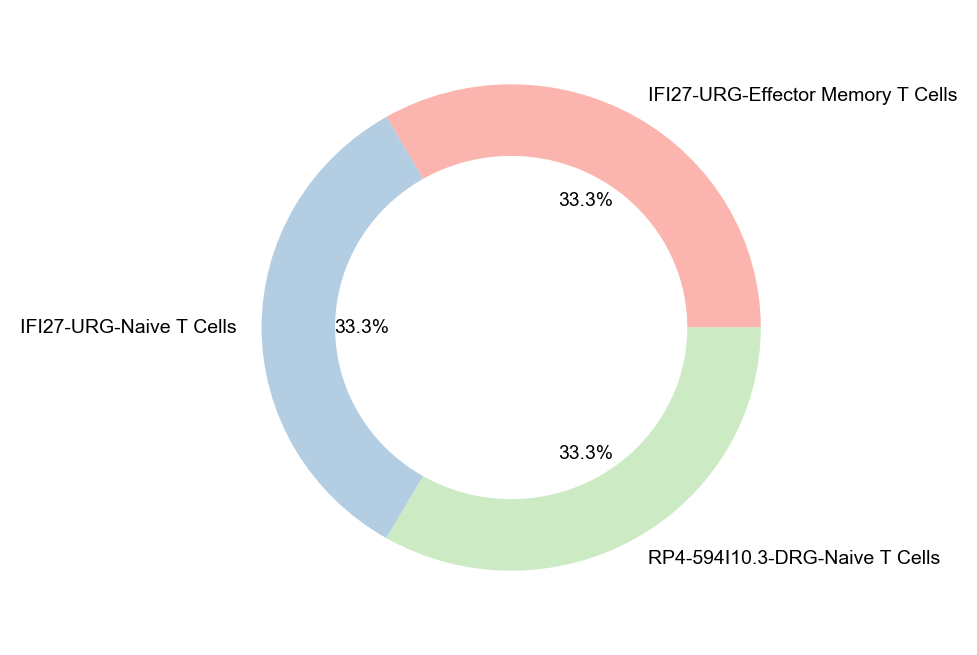

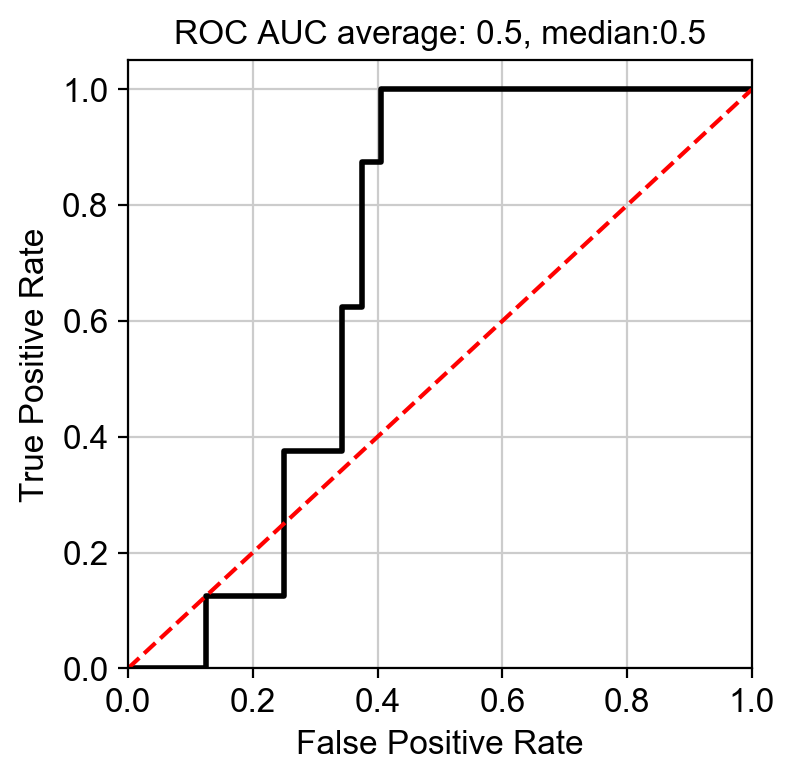

In [276]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Lymphopenia

In [277]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrlymphopenia', n_boot=1)
ROC_compare['lymphopenia_holdout'] = ROC_AUC[0]


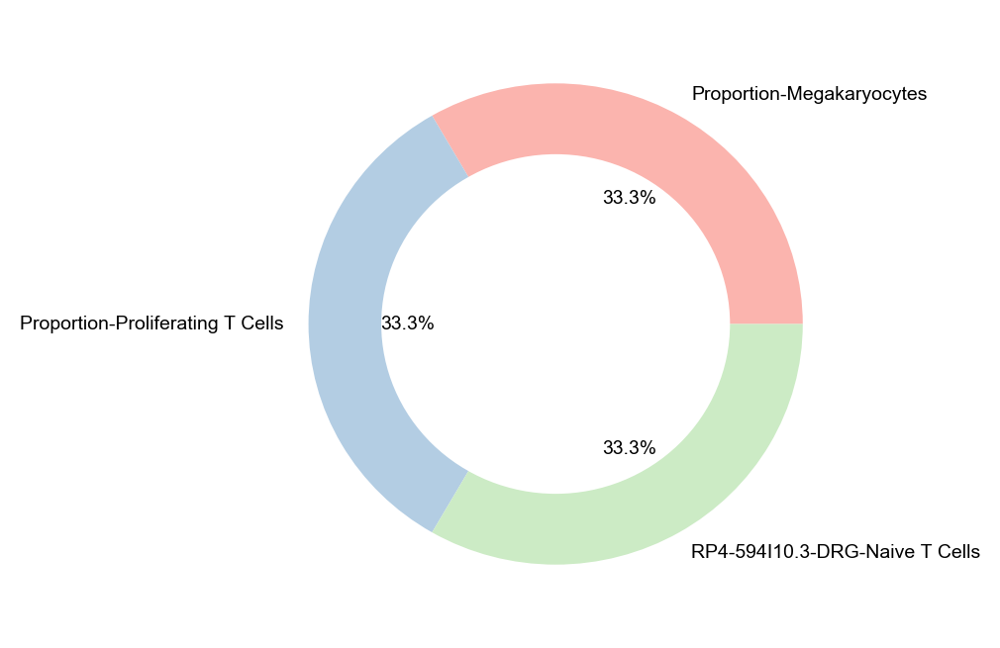

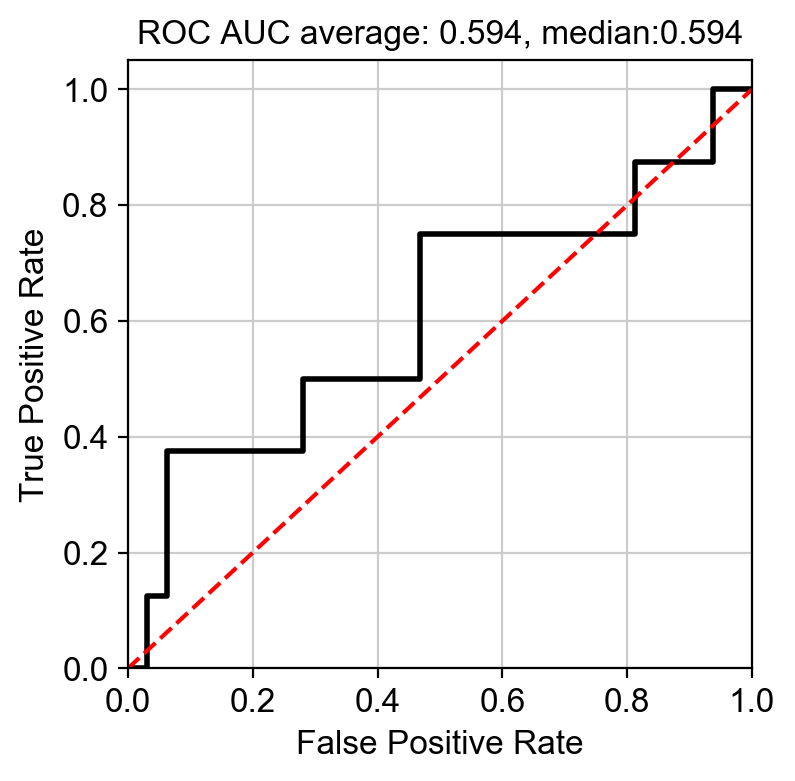

In [278]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [279]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrlymphopenia', n_boot=1)
ROC_compare['lymphopenia_all'] = ROC_AUC[0]

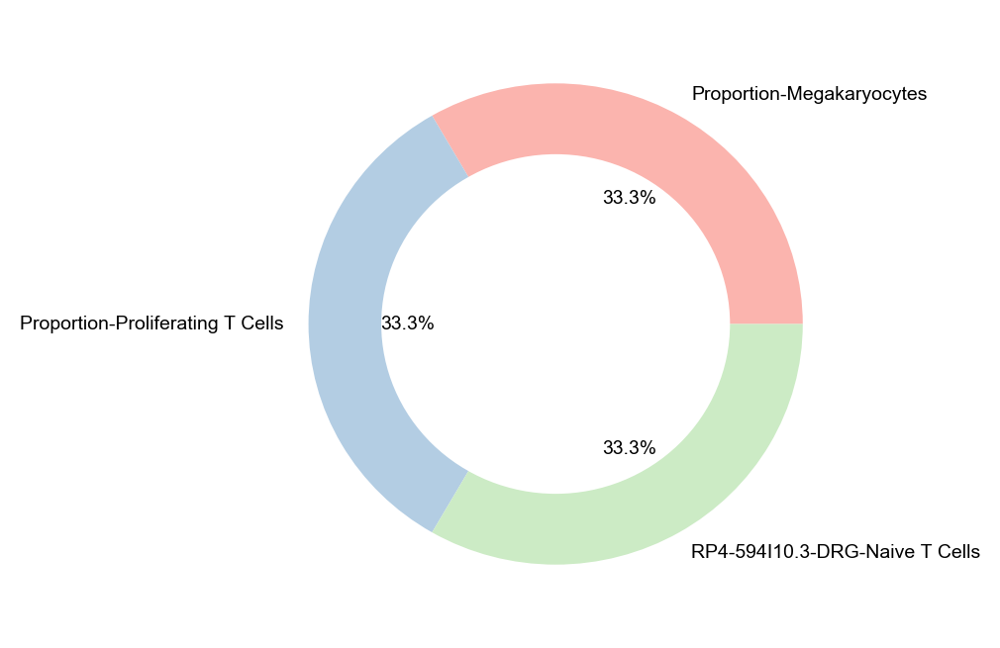

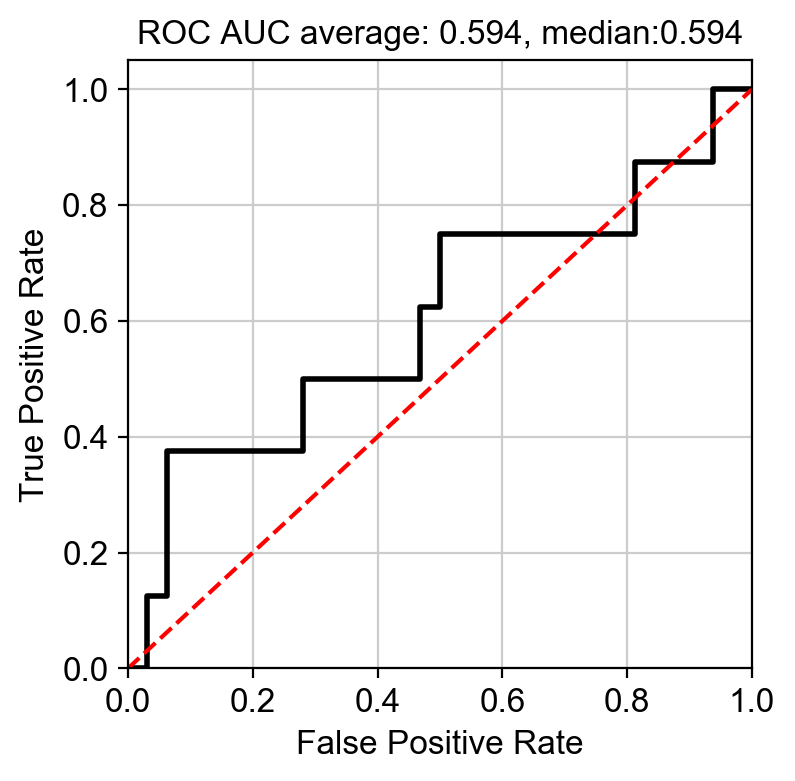

In [280]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Leukopenia

In [281]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrleukopenia', n_boot=1)
ROC_compare['leukopenia_holdout'] = ROC_AUC[0]

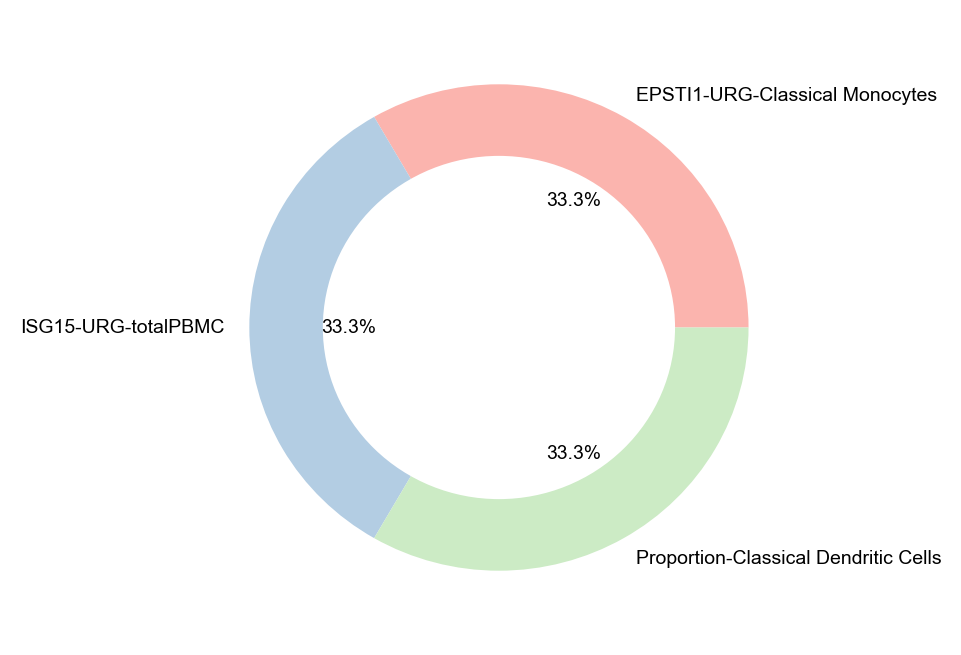

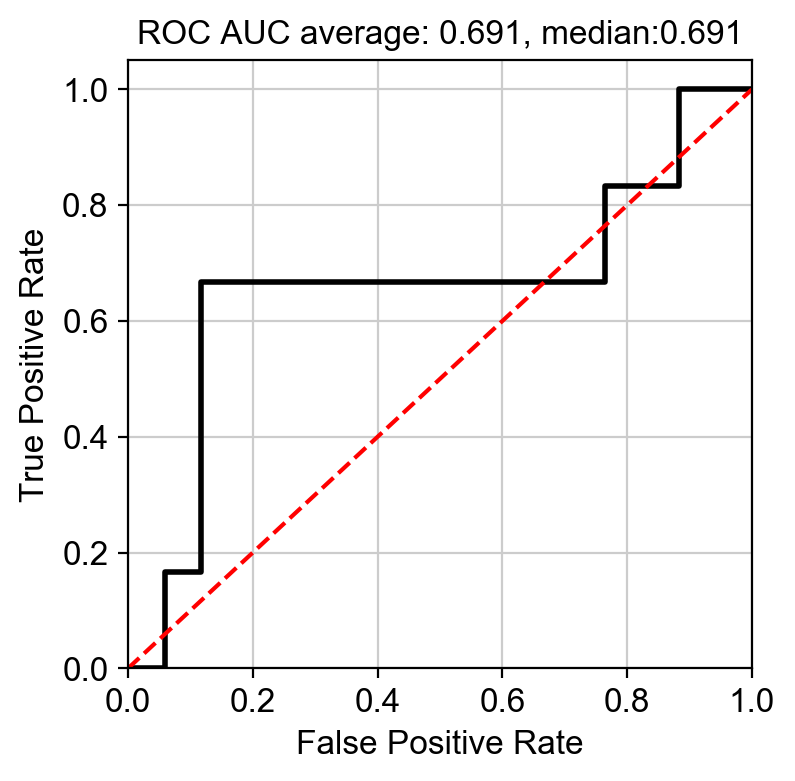

In [282]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [283]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrleukopenia', n_boot=1)
ROC_compare['leukopenia_all'] = ROC_AUC[0]

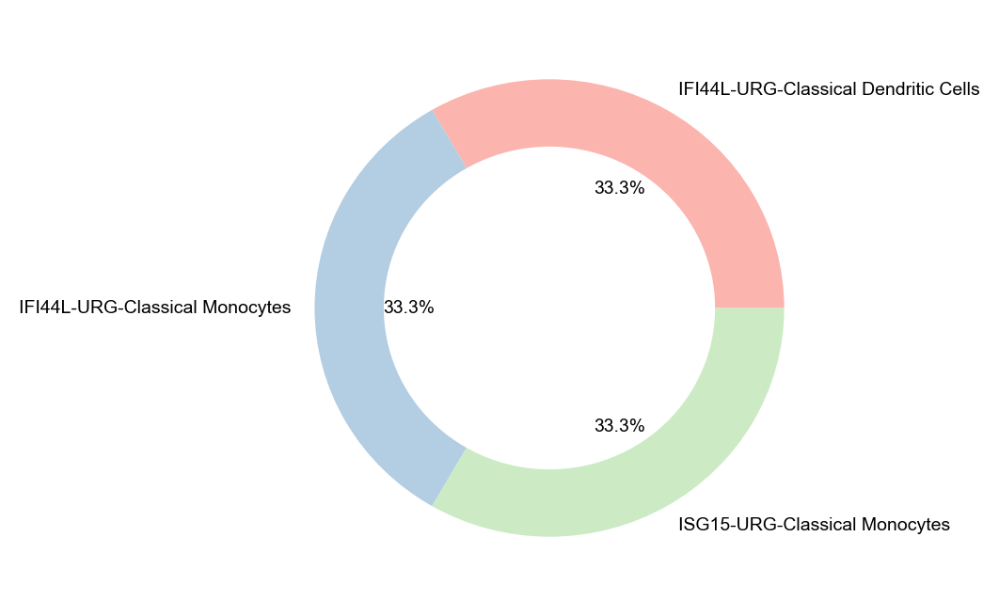

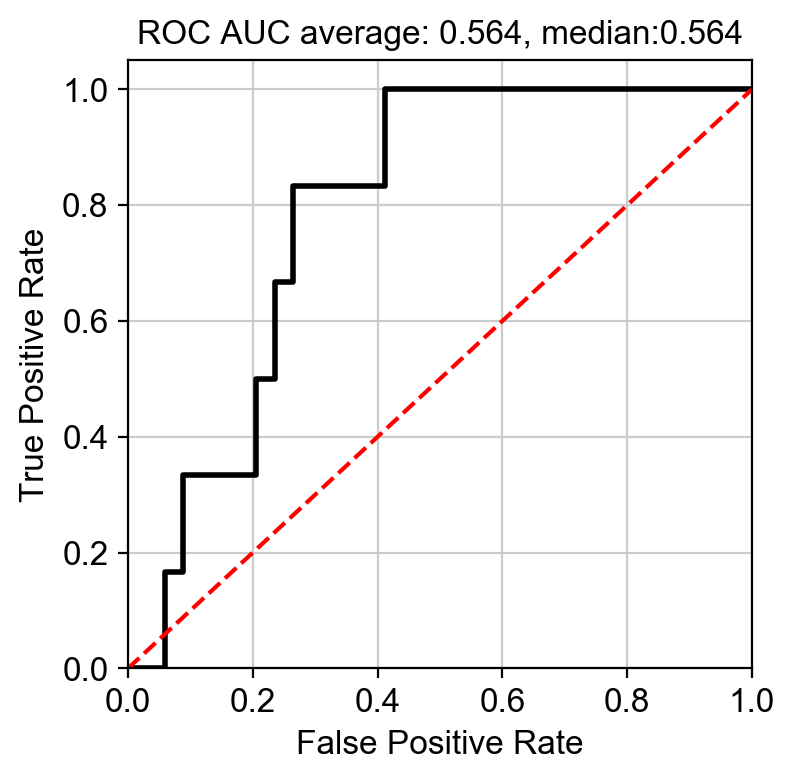

In [284]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Thrombocytopenia

In [285]:
%%capture
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_holdout, Test_people, clincal_var='acrthrombocyto', n_boot=1)
ROC_compare['thrombocytopenia_holdout'] = ROC_AUC[0]



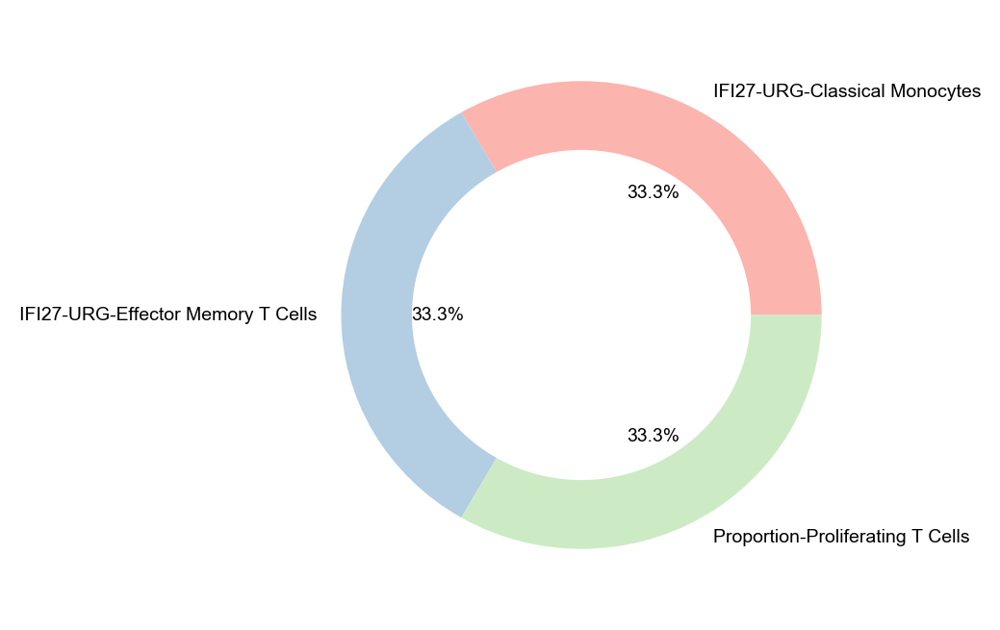

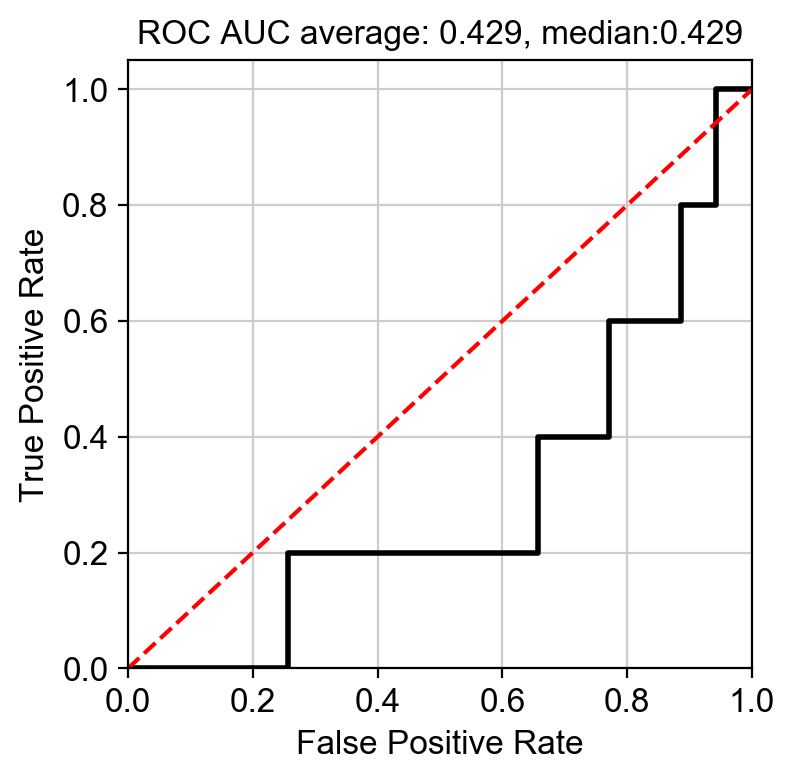

In [286]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

In [287]:
VOIs, ROC_AUC, FPR, TPR = logistic_regression(corr_matrix_all, Test_people, clincal_var='acrthrombocyto', n_boot=1)
ROC_compare['thrombocytopenia_all'] = ROC_AUC[0]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


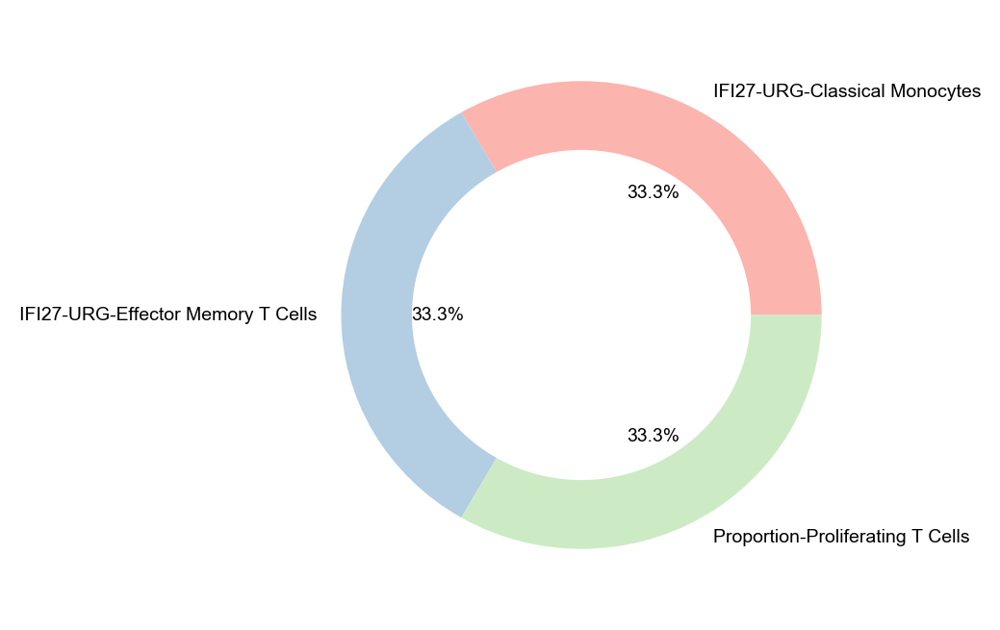

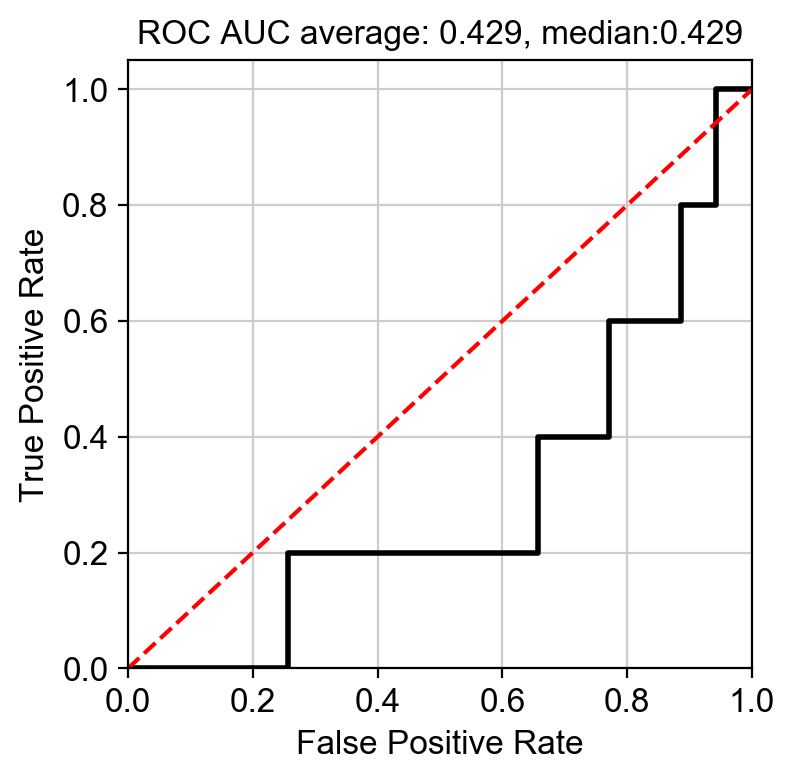

In [288]:
show_VOI(VOIs)
plot_ROC(ROC_AUC, FPR, TPR)

# Correlation plot comparing holdout and all datasets validation

(0.0, 1.0)

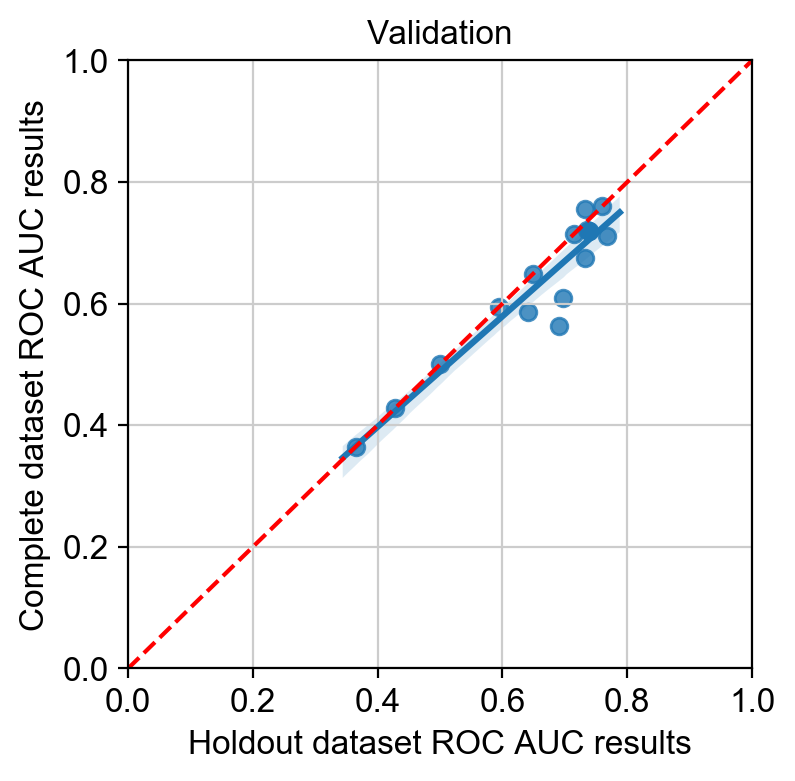

In [314]:
keys = np.asarray(list(ROC_compare.keys()))
vals = np.asarray(list(ROC_compare.values()))
endings = [keys[ii].split('_')[1] for ii in range(len(keys))]
sns.regplot(vals[np.asarray(endings)=='holdout'], vals[np.asarray(endings)=='all'])
plt.xlabel('Holdout dataset ROC AUC results')
plt.ylabel('Complete dataset ROC AUC results')
plt.title('Validation')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])